In [1]:
import pandas as pd
import xarray as xr
import numpy as np

from datetime import datetime, timedelta

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

import pickle as pkl

from mpl_toolkits.basemap import Basemap

import random
import os

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = '42'
    np.random.seed(seed)

In [2]:
from sklearn.model_selection import cross_val_score, cross_validate

### Data 불러오기

In [3]:
def read_weahter_nc_to_df(file_name, type="wind"):
    
    if type == "wind":
        ### DWD : Hornsea 1 (풍력 발전소) 관련 날씨 예보
        df = xr.open_dataset(file_name)
        
        # 6개의 feature 모두 활용하기 위함
        df = df[['RelativeHumidity', 'Temperature', 'WindDirection', 
                 'WindDirection:100', 'WindSpeed', 'WindSpeed:100']].mean(dim=["latitude", "longitude"]).to_dataframe().reset_index()

        if 'reference_time' in df.columns and 'valid_time' in df.columns:
            
            df.rename(columns={'reference_time' : 'ref_datetime', 'valid_time' : 'valid_datetime'}, inplace=True)
            df["ref_datetime"] = df["ref_datetime"].dt.tz_localize("UTC")
            df["valid_datetime"] = df["ref_datetime"] + pd.TimedeltaIndex(df["valid_datetime"], unit="hours")
            df.rename(columns={"Temperature":"Temperature_wind"}, inplace=True)
            
        else:
            
            df["ref_datetime"] = df["ref_datetime"].dt.tz_localize("UTC")
            df["valid_datetime"] = df["ref_datetime"] + pd.TimedeltaIndex(df["valid_datetime"], unit="hours")
            df.rename(columns={"Temperature":"Temperature_wind"}, inplace=True)
    
        return df
    
    if type == "solar":
        ### DWD : PES 10 (태양광 발전소) 관련 날씨 예보
        df = xr.open_dataset(file_name)
        
        # 3개의 feature 모두 활용하기 위함
        df = df[['CloudCover', 'SolarDownwardRadiation', 'Temperature']].mean(dim="point").to_dataframe().reset_index()

        if 'reference_time' in df.columns and 'valid_time' in df.columns:
            df.rename(columns={'reference_time' : 'ref_datetime', 'valid_time' : 'valid_datetime'}, inplace=True)
            df["ref_datetime"] = df["ref_datetime"].dt.tz_localize("UTC")
            df["valid_datetime"] = df["ref_datetime"] + pd.TimedeltaIndex(df["valid_datetime"],unit="hours")
            df.rename(columns={"Temperature":"Temperature_solar"}, inplace=True)
        
        else:
            df["ref_datetime"] = df["ref_datetime"].dt.tz_localize("UTC")
            df["valid_datetime"] = df["ref_datetime"] + pd.TimedeltaIndex(df["valid_datetime"],unit="hours")
            df.rename(columns={"Temperature":"Temperature_solar"}, inplace=True)
        
        return df


def read_energy_nc_to_df(file_name):
    
    ### DWD : Hornsea 1 (풍력 발전소) 관련 날씨 예보
    energy_data = pd.read_csv(file_name)
    energy_data["dtm"] = pd.to_datetime(energy_data["dtm"])
    energy_data["Wind_MWh_credit"] = 0.5*energy_data["Wind_MW"] - energy_data["boa_MWh"]
    energy_data["Solar_MWh_credit"] = 0.5*energy_data["Solar_MW"]
    energy_data.head()
        
    return energy_data

def merge_weather_and_energy(df_wind, df_solar, df_energy):
    
    modelling_table = df_wind.merge(df_solar, how="outer", on=["ref_datetime", "valid_datetime"])
    modelling_table = modelling_table.set_index("valid_datetime").groupby("ref_datetime").resample("30T").interpolate("linear")
    modelling_table = modelling_table.drop(columns="ref_datetime", axis=1).reset_index()
    
    modelling_table = modelling_table.merge(df_energy, how="inner", 
                                            left_on="valid_datetime", 
                                            right_on="dtm")
    
    modelling_table = modelling_table[modelling_table["valid_datetime"] - modelling_table["ref_datetime"] < np.timedelta64(50, "h")]
    
    return modelling_table

In [4]:
# DWD 예측 모델 사용 (수집 기간 : 2020-09-20 ~ 2023-10-27)
df_wind_1 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\dwd_icon_eu_hornsea_1_20200920_20231027.nc", type="wind")
df_solar_1 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\dwd_icon_eu_pes10_20200920_20231027.nc", type="solar")

energy_data_1 = read_energy_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\Energy_Data_20200920_20231027.csv")

# DWD 예측 모델 사용 (수집 기간 : 2023-10-27 ~ 2023-01-08)
df_wind_2 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\dwd_icon_eu_hornsea_1_20231027_20240108.nc", type="wind")
df_solar_2 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\dwd_icon_eu_pes10_20231027_20240108.nc", type="solar")

energy_data_2 = read_energy_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\Energy_Data_20200920_20240118.csv")

# DWD 예측 모델 사용 (수집 기간 : 2024-01-08 ~ 2024-01-29)
df_wind_3 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\dwd_icon_eu_hornsea_1_20240108_20240129.nc", type="wind")
df_solar_3 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\dwd_icon_eu_pes10_20240108_20240129.nc", type="solar")

energy_data_3 = read_energy_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\Energy_Data_20200920_20240118.csv")

# DWD 수집 데이터 취합
modeling_table_1 = merge_weather_and_energy(df_wind_1, df_solar_1, energy_data_1)
modeling_1_columns = modeling_table_1.columns

modeling_table_2 = merge_weather_and_energy(df_wind_2, df_solar_2, energy_data_2)
modeling_2_columns = modeling_table_2.columns
modeling_table_2 = modeling_table_2[modeling_table_2['ref_datetime'] != '2023-10-27 00:00:00+00:00']

modeling_table_3 = merge_weather_and_energy(df_wind_3, df_solar_3, energy_data_3)
modeling_3_columns = modeling_table_3.columns
modeling_table_3 = modeling_table_3[modeling_table_3['ref_datetime'] != '2024-01-08 00:00:00+00:00']

modeling_table_dwd = pd.concat([modeling_table_1, modeling_table_2, modeling_table_3], axis=0)

In [5]:
# NCEP 예측 모델 사용 (수집 기간 : 2020-09-20 ~ 2023-10-27)
df_ncep_wind_1 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\ncep_gfs_hornsea_1_20200920_20231027.nc", type="wind")
df_ncep_solar_1 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\ncep_gfs_pes10_20200920_20231027.nc", type="solar")

energy_data_1 = read_energy_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\Energy_Data_20200920_20231027.csv")

# NCEP 예측 모델 사용 (수집 기간 : 2023-10-27 ~ 2023-01-08)
df_ncep_wind_2 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\ncep_gfs_hornsea_1_20231027_20240108.nc", type="wind")
df_ncep_solar_2 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\ncep_gfs_pes10_20231027_20240108.nc", type="solar")

energy_data_2 = read_energy_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\Energy_Data_20200920_20240118.csv")

# NCEP 예측 모델 사용 (수집 기간 : 2024-01-08 ~ 2024-01-29)
df_ncep_wind_3 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\ncep_gfs_hornsea_1_20240108_20240129.nc", type="wind")
df_ncep_solar_3 = read_weahter_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\ncep_gfs_pes10_20240108_20240129.nc", type="solar")

energy_data_3 = read_energy_nc_to_df(file_name=r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\HEFTcom24-main\data\Energy_Data_20200920_20240118.csv")

# NCEP 수집 데이터 취합
modeling_table_ncef_1 = merge_weather_and_energy(df_ncep_wind_1, df_ncep_solar_1, energy_data_1)
modeling_table_ncef_1_columns = modeling_table_ncef_1.columns

modeling_table_ncef_2 = merge_weather_and_energy(df_ncep_wind_2, df_ncep_solar_2, energy_data_2)
modeling_table_ncef_2 = modeling_table_ncef_2[modeling_table_ncef_2['ref_datetime'] != '2023-10-27 00:00:00+00:00']

modeling_table_ncef_3 = merge_weather_and_energy(df_ncep_wind_3, df_ncep_solar_3, energy_data_3)
modeling_table_ncef_3 = modeling_table_ncef_3[modeling_table_ncef_3['ref_datetime'] != '2024-01-08 00:00:00+00:00']

modeling_table_ncef = pd.concat([modeling_table_ncef_1, modeling_table_ncef_2, modeling_table_ncef_3], axis=0)

In [6]:
# 두 데이터프레임을 연결하여 하나의 데이터프레임으로 만듦
merged_df = pd.concat([modeling_table_dwd, modeling_table_ncef], axis=0)

# 인덱스를 기준으로 그룹화하여 평균을 구함
modeling_table = merged_df.reset_index().groupby(['ref_datetime', 'valid_datetime']).mean().reset_index()

In [7]:
# # 가중치 설정
# weights = 0.7

# modeling_table_dwd['weights'] = weight
# modeling_table_ncef['weights'] = 1 - weight

# # 가중 평균 계산 함수 정의
# def weighted_average(group):
#     weights = group['weights']
#     # 날짜 데이터를 제외하고 가중 평균 계산
#     numeric_values = group.select_dtypes(include='number').iloc[:, :-1]    
#     return (numeric_values * weights.values[:, None]).sum() / weights.sum()

# #merged_df = pd.concat([modeling_table_dwd, modeling_table_ncef], axis=0)
# merged_df = pd.concat([modeling_table_dwd, modeling_table_ncef], axis=0)

# # 특정 키를 기준으로 가중 평균 계산
# weighted_avg_df = merged_df.reset_index().groupby(['ref_datetime', 'valid_datetime']).apply(weighted_average)

# modeling_table = weighted_avg_df.reset_index()

In [8]:
# modeling_table_ncef.set_index(['ref_datetime', 'valid_datetime'], inplace=True)
# modeling_table_dwd.set_index(['ref_datetime', 'valid_datetime'], inplace=True)

# # 두 데이터프레임을 연결하여 하나의 데이터프레임으로 만듦
# merged_df = pd.concat([modeling_table_dwd, modeling_table_ncef], axis=0)

# # 인덱스를 기준으로 그룹화하여 평균을 구함
# modeling_table = merged_df.reset_index().groupby(['ref_datetime', 'valid_datetime']).mean().reset_index()

## Data Preprocessing

- 필요한 데이터만 정리

In [7]:
modeling_table.columns

Index(['ref_datetime', 'valid_datetime', 'index', 'RelativeHumidity',
       'Temperature_wind', 'WindDirection', 'WindDirection:100', 'WindSpeed',
       'WindSpeed:100', 'CloudCover', 'SolarDownwardRadiation',
       'Temperature_solar', 'dtm', 'MIP', 'Solar_MW', 'Solar_capacity_mwp',
       'Solar_installedcapacity_mwp', 'Wind_MW', 'SS_Price', 'boa_MWh',
       'DA_Price', 'Wind_MWh_credit', 'Solar_MWh_credit'],
      dtype='object')

In [8]:
# API를 사용한 ECMWF의 해면 기압 데이터 불러오기 (resolution : 6 hour)
# 2020-09 ~ 2023-12
df_SLP_1 = pd.read_csv(r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\Wind_SLP.csv")
df_SLP_1["Valid Time"] = pd.to_datetime(df_SLP_1["Valid Time"]).dt.tz_localize("UTC")
df_SLP_1.rename(columns={"Sea Level Pressure":"pressure"}, inplace=True)

# 2024-01-01 ~ 2024-01-31
df_SLP_2 = pd.read_csv(r"C:\Users\kjson\Desktop\IEEE_Forecasting_competition\Pressure_20240101_20240118.csv")
df_SLP_2["Valid Time"] = pd.to_datetime(df_SLP_2["Valid Time"]).dt.tz_localize("UTC")
df_SLP_2.rename(columns={"Sea Level Pressure":"pressure"}, inplace=True)

df_SLP = pd.concat([df_SLP_1, df_SLP_2], axis=0)

In [9]:
## Merge Energy and Weather Data
temp_modeling_table = modeling_table.merge(df_SLP, how="outer", 
                                           left_on="valid_datetime",
                                           right_on="Valid Time")

temp_modeling_table['pressure'] = temp_modeling_table['pressure'].interpolate()
temp_modeling_table = temp_modeling_table[list(modeling_table.columns) + ["pressure"]]

In [10]:
total_range = pd.date_range(start="2020-09-20", end="2024-01-18").strftime("%Y-%m-%d").to_list()

final_df = pd.DataFrame()

columns = ['valid_datetime', 'ref_datetime', 'RelativeHumidity', 
           'Temperature_wind', 'WindDirection', 'WindDirection:100', 'WindSpeed', 'WindSpeed:100', 
           #'CloudCover', 'SolarDownwardRadiation', 'Temperature_solar', 
           #'Solar_MW', 'Solar_capacity_mwp', 'Solar_installedcapacity_mwp', 'Solar_MWh_credit',
           'Wind_MW', 'Wind_MWh_credit', 'pressure']

nan_date = []

# 00:00:00에 발표된 데이터만 활용
for i in range(len(total_range)):
    total_range[i] += " 00:00:00"

for red_datetime_idx in total_range:
    
    temp_ref_datetime = pd.to_datetime(red_datetime_idx)
    year, month, day = temp_ref_datetime.year, temp_ref_datetime.month, temp_ref_datetime.day
    
    # "(day) 23:00:00" ~ "(day+1) 22:30:00" 에 해당되는input 및 target data 선택
    start_time = pd.to_datetime(f"{year}-{month}-{day} 23:00:00")
    end_time = pd.to_datetime(f"{year}-{month}-{day} 22:30:00") + timedelta(hours=24)
    
    print(f"Intervals : {start_time} ~ {end_time}")
    temp_df = temp_modeling_table[temp_modeling_table['ref_datetime'] == red_datetime_idx].set_index('valid_datetime')[str(start_time):str(end_time)].reset_index()
    temp_df = temp_df[columns]
    
    # 수집 데이터에 결측치가 존재하거나 48개가 아니라면 사용 X (데이터 품질을 위함)
    if sum(np.sum(temp_df.isna())) == 0 and len(temp_df) == 48:
        final_df = pd.concat([final_df, temp_df], axis=0)
    else:
        
        print(f"Missing Value Exists : {red_datetime_idx}, Length : {len(temp_df)}")
        print(np.sum(temp_df.isna()))
        nan_date.append(red_datetime_idx)

Intervals : 2020-09-20 23:00:00 ~ 2020-09-21 22:30:00
Intervals : 2020-09-21 23:00:00 ~ 2020-09-22 22:30:00
Intervals : 2020-09-22 23:00:00 ~ 2020-09-23 22:30:00
Intervals : 2020-09-23 23:00:00 ~ 2020-09-24 22:30:00
Intervals : 2020-09-24 23:00:00 ~ 2020-09-25 22:30:00
Intervals : 2020-09-25 23:00:00 ~ 2020-09-26 22:30:00
Intervals : 2020-09-26 23:00:00 ~ 2020-09-27 22:30:00
Intervals : 2020-09-27 23:00:00 ~ 2020-09-28 22:30:00
Intervals : 2020-09-28 23:00:00 ~ 2020-09-29 22:30:00
Intervals : 2020-09-29 23:00:00 ~ 2020-09-30 22:30:00
Intervals : 2020-09-30 23:00:00 ~ 2020-10-01 22:30:00
Intervals : 2020-10-01 23:00:00 ~ 2020-10-02 22:30:00
Intervals : 2020-10-02 23:00:00 ~ 2020-10-03 22:30:00
Intervals : 2020-10-03 23:00:00 ~ 2020-10-04 22:30:00
Intervals : 2020-10-04 23:00:00 ~ 2020-10-05 22:30:00
Intervals : 2020-10-05 23:00:00 ~ 2020-10-06 22:30:00
Intervals : 2020-10-06 23:00:00 ~ 2020-10-07 22:30:00
Intervals : 2020-10-07 23:00:00 ~ 2020-10-08 22:30:00
Intervals : 2020-10-08 23:00

Intervals : 2020-11-09 23:00:00 ~ 2020-11-10 22:30:00
Intervals : 2020-11-10 23:00:00 ~ 2020-11-11 22:30:00
Intervals : 2020-11-11 23:00:00 ~ 2020-11-12 22:30:00
Intervals : 2020-11-12 23:00:00 ~ 2020-11-13 22:30:00
Intervals : 2020-11-13 23:00:00 ~ 2020-11-14 22:30:00
Intervals : 2020-11-14 23:00:00 ~ 2020-11-15 22:30:00
Intervals : 2020-11-15 23:00:00 ~ 2020-11-16 22:30:00
Intervals : 2020-11-16 23:00:00 ~ 2020-11-17 22:30:00
Intervals : 2020-11-17 23:00:00 ~ 2020-11-18 22:30:00
Intervals : 2020-11-18 23:00:00 ~ 2020-11-19 22:30:00
Intervals : 2020-11-19 23:00:00 ~ 2020-11-20 22:30:00
Intervals : 2020-11-20 23:00:00 ~ 2020-11-21 22:30:00
Intervals : 2020-11-21 23:00:00 ~ 2020-11-22 22:30:00
Intervals : 2020-11-22 23:00:00 ~ 2020-11-23 22:30:00
Intervals : 2020-11-23 23:00:00 ~ 2020-11-24 22:30:00
Intervals : 2020-11-24 23:00:00 ~ 2020-11-25 22:30:00
Intervals : 2020-11-25 23:00:00 ~ 2020-11-26 22:30:00
Intervals : 2020-11-26 23:00:00 ~ 2020-11-27 22:30:00
Intervals : 2020-11-27 23:00

In [11]:
print(f"dropped day's data length : {len(nan_date)}")
print(f"dropped day's data : {nan_date}")
print(f"-------------------------------------------")
re_modelling_table = final_df.copy()
print(f"data's lenght : {len(re_modelling_table)}")
print(f"-------------------------------------------")
print(f"data's na cheack by columns : \n {np.sum(re_modelling_table.isna())}")

dropped day's data length : 6
dropped day's data : ['2021-11-14 00:00:00', '2023-06-03 00:00:00', '2023-08-16 00:00:00', '2023-09-16 00:00:00', '2023-10-27 00:00:00', '2024-01-18 00:00:00']
-------------------------------------------
data's lenght : 58080
-------------------------------------------
data's na cheack by columns : 
 valid_datetime       0
ref_datetime         0
RelativeHumidity     0
Temperature_wind     0
WindDirection        0
WindDirection:100    0
WindSpeed            0
WindSpeed:100        0
Wind_MW              0
Wind_MWh_credit      0
pressure             0
dtype: int64


## Feature engineering for wind forecsting

- `WindSpeed:100_diff`
- `WindDirection:100_diff`

- `pressure` : 
- `air_density` : 
- `absolute_humidity` : 
- `air_pressure` : 

- $v_x(t) = v(t)\cdot \cos{\theta}$ : 
- $v_y(t) = v(t)\cdot \sin{\theta}$ : 

Reference : 
- https://kirkwood.pressbooks.pub/windenergy/chapter/theoretical-power-of-wind/
- https://www.geeksforgeeks.org/wind-energy-formula/

In [12]:
# 파생변수 생성 

WindSpeed_100 = re_modelling_table['WindSpeed:100']
WindDirection_100 = re_modelling_table['WindDirection:100']

re_modelling_table = pd.concat([re_modelling_table,
                       WindSpeed_100.shift(1).rename("WindSpeed:100_30min"),
                       WindSpeed_100.shift(2).rename("WindSpeed:100_60min"),
                       WindSpeed_100.shift(3).rename("WindSpeed:100_90min"),
                       WindSpeed_100.shift(4).rename("WindSpeed:100_120min"),
                       WindSpeed_100.shift(5).rename("WindSpeed:100_150min"),
                       WindSpeed_100.shift(6).rename("WindSpeed:100_180min"),
                      ], axis="columns")

re_modelling_table = pd.concat([re_modelling_table,
                       WindDirection_100.shift(1).rename("WindDirection:100_30min"),
                       WindDirection_100.shift(2).rename("WindDirection:100_60min"),
                       WindDirection_100.shift(3).rename("WindDirection:100_90min"),
                       WindDirection_100.shift(4).rename("WindDirection:100_120min"),
                       WindDirection_100.shift(5).rename("WindDirection:100_150min"),
                       WindDirection_100.shift(6).rename("WindDirection:100_180min"),
                      ], axis="columns")


re_modelling_table['WindSpeed:100_diff'] = (re_modelling_table['WindSpeed:100'] - re_modelling_table['WindSpeed:100_30min'])
re_modelling_table['WindDirection:100_diff'] = (re_modelling_table['WindDirection:100'] - re_modelling_table['WindDirection:100_30min'])

re_modelling_table['WindSpeed:100_avg'] = re_modelling_table['WindSpeed:100'].rolling(window=3).mean()
re_modelling_table['WindDirection:100_avg'] = re_modelling_table['WindDirection:100'].rolling(window=3).mean()

re_modelling_table['WindSpeed_avg'] = re_modelling_table['WindSpeed'].rolling(window=3).mean()
re_modelling_table['WindDirection_avg'] = re_modelling_table['WindDirection'].rolling(window=3).mean()

re_modelling_table = re_modelling_table.dropna()

re_modelling_table['month'] = re_modelling_table['valid_datetime'].dt.month
re_modelling_table['hour'] = re_modelling_table['valid_datetime'].dt.hour

In [13]:
import math

# https://www.omnicalculator.com/physics/air-density

def air_density(pressure, temperature, relative_humidity):
    """
    Calculate air density in kg/m^3 given pressure in Pa, temperature in K, and relative humidity as a fraction.
    """
    # Calculate saturation vapor pressure
    e_s = 6.1078 * 10 ** ((7.5 * temperature) / (temperature + 237.3))
    # Calculate vapor pressure
    e = relative_humidity * e_s
    # Calculate dry air pressure
    p_dry = pressure - e
    # Calculate air density
    rho = (p_dry / (287.058 * temperature)) + ((e / (287.058 * temperature)) * (1 - 0.378 * (e / p_dry)))
    return rho

def calculate_absolute_humidity(wind_speed, wind_direction, temperature, pressure, humidity):
    
    # Calculate dew point temperature
    T = temperature
    RH = 0.5  # Assuming relative humidity of 50%
    a = 17.27
    b = 237.7
    alpha = ((a * T) / (b + T)) + math.log(RH)
    dew_point = (b * alpha) / (a - alpha)

    # Calculate saturation vapor pressure
    e_s = 6.112 * math.exp((17.67 * dew_point) / (dew_point + 243.5))

    # Calculate actual vapor pressure
    e_a = e_s * (humidity / 100)

    # Calculate absolute humidity
    R_d = 287.058  # Specific gas constant for dry air
    R_v = 461.495  # Specific gas constant for water vapor
    T_K = temperature + 273.15  # Temperature in Kelvin
    e_a_Pa = e_a * 100  # Convert vapor pressure to Pascals
    rho_d = (pressure * 100) / (R_d * T_K)  # Density of dry air in kg/m^3
    rho_v = (e_a_Pa / (R_v * T_K))  # Density of water vapor in kg/m^3
    absolute_humidity = (rho_v / (rho_d + rho_v)) * 1000  # Absolute humidity in g/m^3

    return absolute_humidity


def calculate_air_pressure(pressure, temperature, relative_humidity):
    R_d = 287.058  # Specific gas constant for dry air
    R_v = 461.495  # Specific gas constant for water vapor
    T_K = temperature + 273.15  # Temperature in Kelvin

    # Calculate saturation vapor pressure
    T_C = temperature  # Temperature in Celsius
    e_s = 6.112 * math.exp((17.67 * T_C) / (T_C + 243.5))

    # Calculate actual vapor pressure
    e = e_s * (relative_humidity / 100)

    # Calculate air density
    rho_d = (pressure * 100) / (R_d * T_K)  # Density of dry air in kg/m^3
    rho_v = (e * 100) / (R_v * T_K)  # Density of water vapor in kg/m^3
    rho = rho_d + rho_v  # Total density of air in kg/m^3

    # Calculate air pressure
    air_pressure = rho * R_d * T_K / 100  # Air pressure in hPa

    return air_pressure

In [16]:

# def air_density(pressure, temperature, relative_humidity):
#     """
#     Calculate air density in kg/m^3 given pressure in Pa, temperature in K, and relative humidity as a fraction.
#     # https://ko.wikipedia.org/wiki/%EA%B3%B5%EA%B8%B0_%EB%B0%80%EB%8F%84
#     """
#     # [건조 공기] 및 [수증기] 기체 상수
#     R_d = 287.058  # Specific gas constant for dry air
#     R_v = 461.495  # Specific gas constant for water vapor
#     # [건조 공기] 및 [수증기] 몰 질량 상수
#     M_d = 0.0289652
#     M_v = 0.018016
#     # 기체 상수
#     R = 8.31446
    
#     # Calculate saturation vapor pressure
#     T_C = temperature  # Temperature in Celsius
#     e_s = 6.112 * math.exp((17.67 * T_C) / (T_C + 243.5))

#     # Calculate actual vapor pressure
#     e = e_s * (relative_humidity / 100)
    
#     # 절대온도
#     T_K = temperature + 273.15  # Temperature in Kelvin
#     # 건조 공기의 부분 압력 (Pa)
#     rho_d = (pressure * 100) / (R_d * T_K)  # Density of dry air in kg/m^3
#     # 수증기 압력 (Pa)
#     rho_v = (e * 100) / (R_v * T_K)
    
    
# #     # Calculate saturation vapor pressure
# #     e_s = 6.1078 * 10 ** ((7.5 * temperature) / (temperature + 237.3))
# #     # Calculate vapor pressure
# #     e = relative_humidity * e_s
# #     # Calculate dry air pressure
# #     p_dry = pressure - e
# #     # Calculate air density
#     rho = (rho_d / (R_d * T_K)) + ((rho_v / (R_v * T_K))) # * (1 - 0.378 * (e / p_dry)))
#     return rho

## Train / Validation / Test 정의

- Train (ALL): 2020-09-20 ~ 2023-12-31   
      
    - Train (80%) : 2020-09-20 ~ 2023-05-06
    - Validation (20%) : 2023-05-07 ~ 2023-12-31
    
    
       
- Test : 2024-01-01 ~ 2024-01-18 (모델 평가를 진행하기 위해 설정)

In [14]:
df_train_all = re_modelling_table.set_index('ref_datetime')[:'2023-12-31']
df_test = re_modelling_table.set_index('ref_datetime')['2024-01-01':]

cut = int(len(df_train_all)*0.8)

df_train = df_train_all[:cut]
df_val = df_train_all[cut:]

In [15]:
# df_train_all.hist(bins=100, figsize=(18,18))
# plt.show()

## Data Cleansing

In [16]:
# print(f"Second cleansing : ")
# print(f"before data cleansing : {len(df_train_all)}")
# df_train_all = df_train_all[~((df_train_all["valid_datetime"] >= '2023-04-24 06:30:00') & (df_train_all["valid_datetime"] <= '2023-04-25 14:00:00'))]
# print(f"after data cleansing : {len(df_train_all)}")

### WindSpeed:100, Wind Direction:100 and Wind_MWh_credit 

Data Coutns of upper values: 24252
Data Coutns of lower values: 33006


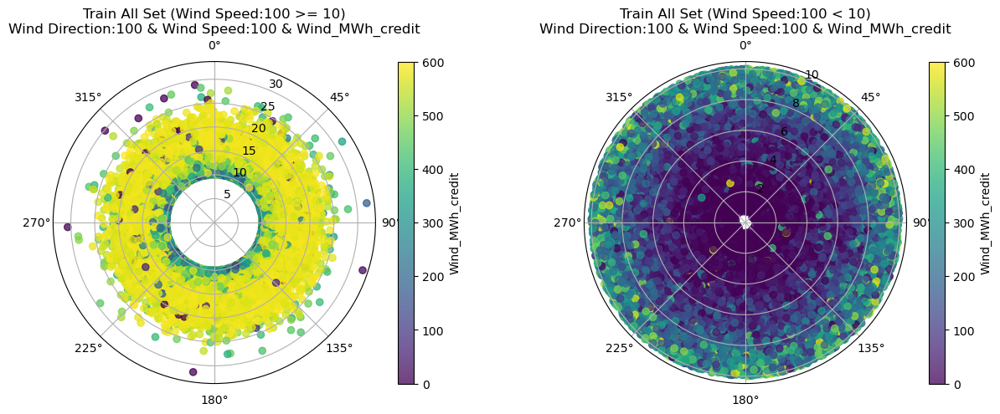

In [17]:
### Traing Set에 대한 분류

#plt.figure(figsize=[20, 5])
fig, axes = plt.subplots(1, 2, figsize=[15, 5], subplot_kw=dict(polar=True))

speed_threshold = 10

axes[0].set_theta_zero_location('N', offset=0)
axes[0].set_theta_direction(-1)

axes[0].set_title(f'Train All Set (Wind Speed:100 >= {speed_threshold})\nWind Direction:100 & Wind Speed:100 & Wind_MWh_credit')


# Compute areas and colors
radiance = df_train_all[df_train_all['WindSpeed:100'] >= speed_threshold]['WindSpeed:100']
theta = df_train_all[df_train_all['WindSpeed:100'] >= speed_threshold]['WindDirection:100']
power = df_train_all[df_train_all['WindSpeed:100'] >= speed_threshold]['Wind_MWh_credit']

print(f"Data Coutns of upper values: {len(power)}")

c0 = axes[0].scatter(theta, radiance, c=power, cmap='viridis', alpha=0.75, vmin=0, vmax=600)

# Colorbar 추가
c0bar = fig.colorbar(c0)
c0bar.set_label('Wind_MWh_credit')

axes[1].set_theta_zero_location('N', offset=0)
axes[1].set_theta_direction(-1)

axes[1].set_title('Wind Direction:100 & Wind Speed:100')

# Compute areas and colors
radiance = df_train_all[df_train_all['WindSpeed:100'] < speed_threshold]['WindSpeed:100']
theta = df_train_all[df_train_all['WindSpeed:100'] < speed_threshold]['WindDirection:100']
power = df_train_all[df_train_all['WindSpeed:100'] < speed_threshold]['Wind_MWh_credit']

print(f"Data Coutns of lower values: {len(power)}")

axes[1].set_title(f'Train All Set (Wind Speed:100 < {speed_threshold})\nWind Direction:100 & Wind Speed:100 & Wind_MWh_credit')

c1 = axes[1].scatter(theta, radiance, c=power, cmap='viridis', alpha=0.75, vmin=0, vmax=600)

# Colorbar 추가
c1bar = fig.colorbar(c1)
c1bar.set_label('Wind_MWh_credit')

Data Coutns of upper values: 416
Data Coutns of lower values: 400


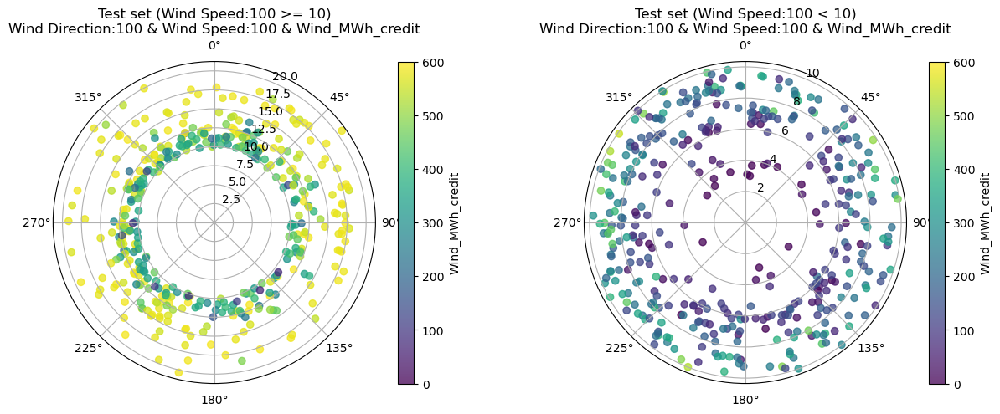

In [18]:
### Test Set에 대한 분류

#plt.figure(figsize=[20, 5])
fig, axes = plt.subplots(1, 2, figsize=[15, 5], subplot_kw=dict(polar=True))

speed_threshold = 10

axes[0].set_theta_zero_location('N', offset=0)
axes[0].set_theta_direction(-1)

axes[0].set_title(f'Test set (Wind Speed:100 >= {speed_threshold})\nWind Direction:100 & Wind Speed:100 & Wind_MWh_credit')

# Compute areas and colors
radiance = df_test[df_test['WindSpeed:100'] >= speed_threshold]['WindSpeed:100']
theta = df_test[df_test['WindSpeed:100'] >= speed_threshold]['WindDirection:100']
power = df_test[df_test['WindSpeed:100'] >= speed_threshold]['Wind_MWh_credit']

print(f"Data Coutns of upper values: {len(power)}")

c0 = axes[0].scatter(theta, radiance, c=power, cmap='viridis', alpha=0.75, vmin=0, vmax=600)

# Colorbar 추가
c0bar = fig.colorbar(c0)
c0bar.set_label('Wind_MWh_credit')

axes[1].set_theta_zero_location('N', offset=0)
axes[1].set_theta_direction(-1)

axes[1].set_title(f'Test set (Wind Speed:100 < {speed_threshold})\nWind Direction:100 & Wind Speed:100 & Wind_MWh_credit')

# Compute areas and colors
radiance = df_test[df_test['WindSpeed:100'] < speed_threshold]['WindSpeed:100']
theta = df_test[df_test['WindSpeed:100'] < speed_threshold]['WindDirection:100']
power = df_test[df_test['WindSpeed:100'] < speed_threshold]['Wind_MWh_credit']

c1 = axes[1].scatter(theta, radiance, c=power, cmap='viridis', alpha=0.75, vmin=0, vmax=600)

print(f"Data Coutns of lower values: {len(power)}")

# Colorbar 추가
c1bar = fig.colorbar(c1)
c1bar.set_label('Wind_MWh_credit')

In [22]:
# # speed_thresholds = [8, 12]

# # lower_condition = df_train_all['WindSpeed:100'] >= speed_thresholds[0]
# # upper_condition = df_train_all['WindSpeed:100'] < speed_thresholds[1]

# # df_train_all_part2 = df_train_all[lower_condition & upper_condition]

# speed_thresholds = 10

# lower_condition = df_train_all['WindSpeed:100'] >= speed_thresholds
# upper_condition = df_train_all['WindSpeed:100'] < speed_thresholds

# df_train_all_part1 = df_train_all[lower_condition]
# df_train_all_part2 = df_train_all[upper_condition]

# print(f"Data Counts in Part 1 : {len(df_train_all_part1)}")
# print(f"Data Counts in Part 2 : {len(df_train_all_part2)}")

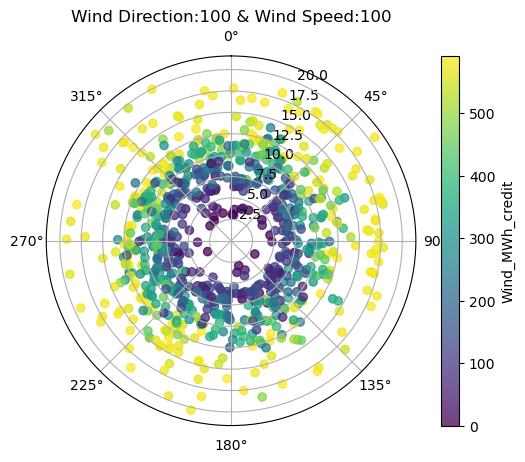

In [19]:
from matplotlib.colorbar import ColorbarBase
from obspy.imaging.cm import get_cmap
from matplotlib.colors import Normalize

cmap = get_cmap('YlGnBu')

# Compute areas and colors

radiance = df_test['WindSpeed:100']
theta = df_test['WindDirection:100']
power = df_test['Wind_MWh_credit']

fig = plt.figure()

ax = fig.add_subplot(111, projection='polar')
ax.set_theta_zero_location('N', offset=0)
ax.set_theta_direction(-1)

ax.set_title('Wind Direction:100 & Wind Speed:100')

c = ax.scatter(theta, radiance, c=power, cmap='viridis', alpha=0.75)

# Colorbar 추가
cbar = fig.colorbar(c)
cbar.set_label('Wind_MWh_credit')

plt.show()

In [20]:
# Wind power 
print(f"first cleansing : ")
print(f"before data cleansing : {len(df_train_all)}")
# re_modelling_table = re_modelling_table[~((re_modelling_table["WindSpeed:100"] >= 20) & (re_modelling_table["Wind_MWh_credit"] <= 270))] # threshold windspeed100 (20, 200)
df_train_all = df_train_all[~((df_train_all["WindSpeed:100"] >= 10) & (df_train_all["Wind_MWh_credit"] <= 100))]
# re_modelling_table = modelling_table[~((modelling_table["WindSpeed"] >= 15) & (modelling_table["Wind_MWh_credit"] <= 500))] # threshold windspeed
print(f"after data cleansing : {len(df_train_all)}")

first cleansing : 
before data cleansing : 57258
after data cleansing : 56909


### cutail 이 발생한 시간대 확인 및 데이터 제거

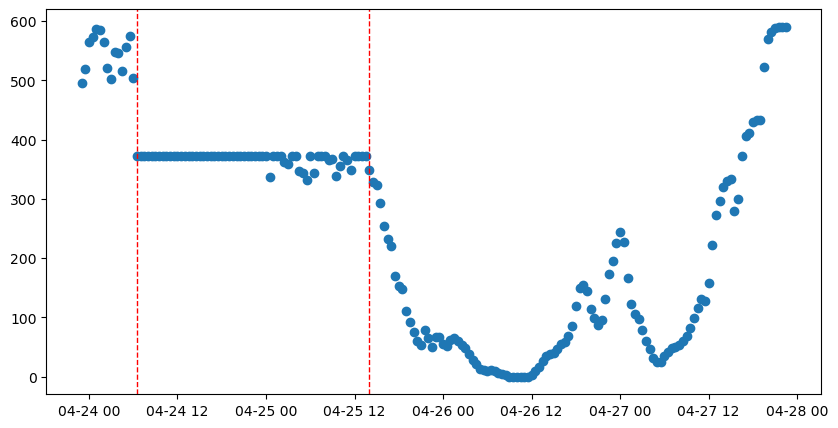

In [21]:
plt.figure(figsize=(10, 5))
# 과거 학습 데이터에 대한 출력 제한 이력 존재 -> 풍력 발전 모델 성능 저하 요인
plt.scatter(df_train_all['2023-04-23 00:00':'2023-04-26']['valid_datetime'],
            df_train_all['2023-04-23 00:00':'2023-04-26']['Wind_MWh_credit'])

plt.axvline(x=pd.to_datetime('2023-04-24 06:30:00'), color='r',  linestyle='--', linewidth=1)
plt.axvline(x=pd.to_datetime('2023-04-25 14:00:00'), color='r',  linestyle='--', linewidth=1)

In [22]:
print(f"Second cleansing : ")
print(f"before data cleansing : {len(df_train_all)}")
df_train_all = df_train_all[~((df_train_all["valid_datetime"] >= '2023-04-24 06:30:00') & (df_train_all["valid_datetime"] <= '2023-04-25 14:00:00'))]
print(f"after data cleansing : {len(df_train_all)}")

Second cleansing : 
before data cleansing : 56909
after data cleansing : 56845


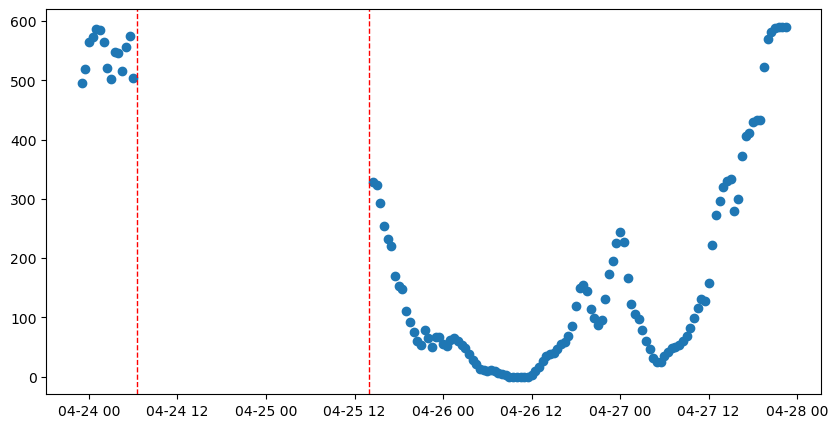

In [23]:
plt.figure(figsize=(10, 5))

plt.scatter(df_train_all['2023-04-23 00:00':'2023-04-26']['valid_datetime'],
            df_train_all['2023-04-23 00:00':'2023-04-26']['Wind_MWh_credit'])

plt.axvline(x=pd.to_datetime('2023-04-24 06:30:00'), color='r',  linestyle='--', linewidth=1)
plt.axvline(x=pd.to_datetime('2023-04-25 14:00:00'), color='r',  linestyle='--', linewidth=1)

## Feature engineering for wind forecasting

In [24]:
df_train_all['air_density'] = df_train_all.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_train['air_density'] = df_train.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_val['air_density'] = df_val.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_test['air_density'] = df_test.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)

df_train_all['absolute_humidity'] = df_train_all.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_train['absolute_humidity'] = df_train.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_val['absolute_humidity'] = df_val.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_test['absolute_humidity'] = df_test.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)

df_train_all['air_pressure'] = df_train_all.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_train['air_pressure'] = df_train.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_val['air_pressure'] = df_val.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_test['air_pressure'] = df_test.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)

In [29]:
# # 이상치로 간주할 특정 값
# threshold_upper = 5  
# threshold_lower = -5
# filtered_df = df_train_all[(df_train_all['air_density'] > threshold_lower) & (df_train_all['air_density'] < threshold_upper)]

In [30]:
# for i in np.arange(12):
#     temp_df = df_train_all.iloc[i, :]
#     temperature = temp_df['Temperature_wind']
#     # Calculate saturation vapor pressure
#     # https://en.wikipedia.org/wiki/Vapour_pressure_of_water
#     e_s = 6.1078 * np.exp(17.27*temperature/(temperature+237.3))
#     # print(f"saturation vapor pressure : {e_s}")
    

In [31]:
# # Calculate saturation vapor pressure
# e_s = 6.1078 * 10 ** ((7.5 * temperature) / (temperature + 237.3))
# # Calculate vapor pressure
# e = relative_humidity * e_s
# # Calculate dry air pressure
# p_dry = pressure - e
# # Calculate air density
# rho = (p_dry / (287.058 * temperature)) + ((e / (287.058 * temperature)) * (1 - 0.378 * (e / p_dry)))

In [25]:
# 성능 향상 발생 : 0.0
df_train_all['component_x'] = df_train_all['WindSpeed']*np.cos(df_train_all['WindDirection']*np.pi/180)
df_train_all['component_y'] = df_train_all['WindSpeed']*np.sin(df_train_all['WindDirection']*np.pi/180)
df_train_all['component_x:100'] = df_train_all['WindSpeed:100']*np.cos(df_train_all['WindDirection:100']*np.pi/180)
df_train_all['component_y:100'] = df_train_all['WindSpeed:100']*np.sin(df_train_all['WindDirection:100']*np.pi/180)

df_train['component_x'] = df_train['WindSpeed']*np.cos(df_train['WindDirection']*np.pi/180)
df_train['component_y'] = df_train['WindSpeed']*np.sin(df_train['WindDirection']*np.pi/180)
df_train['component_x:100'] = df_train['WindSpeed:100']*np.cos(df_train['WindDirection:100']*np.pi/180)
df_train['component_y:100'] = df_train['WindSpeed:100']*np.sin(df_train['WindDirection:100']*np.pi/180)

df_val['component_x'] = df_val['WindSpeed']*np.cos(df_val['WindDirection']*np.pi/180)
df_val['component_y'] = df_val['WindSpeed']*np.sin(df_val['WindDirection']*np.pi/180)
df_val['component_x:100'] = df_val['WindSpeed:100']*np.cos(df_val['WindDirection:100']*np.pi/180)
df_val['component_y:100'] = df_val['WindSpeed:100']*np.sin(df_val['WindDirection:100']*np.pi/180)

df_test['component_x'] = df_test['WindSpeed']*np.cos(df_test['WindDirection']*np.pi/180)
df_test['component_y'] = df_test['WindSpeed']*np.sin(df_test['WindDirection']*np.pi/180)
df_test['component_x:100'] = df_test['WindSpeed:100']*np.cos(df_test['WindDirection:100']*np.pi/180)
df_test['component_y:100'] = df_test['WindSpeed:100']*np.sin(df_test['WindDirection:100']*np.pi/180)

In [26]:
df_train_all['component_x_avg'] = df_train_all['WindSpeed_avg']*np.cos(df_train_all['WindDirection_avg']*np.pi/180)
df_train_all['component_y_avg'] = df_train_all['WindSpeed_avg']*np.sin(df_train_all['WindDirection_avg']*np.pi/180)

df_train['component_x_avg'] = df_train['WindSpeed_avg']*np.cos(df_train['WindDirection_avg']*np.pi/180)
df_train['component_y_avg'] = df_train['WindSpeed_avg']*np.sin(df_train['WindDirection_avg']*np.pi/180)

df_val['component_x_avg'] = df_val['WindSpeed_avg']*np.cos(df_val['WindDirection_avg']*np.pi/180)
df_val['component_y_avg'] = df_val['WindSpeed_avg']*np.sin(df_val['WindDirection_avg']*np.pi/180)

df_test['component_x_avg'] = df_test['WindSpeed_avg']*np.cos(df_test['WindDirection_avg']*np.pi/180)
df_test['component_y_avg'] = df_test['WindSpeed_avg']*np.sin(df_test['WindDirection_avg']*np.pi/180)

df_train_all['component_x:100_avg'] = df_train_all['WindSpeed:100_avg']*np.cos(df_train_all['WindDirection:100_avg']*np.pi/180)
df_train_all['component_y:100_avg'] = df_train_all['WindSpeed:100_avg']*np.sin(df_train_all['WindDirection:100_avg']*np.pi/180)

df_train['component_x:100_avg'] = df_train['WindSpeed:100_avg']*np.cos(df_train['WindDirection:100_avg']*np.pi/180)
df_train['component_y:100_avg'] = df_train['WindSpeed:100_avg']*np.sin(df_train['WindDirection:100_avg']*np.pi/180)

df_val['component_x:100_avg'] = df_val['WindSpeed:100_avg']*np.cos(df_val['WindDirection:100_avg']*np.pi/180)
df_val['component_y:100_avg'] = df_val['WindSpeed:100_avg']*np.sin(df_val['WindDirection:100_avg']*np.pi/180)

df_test['component_x:100_avg'] = df_test['WindSpeed:100_avg']*np.cos(df_test['WindDirection:100_avg']*np.pi/180)
df_test['component_y:100_avg'] = df_test['WindSpeed:100_avg']*np.sin(df_test['WindDirection:100_avg']*np.pi/180)

In [27]:
df_train_all['month'] = df_train_all['valid_datetime'].dt.month
df_train_all['hour'] = df_train_all['valid_datetime'].dt.hour

df_train['month'] = df_train['valid_datetime'].dt.month
df_train['hour'] = df_train['valid_datetime'].dt.hour

df_val['month'] = df_val['valid_datetime'].dt.month
df_val['hour'] = df_val['valid_datetime'].dt.hour

df_test['month'] = df_test['valid_datetime'].dt.month
df_test['hour'] = df_test['valid_datetime'].dt.hour

### Normalization

In [408]:
# 28.156962211340183
# inputs = ['RelativeHumidity', 'Temperature_wind', 'WindDirection', 'WindDirection:100', 'WindSpeed', 'WindSpeed:100']
# target = ['Wind_MWh_credit']

# 27.799972866623605
inputs = ['RelativeHumidity', 'Temperature_wind', 'WindDirection', 'WindDirection:100', 'WindSpeed', 'WindSpeed:100', 'pressure']
target = ['Wind_MWh_credit']

# 27.76392624240861
# inputs = ['RelativeHumidity', 'Temperature_wind', 'WindDirection', 'WindDirection:100', 'WindSpeed', 'WindSpeed:100', 'pressure', 'air_density']
# target = ['Wind_MWh_credit']

# 28.0106243218055
# inputs = ['RelativeHumidity', 'Temperature_wind', 'WindDirection', 'WindDirection:100', 'WindSpeed', 'WindSpeed:100', 'pressure', 'air_density', 'absolute_humidity', 'air_pressure']
# target = ['Wind_MWh_credit']

# 28.185818676412303
# inputs = ['RelativeHumidity', 'Temperature_wind', 
#           'WindDirection', 'WindSpeed',
#           'WindDirection:100', 'WindSpeed:100', 
#           'air_density', 'absolute_humidity', 
#           'air_pressure', 'pressure', 
#           'component_x', 'component_y',
#           'component_x:100', 'component_y:100'
#         ]
# target = ['Wind_MWh_credit']

# 28.60505321924749
# inputs = ['RelativeHumidity', 'Temperature_wind', 
#           'WindDirection', 'WindSpeed',
#           'WindDirection:100', 'WindSpeed:100', 
#           'air_density', 'absolute_humidity', 
#           'air_pressure', 'pressure', 
#           'component_x', 'component_y',
#           'component_x:100', 'component_y:100',
#           'WindDirection:100_diff',
#           'WindSpeed:100_30min',
#         ]
# target = ['Wind_MWh_credit']

# 28.354957523963588
# inputs = [
#           'WindDirection', 'WindSpeed',
#           'WindDirection:100', 'WindSpeed:100', 
#           'air_density', 'absolute_humidity', 
#           'air_pressure', 'pressure', 
#           'component_x', 'component_y',
#           'component_x:100', 'component_y:100',
#           'WindDirection:100_diff',
#           'WindSpeed:100_30min'
#         ]
# target = ['Wind_MWh_credit']

# 28.895547362501677
# inputs = [
#           'WindDirection:100', 'WindSpeed:100', 
#           'air_density', 'absolute_humidity', 
#           'air_pressure', 'pressure', 
#           'component_x', 'component_y',
#           'component_x:100', 'component_y:100',
#           'WindDirection:100_diff',
#           'WindSpeed:100_30min'
#         ]
# target = ['Wind_MWh_credit']

# 29.855735984276876
# inputs = [
#           #'WindDirection:100', 'WindSpeed:100',
#           #'pressure',
#           'air_density', 
#           'absolute_humidity', 
#           'air_pressure',
#           'component_x', 'component_y',
#           'component_x:100', 'component_y:100',
#           'WindDirection:100_diff',
#           'WindSpeed:100_30min',
#         ]
# target = ['Wind_MWh_credit']

# 29.471598438085273
# inputs = [
#           #'WindDirection:100', 'WindSpeed:100',
#           #'pressure',
#           #'air_density', 
#           #'absolute_humidity', 
#           'air_pressure',
#           'component_x', 'component_y',
#           'component_x:100', 'component_y:100',
#           'WindDirection:100_diff',
#           'WindSpeed:100_30min',
#         ]
# target = ['Wind_MWh_credit']

In [125]:
# 29.47241663750488
# inputs = [
#           'air_density', 
#           'component_x', 'component_y',
#           'component_x:100', 'component_y:100',
#           'WindDirection:100_diff',
#          ]
# target = ['Wind_MWh_credit']

# 29.66234878441806
# inputs = [
#           'air_density',
#           'absolute_humidity',
#           'component_x', 'component_y',
#           'component_x:100', 'component_y:100',
#           'WindDirection:100_diff',
#          ]
# target = ['Wind_MWh_credit']

# 29.50193897360937
# inputs = [
#           'air_density',
#           'absolute_humidity',
#           'air_pressure',
#           'component_x', 'component_y',
#           'component_x:100', 'component_y:100',
#           'WindDirection:100_diff',
#          ]
# target = ['Wind_MWh_credit']

In [133]:
# 28.8157667454716
# inputs = [
#           'air_density', 
#           #'absolute_humidity', 
#           'WindSpeed:100',
#           'WindDirection:100',
#           'component_x',  # 27.689621196731515
#           'component_y', # 28.163929415856746
#           'component_x:100', # 32.374746740356755
#           'component_y:100', # 28.30
#           'WindDirection:100_diff',
#          ]
# target = ['Wind_MWh_credit']

In [409]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler, QuantileTransformer


def df_normalization(df_lists=[df_train_all[inputs], df_train[inputs], df_val[inputs], df_test[inputs]], methods="MinMax"):
    
    if methods == "MinMax":
        scaler = MinMaxScaler()
        scaler = scaler.fit(df_lists[1])

    if methods == "Standard":
        scaler = StandardScaler()
        scaler = scaler.fit(df_lists[1])
    
    if methods == "MaxAbsScaler":
        scaler = MaxAbsScaler()
        scaler = scaler.fit(df_lists[1]) 

    if methods == "QuantileTransformer":
        # https://deepdata.tistory.com/83
        # https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.quantile_transform.html
        scaler = QuantileTransformer(n_quantiles=10, random_state=0, output_distribution="uniform") # n_quantiles=30, (normal, uniform)
        scaler = scaler.fit(df_lists[1])
    
    # scale
    train_all_input = scaler.transform(df_lists[0])
    train_input = scaler.transform(df_lists[1])
    val_input = scaler.transform(df_lists[2])
    test_input = scaler.transform(df_lists[3])

    return [train_all_input, train_input, val_input, test_input], scaler

In [410]:
[train_all_input, train_input, val_input, test_input], scalerX = df_normalization(df_lists=[df_train_all[inputs], df_train[inputs], df_val[inputs], df_test[inputs]], methods="MaxAbsScaler") # Standard
[train_all_output, train_output, val_output, test_output], scalerY = df_normalization(df_lists=[df_train_all[target], df_train[target], df_val[target], df_test[target]], methods="QuantileTransformer") # MaxAbsScaler

In [146]:
# sns.histplot(train_input)
# plt.legend(inputs)
# plt.xlim(-0.1, +1.1)

# sns.histplot(train_all_input)
# plt.legend(inputs)
# plt.xlim(-0.1, +1.1)

In [411]:
print(f"train_input : {train_input.shape}")
print(f"val_input : {val_input.shape}")
print(f"test_input : {test_input.shape}")

print(f"train_output : {train_output.shape}")
print(f"val_output : {val_output.shape}")
print(f"test_output : {test_output.shape}")

train_input : (45806, 7)
val_input : (11452, 7)
test_input : (816, 7)
train_output : (45806, 1)
val_output : (11452, 1)
test_output : (816, 1)


### Evaluation Metric

In [412]:
def pinball(y, q,alpha):
    return (y-q)*alpha*(y>=q) + (q-y)*(1-alpha)*(y<q)

def pinball_score(df, target):
    """
    target = "total_generation_MWh"
    """
    score = list()
    for qu in range(10, 100, 10):
        score.append(pinball(y=df[target],
                             q=df[f"q{qu}"],
                             alpha=qu/100).mean())
    return sum(score)/len(score)

# pinball_score(output_table, target='Wind_MWh_credit')

## Modeling

### Light GBM

- single target : 

In [96]:
import lightgbm as lgb

In [97]:
# fixed 된 모델 (가설 실험할때 사용)

quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor

import lightgbm as lgb
import xgboost as xgb

seed_everything(42)

alphas = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

train_dataset = lgb.Dataset(data=train_all_input, 
                            label=train_all_output)

model_list = []

for alpha in alphas:
    params = {
        "objective": "quantile",
        "alpha": alpha,
        "max_depth": 30,         # 깊이, Level-wise 방식보단 leaf-wise 방식이 상대적으로 깊음
        "num_leaves": 15,        # 하나의 트리가 가질 수 있는 최대 리프 갯수
        "learning_rate": 0.1,    # d=0.1
        "n_estimators": 400,     # 반복 수행하는 트리 갯수 (크면 성능 올라가나 너무크면 과적합)
        "boosting_type": "gbdt", # goss (gradient 값이 상대적으로 큰 값만 선택적으로 재학습) , dart (tree dropout 적용)
                                 # sub_smaple : 행 샘플링
                                 # num_leaves : 컬럼에 대한 샘플링
        # seed 고정 필요
    }
    model_list.append(lgb.train(train_set=train_dataset, params=params))
    

# 성능 평가
print(f"-------------------------------------------")
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

print(f"inputs : {inputs}")
pinball_score(output_table, target='Wind_MWh_credit')

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 56845, number of used features: 6
[LightGBM] [Info] Start training from score 0.015802
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 56845, number of used features: 6
[LightGBM] [Info] Start training from score 0.076360
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000943 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins

27.436075963405976

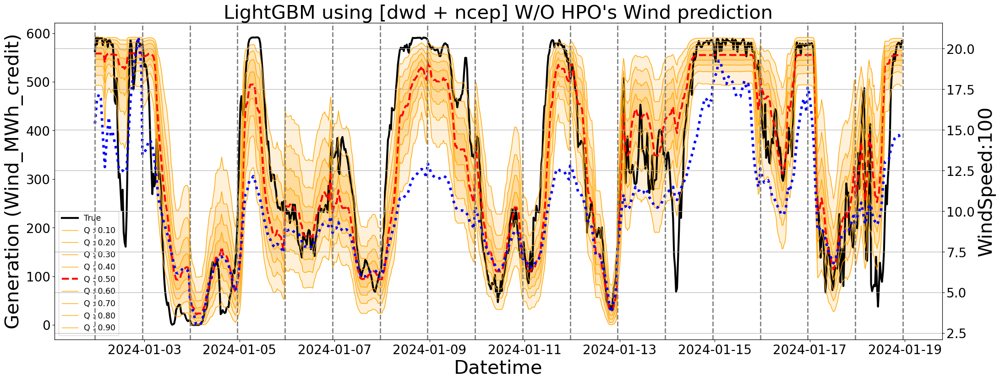

<Axes: xlabel='Datetime', ylabel='Generation (Wind_MWh_credit)'>

In [38]:
def visualize_wind_forecating(pred_df, df_wind , model_name="LightGBM"):
    fig, ax = plt.subplots(figsize=(25, 9))

    #pred_df['target'] = gt
    
    quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9] # 0,1,2,3,4,5,6,7,8
    n_quantiles = len(quantiles)
    
    # test_y_normalized_inv = inv_test_output[start*48:end*48]
    inv_test_pred = pred_df.copy()
    
    ax.plot(pred_df['Wind_MWh_credit'], label='True', color = 'black', linewidth = 3)
    
    # 0.1, 0.9
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 0].values.reshape(-1),
                    inv_test_pred.iloc[:, 8].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.2, 0.8
    
    ax.fill_between(inv_test_pred.index, #np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 1].values.reshape(-1),
                    inv_test_pred.iloc[:, 7].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.3, 0.7
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 2].values.reshape(-1),
                    inv_test_pred.iloc[:, 6].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.4, 0.6
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 3].values.reshape(-1),
                    inv_test_pred.iloc[:, 5].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    
    for q_idx in range(n_quantiles):
        if quantiles[q_idx] == 0.5:
            quantile_color = 'red'
            quantile_linestyle = '--'
            quantile_linewidth = 3
            alpha = 1
        else:
            quantile_color = 'orange'
            quantile_linestyle = 'solid'
            quantile_linewidth = 1
            alpha = 1
    
        # ax.plot(test_pred_[start:end,48*q_idx:48*(q_idx+1)].reshape(-1), label = ('Q : %.2f' %quantiles[q_idx]), color = quantile_color, linestyle = quantile_linestyle, linewidth = quantile_linewidth, alpha=alpha)
        ax.plot(inv_test_pred.index,
                inv_test_pred.iloc[:, q_idx].values.reshape(-1), 
                label = ('Q : %.2f' %quantiles[q_idx]), 
                color = quantile_color, 
                linestyle = quantile_linestyle, 
                linewidth = quantile_linewidth, 
                alpha=alpha)
        
    ax2 = ax.twinx()
    ax2.plot(df_wind.index,
             df_wind.values,
             label = f"WindSpeed:100", 
             color = 'blue', 
             linestyle = ':', 
             linewidth = 4, 
             alpha=alpha)    
    
    plt.grid()
    # ax.set(title="Test set : PV power forecasting", ylabel="Normalized Power", xlabel="Time")
    
    
    # plt.title("Test set : PV power forecasting", fontsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(axis='x', labelsize=20)  
    ax.set_xlabel('Datetime', fontsize=30)
    ax.set_ylabel('Generation (Wind_MWh_credit)', fontsize=30)
    
    ax2.tick_params(axis='y', labelsize=20)  
    ax2.set_ylabel('WindSpeed:100', fontsize=30)
    
    plt.title(f"{model_name}'s Wind prediction", fontsize=30)
    legend = ax.legend(loc='lower left',fontsize=20, frameon=1, prop={'size': 12.5})
    
    intervals = pd.date_range(start='2024-01-01 23:00:00', end='2024-01-18 23:00:00', freq='24H')
    
    for interval in intervals:
        plt.axvline(x=interval, color='gray',  linestyle='--', linewidth=2)
    
    plt.show()
    
    return ax
    
    
    
output_table.index = df_test[['valid_datetime', 'WindSpeed:100']].set_index('valid_datetime').index

visualize_wind_forecating(output_table,
                          df_test[['valid_datetime', 'WindSpeed:100']].set_index('valid_datetime'),
                          model_name="LightGBM using [dwd + ncep] W/O HPO")

In [99]:
# daily pinball score
for i in np.arange(len(output_table)//48):
    daily_pinball_score = pinball_score(output_table.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    print(f"Day-{str(output_table.index[i*48])[:16]} ~ {str(output_table.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")
print(f"Mean pinball score : {pinball_score(output_table, target='Wind_MWh_credit')}")

Day-2024-01-01 23:00 ~ 2024-01-02 22:30's Pinball Score (Wind) : 38.94448672482574
Day-2024-01-02 23:00 ~ 2024-01-03 22:30's Pinball Score (Wind) : 47.88747600605535
Day-2024-01-03 23:00 ~ 2024-01-04 22:30's Pinball Score (Wind) : 16.008279196948667
Day-2024-01-04 23:00 ~ 2024-01-05 22:30's Pinball Score (Wind) : 46.67690399953728
Day-2024-01-05 23:00 ~ 2024-01-06 22:30's Pinball Score (Wind) : 14.212005588178416
Day-2024-01-06 23:00 ~ 2024-01-07 22:30's Pinball Score (Wind) : 24.489981335449137
Day-2024-01-07 23:00 ~ 2024-01-08 22:30's Pinball Score (Wind) : 41.671369121861254
Day-2024-01-08 23:00 ~ 2024-01-09 22:30's Pinball Score (Wind) : 19.817510121341776
Day-2024-01-09 23:00 ~ 2024-01-10 22:30's Pinball Score (Wind) : 16.59916800209182
Day-2024-01-10 23:00 ~ 2024-01-11 22:30's Pinball Score (Wind) : 32.31024116459206
Day-2024-01-11 23:00 ~ 2024-01-12 22:30's Pinball Score (Wind) : 14.870363379454643
Day-2024-01-12 23:00 ~ 2024-01-13 22:30's Pinball Score (Wind) : 21.9024494291808

In [100]:
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')


27.436075963405976

In [2140]:
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

33.11816943276221

In [1880]:
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

34.17664133247921

In [1324]:
# # lgb model save
# quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# for idx, (alpha, model) in enumerate(zip(quantiles, model_list)):
#     model.save_model('models/LightGBM/best_lagged_lgb_model_'+[f"q{qu}" for qu in range(10, 100, 10)][idx]+'_train_202411.txt')

# # lgb model save
# # q10_model = lgb.Booster(model_file='model.txt')

In [653]:
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

42.79948961443886

#### Tuning the hyper-parameters of Light GBM

In [492]:
import lightgbm as lgb

from optuna.samplers import TPESampler
import optuna 

sampler = TPESampler(seed=42)

In [494]:
def pinball(y, q, alpha):
    score = (y-q)*alpha*(y>=q) + (q-y)*(1-alpha)*(y<q)
    score = score.mean()
    
    return score # 'score', score #, False


def objective(trial, alpha):
    
    train_dataset = lgb.Dataset(data=train_input,
                                label=train_output)
    
#     valid_dataset = lgb.Dataset(data=val_input,
#                                 label=val_output)

    valid_dataset = lgb.Dataset(data=test_input,
                                label=test_output)
    
    param = {'objective': 'quantile', # quantile regression
             'alpha': alpha,
             'verbose': -1,
             'max_depth': trial.suggest_int('max_depth',3, 30),                       # 깊이, Level-wise 방식보단 leaf-wise 방식이 상대적으로 깊음
             'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 1e-2),  # d=0.1
             'n_estimators': trial.suggest_int('n_estimators', 100, 3000),            # 반복 수행하는 트리 갯수 (크면 성능 올라가나 너무크면 과적합)
             'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),     
             'subsample': trial.suggest_loguniform('subsample', 0.4, 1)               # sub_smaple : 행 샘플링
                                                                                      # num_leaves : 컬럼에 대한 샘플링
             }

    model = lgb.LGBMRegressor(**param)
    #lgb_model = model.fit(train_input, train_output, eval_set=[(val_input, val_output)])
    lgb_model = model.fit(train_all_input, train_all_output, eval_set=[(test_input, test_output)])
    
    valid_y = scalerY.inverse_transform(test_output).reshape(-1)
    valid_q = scalerY.inverse_transform(lgb_model.predict(test_input).reshape(-1, 1)).reshape(-1)
    
    pinball_score = pinball(valid_y, valid_q, alpha)
    
    return pinball_score

In [495]:
quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

lgb_model_list = []

for alpha in quantiles:
    print(f"★---------------Start HPO at q-{alpha}----------------------★")
    
    study_lgb = optuna.create_study(direction='minimize', sampler=sampler)
    study_lgb.optimize(lambda trial: objective(trial, alpha), n_trials=100)

    trial = study_lgb.best_trial
    trial_params = trial.params

    # quantile regression을 위해 추가 parameter 셋팅
    trial_params['alpha'] = alpha
    trial_params['objective'] = 'quantile'
    trial_params['boosting_type'] = 'gbdt'
    
    # fixed (underfitting을 방지하기 위함)
    # trial_params['max_depth'] = 15
    
    print(f"Best Trial : score {trial.value},\nparams {trial_params}")
    
    print(f"-----------------Finished HPO at q-{alpha}---------------------")
    
    print(f"-----------------Training model at q-{alpha}-------------------")
    
    train_dataset = lgb.Dataset(data=train_all_input, 
                                label=train_all_output)
    
    final_lgb_model = lgb.train(train_set=train_dataset, params=trial_params)
    
    lgb_model_list.append(final_lgb_model)
    
    print(f"★----------------Finished Training model at q-{alpha}--------★")

[I 2024-03-03 22:17:08,096] A new study created in memory with name: no-name-0816e4c9-f7a0-4a72-b235-f94b4f257b05


★---------------Start HPO at q-0.1----------------------★


[I 2024-03-03 22:17:11,823] Trial 0 finished with value: 18.3183340500314 and parameters: {'max_depth': 13, 'learning_rate': 0.005061576888752304, 'n_estimators': 2223, 'min_child_samples': 62, 'subsample': 0.46147273880126555}. Best is trial 0 with value: 18.3183340500314.
[I 2024-03-03 22:17:15,333] Trial 1 finished with value: 32.733311943885866 and parameters: {'max_depth': 7, 'learning_rate': 2.2310108018679158e-08, 'n_estimators': 2612, 'min_child_samples': 62, 'subsample': 0.765297684068612}. Best is trial 0 with value: 18.3183340500314.
[I 2024-03-03 22:17:17,317] Trial 2 finished with value: 17.413445748048098 and parameters: {'max_depth': 3, 'learning_rate': 0.006598711072054081, 'n_estimators': 2514, 'min_child_samples': 25, 'subsample': 0.4725148048142631}. Best is trial 2 with value: 17.413445748048098.
[I 2024-03-03 22:17:19,502] Trial 3 finished with value: 32.72670593396586 and parameters: {'max_depth': 8, 'learning_rate': 6.690421166498788e-07, 'n_estimators': 1622, 'm

[I 2024-03-03 22:18:31,985] Trial 30 finished with value: 32.67525783447084 and parameters: {'max_depth': 13, 'learning_rate': 6.632484419846416e-06, 'n_estimators': 1338, 'min_child_samples': 72, 'subsample': 0.5311800225586694}. Best is trial 24 with value: 17.12578065913434.
[I 2024-03-03 22:18:34,642] Trial 31 finished with value: 17.473584367407785 and parameters: {'max_depth': 5, 'learning_rate': 0.003696310354407697, 'n_estimators': 2222, 'min_child_samples': 22, 'subsample': 0.45312199468817793}. Best is trial 24 with value: 17.12578065913434.
[I 2024-03-03 22:18:36,773] Trial 32 finished with value: 17.425257799795016 and parameters: {'max_depth': 5, 'learning_rate': 0.009346571655151499, 'n_estimators': 1807, 'min_child_samples': 11, 'subsample': 0.46117368507652473}. Best is trial 24 with value: 17.12578065913434.
[I 2024-03-03 22:18:39,264] Trial 33 finished with value: 17.759341623851334 and parameters: {'max_depth': 8, 'learning_rate': 0.007240088231628646, 'n_estimators'

[I 2024-03-03 22:19:54,470] Trial 60 finished with value: 27.844106528909425 and parameters: {'max_depth': 7, 'learning_rate': 0.00030120622789059565, 'n_estimators': 2354, 'min_child_samples': 24, 'subsample': 0.48031689407014383}. Best is trial 24 with value: 17.12578065913434.
[I 2024-03-03 22:19:56,497] Trial 61 finished with value: 19.077206713746175 and parameters: {'max_depth': 4, 'learning_rate': 0.0037812890820080255, 'n_estimators': 2198, 'min_child_samples': 21, 'subsample': 0.45051176861599074}. Best is trial 24 with value: 17.12578065913434.
[I 2024-03-03 22:19:59,032] Trial 62 finished with value: 18.18656254965887 and parameters: {'max_depth': 5, 'learning_rate': 0.002166271913551333, 'n_estimators': 2174, 'min_child_samples': 32, 'subsample': 0.4473501126509361}. Best is trial 24 with value: 17.12578065913434.
[I 2024-03-03 22:20:02,517] Trial 63 finished with value: 16.94006188012829 and parameters: {'max_depth': 6, 'learning_rate': 0.006621655340233211, 'n_estimators'

[I 2024-03-03 22:21:44,365] Trial 90 finished with value: 19.110817760786443 and parameters: {'max_depth': 10, 'learning_rate': 0.0015946294859953982, 'n_estimators': 2671, 'min_child_samples': 26, 'subsample': 0.9382355887999241}. Best is trial 75 with value: 16.79368835810461.
[I 2024-03-03 22:21:47,995] Trial 91 finished with value: 17.212288390438463 and parameters: {'max_depth': 6, 'learning_rate': 0.009988774081357104, 'n_estimators': 2729, 'min_child_samples': 23, 'subsample': 0.8367525799564984}. Best is trial 75 with value: 16.79368835810461.
[I 2024-03-03 22:21:52,121] Trial 92 finished with value: 17.73653674194125 and parameters: {'max_depth': 8, 'learning_rate': 0.007054222688236131, 'n_estimators': 2741, 'min_child_samples': 17, 'subsample': 0.8013901279374998}. Best is trial 75 with value: 16.79368835810461.
[I 2024-03-03 22:21:56,307] Trial 93 finished with value: 17.374298457745013 and parameters: {'max_depth': 7, 'learning_rate': 0.004449796572030174, 'n_estimators': 

Best Trial : score 16.79368835810461,
params {'max_depth': 6, 'learning_rate': 0.008625904310215642, 'n_estimators': 2908, 'min_child_samples': 18, 'subsample': 0.4149635239840602, 'alpha': 0.1, 'objective': 'quantile', 'boosting_type': 'gbdt'}
-----------------Finished HPO at q-0.1---------------------
-----------------Training model at q-0.1-------------------
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 57258, number of used features: 6
[LightGBM] [Info] Start training from score 0.015021


[I 2024-03-03 22:22:16,965] A new study created in memory with name: no-name-1118b775-3def-4c3d-860f-6d9300489927


★----------------Finished Training model at q-0.1--------★
★---------------Start HPO at q-0.2----------------------★


[I 2024-03-03 22:22:21,805] Trial 0 finished with value: 36.68924166987773 and parameters: {'max_depth': 30, 'learning_rate': 0.0004475040191350909, 'n_estimators': 2825, 'min_child_samples': 90, 'subsample': 0.6918123555042447}. Best is trial 0 with value: 36.68924166987773.
[I 2024-03-03 22:22:22,930] Trial 1 finished with value: 59.65648020554116 and parameters: {'max_depth': 28, 'learning_rate': 3.39590093316275e-08, 'n_estimators': 668, 'min_child_samples': 9, 'subsample': 0.5389170774966446}. Best is trial 0 with value: 36.68924166987773.
[I 2024-03-03 22:22:27,490] Trial 2 finished with value: 59.63257324476073 and parameters: {'max_depth': 13, 'learning_rate': 4.247116662617142e-07, 'n_estimators': 2504, 'min_child_samples': 39, 'subsample': 0.5174341313371511}. Best is trial 0 with value: 36.68924166987773.
[I 2024-03-03 22:22:31,839] Trial 3 finished with value: 59.653105950186244 and parameters: {'max_depth': 18, 'learning_rate': 7.007213496896406e-08, 'n_estimators': 2427, 

[I 2024-03-03 22:23:50,810] Trial 30 finished with value: 52.97676526028615 and parameters: {'max_depth': 7, 'learning_rate': 0.0001007540217352486, 'n_estimators': 2752, 'min_child_samples': 32, 'subsample': 0.8327578920916905}. Best is trial 25 with value: 25.546156692098045.
[I 2024-03-03 22:23:53,121] Trial 31 finished with value: 26.094896496670636 and parameters: {'max_depth': 5, 'learning_rate': 0.004136755039573906, 'n_estimators': 1739, 'min_child_samples': 70, 'subsample': 0.934206537521009}. Best is trial 25 with value: 25.546156692098045.
[I 2024-03-03 22:23:56,233] Trial 32 finished with value: 25.65140820581738 and parameters: {'max_depth': 8, 'learning_rate': 0.008790930872918165, 'n_estimators': 2116, 'min_child_samples': 61, 'subsample': 0.9487483129423385}. Best is trial 25 with value: 25.546156692098045.
[I 2024-03-03 22:24:00,080] Trial 33 finished with value: 32.387121304147314 and parameters: {'max_depth': 8, 'learning_rate': 0.0007900323247791082, 'n_estimators':

[I 2024-03-03 22:25:45,403] Trial 60 finished with value: 25.786215072630647 and parameters: {'max_depth': 18, 'learning_rate': 0.0030956730691614554, 'n_estimators': 2999, 'min_child_samples': 55, 'subsample': 0.4712370972361679}. Best is trial 43 with value: 25.367901588751568.
[I 2024-03-03 22:25:50,221] Trial 61 finished with value: 25.50581130668544 and parameters: {'max_depth': 24, 'learning_rate': 0.009614748495247176, 'n_estimators': 2898, 'min_child_samples': 45, 'subsample': 0.5579285378996568}. Best is trial 43 with value: 25.367901588751568.
[I 2024-03-03 22:25:54,693] Trial 62 finished with value: 26.479846129919384 and parameters: {'max_depth': 24, 'learning_rate': 0.0013836248491665456, 'n_estimators': 2888, 'min_child_samples': 51, 'subsample': 0.5438896059584531}. Best is trial 43 with value: 25.367901588751568.
[I 2024-03-03 22:25:59,052] Trial 63 finished with value: 25.571330534044733 and parameters: {'max_depth': 22, 'learning_rate': 0.005500589873516387, 'n_estima

[I 2024-03-03 22:27:58,709] Trial 90 finished with value: 25.96616801385142 and parameters: {'max_depth': 29, 'learning_rate': 0.0021059166177012584, 'n_estimators': 2714, 'min_child_samples': 38, 'subsample': 0.42560755354279445}. Best is trial 80 with value: 25.15918466693968.
[I 2024-03-03 22:28:03,697] Trial 91 finished with value: 25.667217644235386 and parameters: {'max_depth': 26, 'learning_rate': 0.008561963801679515, 'n_estimators': 2890, 'min_child_samples': 48, 'subsample': 0.43696760546573227}. Best is trial 80 with value: 25.15918466693968.
[I 2024-03-03 22:28:04,950] Trial 92 finished with value: 25.7584615865281 and parameters: {'max_depth': 26, 'learning_rate': 0.00993867308452702, 'n_estimators': 697, 'min_child_samples': 42, 'subsample': 0.4525490883177645}. Best is trial 80 with value: 25.15918466693968.
[I 2024-03-03 22:28:09,485] Trial 93 finished with value: 25.581489819908693 and parameters: {'max_depth': 23, 'learning_rate': 0.004459275335991345, 'n_estimators':

Best Trial : score 25.15918466693968,
params {'max_depth': 28, 'learning_rate': 0.009289248915693955, 'n_estimators': 2917, 'min_child_samples': 38, 'subsample': 0.40070421844753434, 'alpha': 0.2, 'objective': 'quantile', 'boosting_type': 'gbdt'}
-----------------Finished HPO at q-0.2---------------------
-----------------Training model at q-0.2-------------------
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 57258, number of used features: 6
[LightGBM] [Info] Start training from score 0.074858


[I 2024-03-03 22:28:44,167] A new study created in memory with name: no-name-d92754e4-2e12-441c-9bd8-1203292aac45


★----------------Finished Training model at q-0.2--------★
★---------------Start HPO at q-0.3----------------------★


[I 2024-03-03 22:28:44,980] Trial 0 finished with value: 75.59080723425474 and parameters: {'max_depth': 3, 'learning_rate': 6.583585310972683e-05, 'n_estimators': 1011, 'min_child_samples': 53, 'subsample': 0.9187915699671065}. Best is trial 0 with value: 75.59080723425474.
[I 2024-03-03 22:28:48,951] Trial 1 finished with value: 77.4869679670937 and parameters: {'max_depth': 9, 'learning_rate': 2.899329258356698e-06, 'n_estimators': 2291, 'min_child_samples': 26, 'subsample': 0.4292332704133048}. Best is trial 0 with value: 75.59080723425474.
[I 2024-03-03 22:28:53,378] Trial 2 finished with value: 77.81046103524022 and parameters: {'max_depth': 11, 'learning_rate': 9.275294835907672e-08, 'n_estimators': 2797, 'min_child_samples': 82, 'subsample': 0.7146883251183848}. Best is trial 0 with value: 75.59080723425474.
[I 2024-03-03 22:28:54,549] Trial 3 finished with value: 59.7895942846744 and parameters: {'max_depth': 27, 'learning_rate': 0.000663792683813838, 'n_estimators': 641, 'min

[I 2024-03-03 22:30:09,989] Trial 30 finished with value: 77.01082267002779 and parameters: {'max_depth': 27, 'learning_rate': 0.00012188376861938512, 'n_estimators': 133, 'min_child_samples': 39, 'subsample': 0.7829028360596145}. Best is trial 12 with value: 30.919729234817986.
[I 2024-03-03 22:30:12,524] Trial 31 finished with value: 31.066811029185164 and parameters: {'max_depth': 16, 'learning_rate': 0.004501959898557918, 'n_estimators': 1573, 'min_child_samples': 52, 'subsample': 0.5438469862789835}. Best is trial 12 with value: 30.919729234817986.
[I 2024-03-03 22:30:16,485] Trial 32 finished with value: 31.081506358621056 and parameters: {'max_depth': 19, 'learning_rate': 0.003567707693994572, 'n_estimators': 2232, 'min_child_samples': 59, 'subsample': 0.6162499127883028}. Best is trial 12 with value: 30.919729234817986.
[I 2024-03-03 22:30:19,086] Trial 33 finished with value: 31.011777361514458 and parameters: {'max_depth': 12, 'learning_rate': 0.009738725931079072, 'n_estimat

[I 2024-03-03 22:32:02,866] Trial 60 finished with value: 74.34061628762376 and parameters: {'max_depth': 30, 'learning_rate': 2.9806343543883095e-05, 'n_estimators': 2399, 'min_child_samples': 9, 'subsample': 0.7366239593774266}. Best is trial 59 with value: 30.72879334056105.
[I 2024-03-03 22:32:06,572] Trial 61 finished with value: 31.224524153031485 and parameters: {'max_depth': 29, 'learning_rate': 0.008793400485494282, 'n_estimators': 2263, 'min_child_samples': 14, 'subsample': 0.9066946379658859}. Best is trial 59 with value: 30.72879334056105.
[I 2024-03-03 22:32:10,217] Trial 62 finished with value: 31.072745727628448 and parameters: {'max_depth': 26, 'learning_rate': 0.004276068403403454, 'n_estimators': 2083, 'min_child_samples': 6, 'subsample': 0.8103627041169615}. Best is trial 59 with value: 30.72879334056105.
[I 2024-03-03 22:32:14,467] Trial 63 finished with value: 77.67559744321035 and parameters: {'max_depth': 28, 'learning_rate': 1.1143057874228962e-06, 'n_estimators

[I 2024-03-03 22:34:02,541] Trial 90 finished with value: 30.967458238475714 and parameters: {'max_depth': 27, 'learning_rate': 0.004732978521207727, 'n_estimators': 2406, 'min_child_samples': 55, 'subsample': 0.5374449279854109}. Best is trial 59 with value: 30.72879334056105.
[I 2024-03-03 22:34:07,430] Trial 91 finished with value: 30.8520979173462 and parameters: {'max_depth': 22, 'learning_rate': 0.006172857580827831, 'n_estimators': 2715, 'min_child_samples': 46, 'subsample': 0.9794285335148754}. Best is trial 59 with value: 30.72879334056105.
[I 2024-03-03 22:34:11,876] Trial 92 finished with value: 31.047258489211277 and parameters: {'max_depth': 20, 'learning_rate': 0.006702579049849096, 'n_estimators': 2824, 'min_child_samples': 42, 'subsample': 0.9775017138174698}. Best is trial 59 with value: 30.72879334056105.
[I 2024-03-03 22:34:16,576] Trial 93 finished with value: 30.711037993252884 and parameters: {'max_depth': 18, 'learning_rate': 0.005305283673783166, 'n_estimators':

Best Trial : score 30.711037993252884,
params {'max_depth': 18, 'learning_rate': 0.005305283673783166, 'n_estimators': 2595, 'min_child_samples': 47, 'subsample': 0.5601067949797877, 'alpha': 0.3, 'objective': 'quantile', 'boosting_type': 'gbdt'}
-----------------Finished HPO at q-0.3---------------------
-----------------Training model at q-0.3-------------------
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 57258, number of used features: 6
[LightGBM] [Info] Start training from score 0.163066


[I 2024-03-03 22:34:47,179] A new study created in memory with name: no-name-8cbd65f1-9766-49ab-94c6-5b23d1f38077


★----------------Finished Training model at q-0.3--------★
★---------------Start HPO at q-0.4----------------------★


[I 2024-03-03 22:34:48,106] Trial 0 finished with value: 87.38341812312859 and parameters: {'max_depth': 28, 'learning_rate': 2.73760852119186e-07, 'n_estimators': 520, 'min_child_samples': 51, 'subsample': 0.9869377061221313}. Best is trial 0 with value: 87.38341812312859.
[I 2024-03-03 22:34:52,089] Trial 1 finished with value: 71.5225071256218 and parameters: {'max_depth': 9, 'learning_rate': 0.00010784829520110378, 'n_estimators': 2309, 'min_child_samples': 27, 'subsample': 0.779554371742462}. Best is trial 1 with value: 71.5225071256218.
[I 2024-03-03 22:34:55,483] Trial 2 finished with value: 79.18958525900635 and parameters: {'max_depth': 13, 'learning_rate': 6.220638781359827e-05, 'n_estimators': 1937, 'min_child_samples': 56, 'subsample': 0.4345001224796747}. Best is trial 1 with value: 71.5225071256218.
[I 2024-03-03 22:34:56,639] Trial 3 finished with value: 87.35571523127399 and parameters: {'max_depth': 26, 'learning_rate': 8.407761618357401e-07, 'n_estimators': 641, 'min_

[I 2024-03-03 22:36:02,577] Trial 30 finished with value: 36.55770516802611 and parameters: {'max_depth': 17, 'learning_rate': 0.0010664237676416915, 'n_estimators': 2112, 'min_child_samples': 61, 'subsample': 0.6953725900903476}. Best is trial 14 with value: 33.60512892433057.
[I 2024-03-03 22:36:04,229] Trial 31 finished with value: 34.403494353074805 and parameters: {'max_depth': 21, 'learning_rate': 0.003725069353822712, 'n_estimators': 913, 'min_child_samples': 47, 'subsample': 0.537428162971902}. Best is trial 14 with value: 33.60512892433057.
[I 2024-03-03 22:36:06,075] Trial 32 finished with value: 33.808165405917045 and parameters: {'max_depth': 14, 'learning_rate': 0.00903511855629526, 'n_estimators': 1052, 'min_child_samples': 29, 'subsample': 0.5305773058633161}. Best is trial 14 with value: 33.60512892433057.
[I 2024-03-03 22:36:07,185] Trial 33 finished with value: 36.53394060425711 and parameters: {'max_depth': 18, 'learning_rate': 0.0037354520579763726, 'n_estimators': 

[I 2024-03-03 22:37:32,274] Trial 60 finished with value: 33.40621019788005 and parameters: {'max_depth': 7, 'learning_rate': 0.006751714495021171, 'n_estimators': 2679, 'min_child_samples': 56, 'subsample': 0.693257744109343}. Best is trial 34 with value: 33.23785839631259.
[I 2024-03-03 22:37:36,382] Trial 61 finished with value: 33.23221729502616 and parameters: {'max_depth': 6, 'learning_rate': 0.006006973592180377, 'n_estimators': 2701, 'min_child_samples': 58, 'subsample': 0.714313545013745}. Best is trial 61 with value: 33.23221729502616.
[I 2024-03-03 22:37:41,199] Trial 62 finished with value: 33.23851406451302 and parameters: {'max_depth': 7, 'learning_rate': 0.00616992545084329, 'n_estimators': 2866, 'min_child_samples': 58, 'subsample': 0.7151911511287757}. Best is trial 61 with value: 33.23221729502616.
[I 2024-03-03 22:37:44,575] Trial 63 finished with value: 34.51113065505922 and parameters: {'max_depth': 4, 'learning_rate': 0.005909145132309668, 'n_estimators': 2847, 'm

[I 2024-03-03 22:39:31,405] Trial 90 finished with value: 33.92479128230811 and parameters: {'max_depth': 5, 'learning_rate': 0.003097755979938879, 'n_estimators': 2292, 'min_child_samples': 27, 'subsample': 0.827083389086265}. Best is trial 61 with value: 33.23221729502616.
[I 2024-03-03 22:39:35,455] Trial 91 finished with value: 33.30210768341791 and parameters: {'max_depth': 6, 'learning_rate': 0.007574061130009685, 'n_estimators': 2611, 'min_child_samples': 44, 'subsample': 0.7052351874179387}. Best is trial 61 with value: 33.23221729502616.
[I 2024-03-03 22:39:39,211] Trial 92 finished with value: 33.90439868552582 and parameters: {'max_depth': 5, 'learning_rate': 0.001716622697374551, 'n_estimators': 2613, 'min_child_samples': 45, 'subsample': 0.7655639042182816}. Best is trial 61 with value: 33.23221729502616.
[I 2024-03-03 22:39:43,036] Trial 93 finished with value: 33.493196250429676 and parameters: {'max_depth': 7, 'learning_rate': 0.004429286204922137, 'n_estimators': 2503,

Best Trial : score 33.23221729502616,
params {'max_depth': 6, 'learning_rate': 0.006006973592180377, 'n_estimators': 2701, 'min_child_samples': 58, 'subsample': 0.714313545013745, 'alpha': 0.4, 'objective': 'quantile', 'boosting_type': 'gbdt'}
-----------------Finished HPO at q-0.4---------------------
-----------------Training model at q-0.4-------------------
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 57258, number of used features: 6
[LightGBM] [Info] Start training from score 0.281087
[LightGBM] [Warning] No further spl

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-03 22:40:11,777] A new study created in memory with name: no-name-0f04da56-af8f-4c2b-9d77-76a874cac8c6


★----------------Finished Training model at q-0.4--------★
★---------------Start HPO at q-0.5----------------------★


[I 2024-03-03 22:40:12,685] Trial 0 finished with value: 88.2318941020793 and parameters: {'max_depth': 20, 'learning_rate': 3.1977152637930004e-08, 'n_estimators': 568, 'min_child_samples': 91, 'subsample': 0.6972401322431239}. Best is trial 0 with value: 88.2318941020793.
[I 2024-03-03 22:40:14,549] Trial 1 finished with value: 88.22954186152306 and parameters: {'max_depth': 3, 'learning_rate': 4.062835674447077e-08, 'n_estimators': 2024, 'min_child_samples': 5, 'subsample': 0.4635023588625634}. Best is trial 1 with value: 88.22954186152306.
[I 2024-03-03 22:40:18,120] Trial 2 finished with value: 70.14144912965627 and parameters: {'max_depth': 18, 'learning_rate': 0.0001417004358760281, 'n_estimators': 1991, 'min_child_samples': 26, 'subsample': 0.7681828318054883}. Best is trial 2 with value: 70.14144912965627.
[I 2024-03-03 22:40:21,991] Trial 3 finished with value: 88.07736715719234 and parameters: {'max_depth': 9, 'learning_rate': 8.961860696827892e-07, 'n_estimators': 2265, 'mi

[I 2024-03-03 22:41:14,500] Trial 30 finished with value: 35.085189367044144 and parameters: {'max_depth': 13, 'learning_rate': 0.002685204379278798, 'n_estimators': 1130, 'min_child_samples': 96, 'subsample': 0.8227402451277985}. Best is trial 5 with value: 34.03420145485101.
[I 2024-03-03 22:41:15,279] Trial 31 finished with value: 34.55863239981838 and parameters: {'max_depth': 9, 'learning_rate': 0.009654144948413303, 'n_estimators': 482, 'min_child_samples': 87, 'subsample': 0.5144828833593467}. Best is trial 5 with value: 34.03420145485101.
[I 2024-03-03 22:41:16,650] Trial 32 finished with value: 34.86180409224428 and parameters: {'max_depth': 10, 'learning_rate': 0.004832399307768646, 'n_estimators': 713, 'min_child_samples': 91, 'subsample': 0.4454377666105759}. Best is trial 5 with value: 34.03420145485101.
[I 2024-03-03 22:41:17,390] Trial 33 finished with value: 37.84556901225691 and parameters: {'max_depth': 3, 'learning_rate': 0.007956696527644235, 'n_estimators': 807, 'm

[I 2024-03-03 22:42:19,398] Trial 60 finished with value: 34.22929178320654 and parameters: {'max_depth': 6, 'learning_rate': 0.0018845990369887962, 'n_estimators': 2405, 'min_child_samples': 63, 'subsample': 0.6449105560237877}. Best is trial 46 with value: 33.796017184599535.
[I 2024-03-03 22:42:22,345] Trial 61 finished with value: 33.79251715414213 and parameters: {'max_depth': 7, 'learning_rate': 0.005465029788640948, 'n_estimators': 1953, 'min_child_samples': 71, 'subsample': 0.5916998387933752}. Best is trial 61 with value: 33.79251715414213.
[I 2024-03-03 22:42:25,608] Trial 62 finished with value: 33.98626872947035 and parameters: {'max_depth': 7, 'learning_rate': 0.0035142177362219944, 'n_estimators': 2020, 'min_child_samples': 71, 'subsample': 0.5633778034314069}. Best is trial 61 with value: 33.79251715414213.
[I 2024-03-03 22:42:28,654] Trial 63 finished with value: 34.175741067978294 and parameters: {'max_depth': 7, 'learning_rate': 0.0032385800643069222, 'n_estimators': 

[I 2024-03-03 22:44:01,300] Trial 90 finished with value: 58.357560131703806 and parameters: {'max_depth': 4, 'learning_rate': 0.0003654063300987134, 'n_estimators': 1734, 'min_child_samples': 78, 'subsample': 0.4144815679575756}. Best is trial 73 with value: 33.44179729295454.
[I 2024-03-03 22:44:05,172] Trial 91 finished with value: 33.992106983623536 and parameters: {'max_depth': 6, 'learning_rate': 0.007504121950245916, 'n_estimators': 2799, 'min_child_samples': 84, 'subsample': 0.45626462923414873}. Best is trial 73 with value: 33.44179729295454.
[I 2024-03-03 22:44:08,912] Trial 92 finished with value: 33.74776866477438 and parameters: {'max_depth': 7, 'learning_rate': 0.005363046274245602, 'n_estimators': 2642, 'min_child_samples': 75, 'subsample': 0.5200348089030985}. Best is trial 73 with value: 33.44179729295454.
[I 2024-03-03 22:44:12,918] Trial 93 finished with value: 33.64525989760392 and parameters: {'max_depth': 7, 'learning_rate': 0.004892411218510305, 'n_estimators': 2

Best Trial : score 33.44179729295454,
params {'max_depth': 5, 'learning_rate': 0.006174618947379179, 'n_estimators': 2642, 'min_child_samples': 83, 'subsample': 0.47356297232917394, 'alpha': 0.5, 'objective': 'quantile', 'boosting_type': 'gbdt'}
-----------------Finished HPO at q-0.5---------------------
-----------------Training model at q-0.5-------------------
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 57258, number of used features: 6
[LightGBM] [Info] Start training from score 0.431669
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-03 22:44:40,464] A new study created in memory with name: no-name-7dd8c643-f828-473e-ad9f-9bdbdf35ccb9


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
★----------------Finished

[I 2024-03-03 22:44:44,931] Trial 0 finished with value: 81.11589836923403 and parameters: {'max_depth': 11, 'learning_rate': 2.0444965009175185e-06, 'n_estimators': 2569, 'min_child_samples': 35, 'subsample': 0.4672054889325296}. Best is trial 0 with value: 81.11589836923403.
[I 2024-03-03 22:44:48,511] Trial 1 finished with value: 33.55693089675339 and parameters: {'max_depth': 18, 'learning_rate': 0.0041393165982995936, 'n_estimators': 2119, 'min_child_samples': 59, 'subsample': 0.4372505919527092}. Best is trial 1 with value: 33.55693089675339.
[I 2024-03-03 22:44:49,293] Trial 2 finished with value: 33.57084801791418 and parameters: {'max_depth': 20, 'learning_rate': 0.008716117989430313, 'n_estimators': 506, 'min_child_samples': 54, 'subsample': 0.89372074563112}. Best is trial 1 with value: 33.55693089675339.
[I 2024-03-03 22:44:52,542] Trial 3 finished with value: 64.2304408107097 and parameters: {'max_depth': 23, 'learning_rate': 0.00015208782389892767, 'n_estimators': 2137, '

[I 2024-03-03 22:46:21,515] Trial 30 finished with value: 81.23047360476863 and parameters: {'max_depth': 5, 'learning_rate': 3.0116108791637186e-06, 'n_estimators': 1118, 'min_child_samples': 61, 'subsample': 0.5870110540829776}. Best is trial 19 with value: 33.3252649487974.
[I 2024-03-03 22:46:26,527] Trial 31 finished with value: 33.457296610412904 and parameters: {'max_depth': 30, 'learning_rate': 0.0026244240792152084, 'n_estimators': 2868, 'min_child_samples': 79, 'subsample': 0.6384263689362246}. Best is trial 19 with value: 33.3252649487974.
[I 2024-03-03 22:46:30,998] Trial 32 finished with value: 33.39038054252561 and parameters: {'max_depth': 20, 'learning_rate': 0.0033850854059261485, 'n_estimators': 2834, 'min_child_samples': 78, 'subsample': 0.6563594964405588}. Best is trial 19 with value: 33.3252649487974.
[I 2024-03-03 22:46:34,958] Trial 33 finished with value: 33.46698337185781 and parameters: {'max_depth': 20, 'learning_rate': 0.005001844169769333, 'n_estimators': 

[I 2024-03-03 22:48:24,346] Trial 60 finished with value: 41.68560057996879 and parameters: {'max_depth': 16, 'learning_rate': 0.0005588392253435675, 'n_estimators': 2258, 'min_child_samples': 86, 'subsample': 0.914575773119365}. Best is trial 56 with value: 33.261392123072845.
[I 2024-03-03 22:48:28,532] Trial 61 finished with value: 33.32551123613679 and parameters: {'max_depth': 18, 'learning_rate': 0.003424027493427211, 'n_estimators': 2422, 'min_child_samples': 98, 'subsample': 0.7409061212955254}. Best is trial 56 with value: 33.261392123072845.
[I 2024-03-03 22:48:31,239] Trial 62 finished with value: 33.4246375916541 and parameters: {'max_depth': 18, 'learning_rate': 0.006403032844311068, 'n_estimators': 1645, 'min_child_samples': 94, 'subsample': 0.7670309138897257}. Best is trial 56 with value: 33.261392123072845.
[I 2024-03-03 22:48:34,978] Trial 63 finished with value: 33.65081208941574 and parameters: {'max_depth': 21, 'learning_rate': 0.0018076663684937293, 'n_estimators'

[I 2024-03-03 22:50:11,670] Trial 90 finished with value: 33.56683452807407 and parameters: {'max_depth': 14, 'learning_rate': 0.0049186931666698065, 'n_estimators': 2224, 'min_child_samples': 87, 'subsample': 0.9373822657933493}. Best is trial 86 with value: 33.20838738379207.
[I 2024-03-03 22:50:15,075] Trial 91 finished with value: 33.26926664558169 and parameters: {'max_depth': 16, 'learning_rate': 0.0027790096662547083, 'n_estimators': 2259, 'min_child_samples': 99, 'subsample': 0.7547038722417707}. Best is trial 86 with value: 33.20838738379207.
[I 2024-03-03 22:50:18,453] Trial 92 finished with value: 33.36852360808585 and parameters: {'max_depth': 17, 'learning_rate': 0.0072328410505846565, 'n_estimators': 2074, 'min_child_samples': 96, 'subsample': 0.792424129871878}. Best is trial 86 with value: 33.20838738379207.
[I 2024-03-03 22:50:22,160] Trial 93 finished with value: 33.32658601070759 and parameters: {'max_depth': 16, 'learning_rate': 0.0027410956291974613, 'n_estimators'

Best Trial : score 33.20838738379207,
params {'max_depth': 16, 'learning_rate': 0.008183483917943423, 'n_estimators': 1969, 'min_child_samples': 95, 'subsample': 0.81837730672122, 'alpha': 0.6, 'objective': 'quantile', 'boosting_type': 'gbdt'}
-----------------Finished HPO at q-0.6---------------------
-----------------Training model at q-0.6-------------------
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 57258, number of used features: 6
[LightGBM] [Info] Start 

[I 2024-03-03 22:50:48,866] A new study created in memory with name: no-name-e2d35d30-7c8f-4bf0-aa1c-bccecfa211ea


★----------------Finished Training model at q-0.6--------★
★---------------Start HPO at q-0.7----------------------★


[I 2024-03-03 22:50:50,740] Trial 0 finished with value: 68.84917806294182 and parameters: {'max_depth': 4, 'learning_rate': 1.5421541588697555e-05, 'n_estimators': 1668, 'min_child_samples': 66, 'subsample': 0.7780379537214751}. Best is trial 0 with value: 68.84917806294182.
[I 2024-03-03 22:50:52,596] Trial 1 finished with value: 69.37207747785627 and parameters: {'max_depth': 30, 'learning_rate': 1.2525702422657394e-05, 'n_estimators': 1036, 'min_child_samples': 81, 'subsample': 0.5126665474381283}. Best is trial 0 with value: 68.84917806294182.
[I 2024-03-03 22:50:52,926] Trial 2 finished with value: 70.12581834596622 and parameters: {'max_depth': 15, 'learning_rate': 2.9562304637326616e-08, 'n_estimators': 173, 'min_child_samples': 97, 'subsample': 0.8604584972898204}. Best is trial 0 with value: 68.84917806294182.
[I 2024-03-03 22:50:53,846] Trial 3 finished with value: 70.02577777362606 and parameters: {'max_depth': 22, 'learning_rate': 2.842612532923272e-06, 'n_estimators': 602

[I 2024-03-03 22:52:18,175] Trial 30 finished with value: 65.1169237935538 and parameters: {'max_depth': 4, 'learning_rate': 7.12928493985356e-05, 'n_estimators': 1471, 'min_child_samples': 53, 'subsample': 0.7388473006153984}. Best is trial 29 with value: 30.077885572386517.
[I 2024-03-03 22:52:20,065] Trial 31 finished with value: 30.61392600866289 and parameters: {'max_depth': 5, 'learning_rate': 0.009808672487003052, 'n_estimators': 1405, 'min_child_samples': 68, 'subsample': 0.8938660757798298}. Best is trial 29 with value: 30.077885572386517.
[I 2024-03-03 22:52:21,581] Trial 32 finished with value: 30.429874343259478 and parameters: {'max_depth': 5, 'learning_rate': 0.0031384421686369984, 'n_estimators': 1142, 'min_child_samples': 69, 'subsample': 0.9066156561695291}. Best is trial 29 with value: 30.077885572386517.
[I 2024-03-03 22:52:23,110] Trial 33 finished with value: 31.125610949954908 and parameters: {'max_depth': 5, 'learning_rate': 0.0026413649768084516, 'n_estimators':

[I 2024-03-03 22:53:15,388] Trial 60 finished with value: 30.88333150150453 and parameters: {'max_depth': 16, 'learning_rate': 0.00607380480601335, 'n_estimators': 2574, 'min_child_samples': 44, 'subsample': 0.9164854916612786}. Best is trial 29 with value: 30.077885572386517.
[I 2024-03-03 22:53:17,793] Trial 61 finished with value: 30.456545456753787 and parameters: {'max_depth': 4, 'learning_rate': 0.0025946302173874346, 'n_estimators': 2340, 'min_child_samples': 43, 'subsample': 0.9588632300327983}. Best is trial 29 with value: 30.077885572386517.
[I 2024-03-03 22:53:21,449] Trial 62 finished with value: 30.349860810145962 and parameters: {'max_depth': 5, 'learning_rate': 0.0018425557386213428, 'n_estimators': 2857, 'min_child_samples': 36, 'subsample': 0.8942163038167067}. Best is trial 29 with value: 30.077885572386517.
[I 2024-03-03 22:53:25,091] Trial 63 finished with value: 44.19320922941093 and parameters: {'max_depth': 5, 'learning_rate': 0.0002757816713258024, 'n_estimators

[I 2024-03-03 22:54:54,119] Trial 90 finished with value: 30.96256620861971 and parameters: {'max_depth': 6, 'learning_rate': 0.0015186779451412018, 'n_estimators': 2586, 'min_child_samples': 24, 'subsample': 0.8708506392924664}. Best is trial 29 with value: 30.077885572386517.
[I 2024-03-03 22:54:56,639] Trial 91 finished with value: 30.469518384017476 and parameters: {'max_depth': 4, 'learning_rate': 0.0024045637042640388, 'n_estimators': 2290, 'min_child_samples': 44, 'subsample': 0.9623622061365834}. Best is trial 29 with value: 30.077885572386517.
[I 2024-03-03 22:54:59,620] Trial 92 finished with value: 30.719726808188394 and parameters: {'max_depth': 5, 'learning_rate': 0.004520292277141438, 'n_estimators': 2356, 'min_child_samples': 47, 'subsample': 0.9435588096987626}. Best is trial 29 with value: 30.077885572386517.
[I 2024-03-03 22:55:02,415] Trial 93 finished with value: 30.477764173795496 and parameters: {'max_depth': 4, 'learning_rate': 0.002516339601589423, 'n_estimators

Best Trial : score 30.077885572386517,
params {'max_depth': 4, 'learning_rate': 0.009719253220421463, 'n_estimators': 1434, 'min_child_samples': 66, 'subsample': 0.7467555364375245, 'alpha': 0.7, 'objective': 'quantile', 'boosting_type': 'gbdt'}
-----------------Finished HPO at q-0.7---------------------
-----------------Training model at q-0.7-------------------
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 57258, number of used features: 6
[LightGBM] [Info] Start training from score 0.833740
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-03-03 22:55:23,418] A new study created in memory with name: no-name-93df2967-e598-4cb2-9014-8dbfc7876826


★----------------Finished Training model at q-0.7--------★
★---------------Start HPO at q-0.8----------------------★


[I 2024-03-03 22:55:26,843] Trial 0 finished with value: 25.32191237741599 and parameters: {'max_depth': 17, 'learning_rate': 0.0013770161922515118, 'n_estimators': 2010, 'min_child_samples': 20, 'subsample': 0.4267191362672186}. Best is trial 0 with value: 25.32191237741599.
[I 2024-03-03 22:55:29,636] Trial 1 finished with value: 49.4622164105683 and parameters: {'max_depth': 20, 'learning_rate': 1.4423407153852916e-08, 'n_estimators': 1799, 'min_child_samples': 95, 'subsample': 0.6777416734517079}. Best is trial 0 with value: 25.32191237741599.
[I 2024-03-03 22:55:32,119] Trial 2 finished with value: 46.37409189512454 and parameters: {'max_depth': 13, 'learning_rate': 7.239845705114227e-05, 'n_estimators': 1429, 'min_child_samples': 57, 'subsample': 0.9477777423556079}. Best is trial 0 with value: 25.32191237741599.
[I 2024-03-03 22:55:36,461] Trial 3 finished with value: 24.97857935928384 and parameters: {'max_depth': 13, 'learning_rate': 0.005849831853005504, 'n_estimators': 2726,

[I 2024-03-03 22:57:02,362] Trial 30 finished with value: 42.366792582183045 and parameters: {'max_depth': 16, 'learning_rate': 0.00012929303741541348, 'n_estimators': 2080, 'min_child_samples': 67, 'subsample': 0.5736466863114129}. Best is trial 26 with value: 24.55579432569658.
[I 2024-03-03 22:57:05,693] Trial 31 finished with value: 25.356021891163692 and parameters: {'max_depth': 24, 'learning_rate': 0.0013760975934178205, 'n_estimators': 1928, 'min_child_samples': 61, 'subsample': 0.4372583564040843}. Best is trial 26 with value: 24.55579432569658.
[I 2024-03-03 22:57:08,746] Trial 32 finished with value: 24.76657152281067 and parameters: {'max_depth': 27, 'learning_rate': 0.0020483409133608705, 'n_estimators': 1731, 'min_child_samples': 52, 'subsample': 0.4732739567617731}. Best is trial 26 with value: 24.55579432569658.
[I 2024-03-03 22:57:11,113] Trial 33 finished with value: 24.607960295937172 and parameters: {'max_depth': 25, 'learning_rate': 0.002838583109908521, 'n_estimat

[I 2024-03-03 22:58:22,906] Trial 60 finished with value: 43.32932181112388 and parameters: {'max_depth': 28, 'learning_rate': 0.00015859954790032737, 'n_estimators': 1431, 'min_child_samples': 58, 'subsample': 0.5123841003334791}. Best is trial 26 with value: 24.55579432569658.
[I 2024-03-03 22:58:26,806] Trial 61 finished with value: 24.61114699171984 and parameters: {'max_depth': 19, 'learning_rate': 0.002714370940936098, 'n_estimators': 2286, 'min_child_samples': 64, 'subsample': 0.44031431888571065}. Best is trial 26 with value: 24.55579432569658.
[I 2024-03-03 22:58:30,294] Trial 62 finished with value: 24.527620145038163 and parameters: {'max_depth': 19, 'learning_rate': 0.002288113959510702, 'n_estimators': 1973, 'min_child_samples': 64, 'subsample': 0.44397904154840606}. Best is trial 62 with value: 24.527620145038163.
[I 2024-03-03 22:58:33,251] Trial 63 finished with value: 24.56292555919703 and parameters: {'max_depth': 22, 'learning_rate': 0.002019750327494428, 'n_estimato

[I 2024-03-03 23:00:17,107] Trial 90 finished with value: 38.320398977460776 and parameters: {'max_depth': 27, 'learning_rate': 0.0001937698977186327, 'n_estimators': 2357, 'min_child_samples': 52, 'subsample': 0.7681142631323215}. Best is trial 86 with value: 24.463692146043652.
[I 2024-03-03 23:00:21,930] Trial 91 finished with value: 24.552281491670044 and parameters: {'max_depth': 26, 'learning_rate': 0.001755249925039973, 'n_estimators': 2710, 'min_child_samples': 60, 'subsample': 0.6813606294216693}. Best is trial 86 with value: 24.463692146043652.
[I 2024-03-03 23:00:26,510] Trial 92 finished with value: 24.610217928791148 and parameters: {'max_depth': 27, 'learning_rate': 0.0017499492739277516, 'n_estimators': 2715, 'min_child_samples': 43, 'subsample': 0.690238389808737}. Best is trial 86 with value: 24.463692146043652.
[I 2024-03-03 23:00:31,056] Trial 93 finished with value: 24.905177300635646 and parameters: {'max_depth': 26, 'learning_rate': 0.0010969790428043131, 'n_estim

Best Trial : score 24.463692146043652,
params {'max_depth': 28, 'learning_rate': 0.001766389458859213, 'n_estimators': 2601, 'min_child_samples': 57, 'subsample': 0.7010382774214347, 'alpha': 0.8, 'objective': 'quantile', 'boosting_type': 'gbdt'}
-----------------Finished HPO at q-0.8---------------------
-----------------Training model at q-0.8-------------------
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 57258, number of used features: 6
[LightGBM] [Info] Start training from score 0.922606


[I 2024-03-03 23:01:02,334] A new study created in memory with name: no-name-91b5c625-c0df-4424-a67d-f4ef0abb0236


★----------------Finished Training model at q-0.8--------★
★---------------Start HPO at q-0.9----------------------★


[I 2024-03-03 23:01:04,251] Trial 0 finished with value: 15.877416630659582 and parameters: {'max_depth': 5, 'learning_rate': 0.0026020607998030413, 'n_estimators': 1565, 'min_child_samples': 84, 'subsample': 0.5363157268438147}. Best is trial 0 with value: 15.877416630659582.
[I 2024-03-03 23:01:04,462] Trial 1 finished with value: 25.20230922692846 and parameters: {'max_depth': 28, 'learning_rate': 2.16376490446522e-06, 'n_estimators': 131, 'min_child_samples': 91, 'subsample': 0.43489720072606525}. Best is trial 0 with value: 15.877416630659582.
[I 2024-03-03 23:01:08,937] Trial 2 finished with value: 16.14097393626214 and parameters: {'max_depth': 11, 'learning_rate': 0.005016164869650105, 'n_estimators': 2857, 'min_child_samples': 60, 'subsample': 0.713663190226955}. Best is trial 0 with value: 15.877416630659582.
[I 2024-03-03 23:01:10,685] Trial 3 finished with value: 25.200016107279737 and parameters: {'max_depth': 15, 'learning_rate': 5.74466397218857e-07, 'n_estimators': 1053

[I 2024-03-03 23:02:28,364] Trial 30 finished with value: 21.857550864918682 and parameters: {'max_depth': 18, 'learning_rate': 0.00026047812246753017, 'n_estimators': 1623, 'min_child_samples': 31, 'subsample': 0.5227990457177634}. Best is trial 24 with value: 15.465012774574774.
[I 2024-03-03 23:02:31,456] Trial 31 finished with value: 15.604404744085295 and parameters: {'max_depth': 21, 'learning_rate': 0.0016172000440118426, 'n_estimators': 2097, 'min_child_samples': 19, 'subsample': 0.6012274444125212}. Best is trial 24 with value: 15.465012774574774.
[I 2024-03-03 23:02:35,499] Trial 32 finished with value: 15.997517088788468 and parameters: {'max_depth': 27, 'learning_rate': 0.0009281070278329614, 'n_estimators': 2487, 'min_child_samples': 9, 'subsample': 0.5843897689192269}. Best is trial 24 with value: 15.465012774574774.
[I 2024-03-03 23:02:38,285] Trial 33 finished with value: 15.729339736435804 and parameters: {'max_depth': 30, 'learning_rate': 0.0035200569667368045, 'n_est

[I 2024-03-03 23:04:14,258] Trial 60 finished with value: 15.988083462724761 and parameters: {'max_depth': 25, 'learning_rate': 0.0065181389737326515, 'n_estimators': 991, 'min_child_samples': 45, 'subsample': 0.6220555054155154}. Best is trial 24 with value: 15.465012774574774.
[I 2024-03-03 23:04:17,611] Trial 61 finished with value: 15.621818088906682 and parameters: {'max_depth': 20, 'learning_rate': 0.0015895618758667636, 'n_estimators': 2330, 'min_child_samples': 19, 'subsample': 0.6458015250516379}. Best is trial 24 with value: 15.465012774574774.
[I 2024-03-03 23:04:21,115] Trial 62 finished with value: 16.12193928624414 and parameters: {'max_depth': 21, 'learning_rate': 0.003222255955624151, 'n_estimators': 2153, 'min_child_samples': 33, 'subsample': 0.5457527091152006}. Best is trial 24 with value: 15.465012774574774.
[I 2024-03-03 23:04:24,485] Trial 63 finished with value: 16.01412100247249 and parameters: {'max_depth': 22, 'learning_rate': 0.0010694148996746307, 'n_estimat

[I 2024-03-03 23:06:06,220] Trial 90 finished with value: 25.199975390693854 and parameters: {'max_depth': 16, 'learning_rate': 1.1111589054867692e-06, 'n_estimators': 552, 'min_child_samples': 59, 'subsample': 0.5568362798715323}. Best is trial 24 with value: 15.465012774574774.
[I 2024-03-03 23:06:09,046] Trial 91 finished with value: 15.664377076499592 and parameters: {'max_depth': 21, 'learning_rate': 0.001649454209069186, 'n_estimators': 1920, 'min_child_samples': 17, 'subsample': 0.5994674693185454}. Best is trial 24 with value: 15.465012774574774.
[I 2024-03-03 23:06:12,344] Trial 92 finished with value: 15.762511205096356 and parameters: {'max_depth': 21, 'learning_rate': 0.0013578423549379355, 'n_estimators': 2011, 'min_child_samples': 27, 'subsample': 0.5729285099802631}. Best is trial 24 with value: 15.465012774574774.
[I 2024-03-03 23:06:15,418] Trial 93 finished with value: 15.968191311269136 and parameters: {'max_depth': 24, 'learning_rate': 0.003255521072379808, 'n_estim

Best Trial : score 15.465012774574774,
params {'max_depth': 22, 'learning_rate': 0.0016519667947950218, 'n_estimators': 2259, 'min_child_samples': 5, 'subsample': 0.621279119122971, 'alpha': 0.9, 'objective': 'quantile', 'boosting_type': 'gbdt'}
-----------------Finished HPO at q-0.9---------------------
-----------------Training model at q-0.9-------------------
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 57258, number of used features: 6
[LightGBM] [Info] Start training from score 0.959418
★----------------Finished Trainin

In [530]:
# preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in lgb_model_list]
# preds_df = pd.DataFrame(preds_list).T

# inv_test_output = scalerY.inverse_transform(test_output)

# output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
# output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

# pinball_score(output_table, target='Wind_MWh_credit')

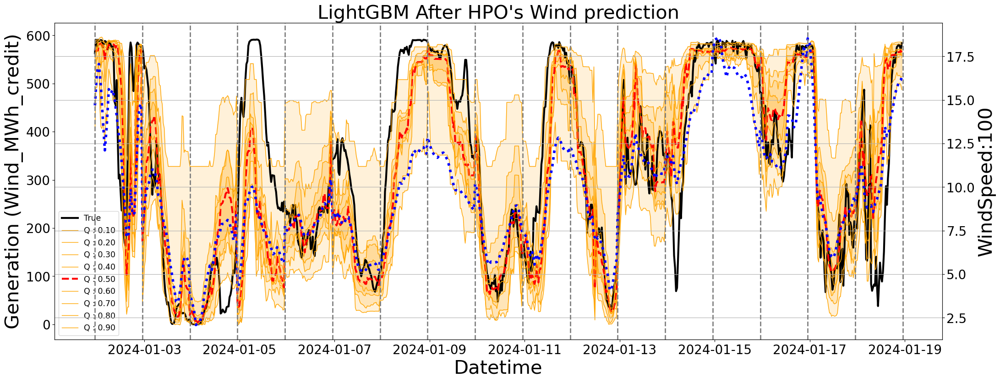

<Axes: xlabel='Datetime', ylabel='Generation (Wind_MWh_credit)'>

In [652]:
output_table.index = df_test[['valid_datetime', 'WindSpeed:100']].set_index('valid_datetime').index

visualize_wind_forecating(output_table, 
                          df_test[['valid_datetime', 'WindSpeed:100']].set_index('valid_datetime'),
                          model_name="LightGBM After HPO")

In [639]:
# daily pinball score
for i in np.arange(len(output_table)//48):
    daily_pinball_score = pinball_score(output_table.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    print(f"Day-{str(output_table.index[i*48])[:16]} ~ {str(output_table.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")
print(f"Mean pinball score : {pinball_score(output_table, target='Wind_MWh_credit')}")

Day-2024-01-01 23:00 ~ 2024-01-02 22:30's Pinball Score (Wind) : 38.798033145802336
Day-2024-01-02 23:00 ~ 2024-01-03 22:30's Pinball Score (Wind) : 34.42032043571705
Day-2024-01-03 23:00 ~ 2024-01-04 22:30's Pinball Score (Wind) : 31.692598330923147
Day-2024-01-04 23:00 ~ 2024-01-05 22:30's Pinball Score (Wind) : 92.4237769939101
Day-2024-01-05 23:00 ~ 2024-01-06 22:30's Pinball Score (Wind) : 15.80393490654523
Day-2024-01-06 23:00 ~ 2024-01-07 22:30's Pinball Score (Wind) : 28.107200069814585
Day-2024-01-07 23:00 ~ 2024-01-08 22:30's Pinball Score (Wind) : 45.72853585851372
Day-2024-01-08 23:00 ~ 2024-01-09 22:30's Pinball Score (Wind) : 24.76332987270243
Day-2024-01-09 23:00 ~ 2024-01-10 22:30's Pinball Score (Wind) : 15.50522017885539
Day-2024-01-10 23:00 ~ 2024-01-11 22:30's Pinball Score (Wind) : 33.11812334787534
Day-2024-01-11 23:00 ~ 2024-01-12 22:30's Pinball Score (Wind) : 15.428890469749794
Day-2024-01-12 23:00 ~ 2024-01-13 22:30's Pinball Score (Wind) : 25.78850345509317
D

In [1754]:
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in lgb_model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

32.163256383535945

In [ ]:
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in lgb_model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

In [531]:
# lgb model save
quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for idx, (alpha, model) in enumerate(zip(quantiles, lgb_model_list)):
    model.save_model('models/LightGBM/best_1_dwd00_ncep00_slp_lgb_model_'+[f"q{qu}_with_noise_cleansing_20240303" for qu in range(10, 100, 10)][idx]+'_train_202412.txt')

# lgb model save
# q10_model = lgb.Booster(model_file='model.txt')

### Catboost multi-quantile

In [183]:
#!pip install catboost
# https://catboost.ai/en/docs/concepts/python-reference_catboostregressor

from catboost import CatBoostRegressor

In [413]:
# Store quantiles 0.01 through 0.99 in a list
quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# Format the quantiles as a string for Catboost
quantile_str = str(quantiles).replace('[','').replace(']','')

# Fit the multi quantile model
model = CatBoostRegressor(iterations=100,
                          loss_function=f'MultiQuantile:alpha={quantile_str}'
                          # loss_function=f'LogLinQuantile:alpha={0.5}'
                          )

In [414]:
model.fit(train_all_input, train_all_output)

0:	learn: 0.0920454	total: 36.8ms	remaining: 3.65s
1:	learn: 0.0897402	total: 57.9ms	remaining: 2.83s
2:	learn: 0.0875131	total: 93.2ms	remaining: 3.01s
3:	learn: 0.0853780	total: 114ms	remaining: 2.74s
4:	learn: 0.0833049	total: 134ms	remaining: 2.54s
5:	learn: 0.0812813	total: 153ms	remaining: 2.4s
6:	learn: 0.0793326	total: 219ms	remaining: 2.91s
7:	learn: 0.0774816	total: 240ms	remaining: 2.76s
8:	learn: 0.0757194	total: 315ms	remaining: 3.19s
9:	learn: 0.0740057	total: 358ms	remaining: 3.22s
10:	learn: 0.0723465	total: 379ms	remaining: 3.07s
11:	learn: 0.0707353	total: 400ms	remaining: 2.93s
12:	learn: 0.0691873	total: 429ms	remaining: 2.87s
13:	learn: 0.0677086	total: 475ms	remaining: 2.92s
14:	learn: 0.0663105	total: 494ms	remaining: 2.8s
15:	learn: 0.0649567	total: 513ms	remaining: 2.69s
16:	learn: 0.0636289	total: 533ms	remaining: 2.6s
17:	learn: 0.0623641	total: 552ms	remaining: 2.52s
18:	learn: 0.0611391	total: 580ms	remaining: 2.47s
19:	learn: 0.0599546	total: 598ms	remaini

In [415]:
# Make predictions on the test set
preds = model.predict(test_input)
inv_test_pred = pd.DataFrame([list(scalerY.inverse_transform(pred_values_by_q.reshape(-1,1)).reshape(-1)) for pred_values_by_q in preds.T]).T.values
inv_test_output = scalerY.inverse_transform(test_output)

# # 성능 평가
output_table = pd.concat([pd.DataFrame(inv_test_pred), pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

27.872456340528217

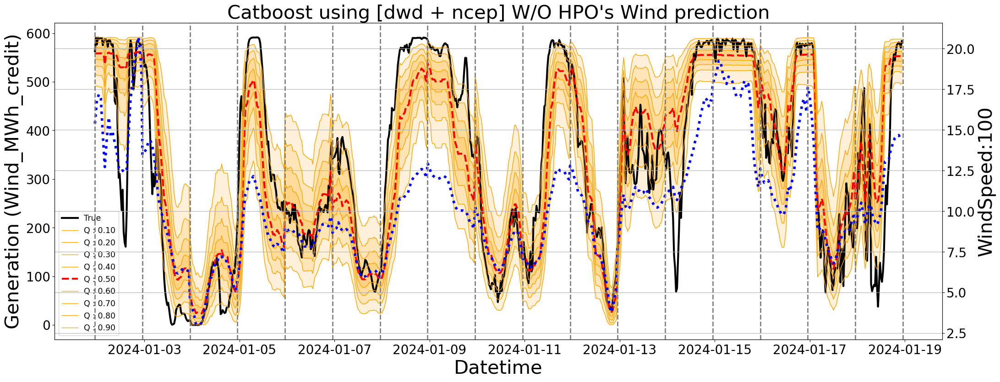

<Axes: xlabel='Datetime', ylabel='Generation (Wind_MWh_credit)'>

In [48]:
output_table.index = df_test[['valid_datetime', 'WindSpeed:100']].set_index('valid_datetime').index

visualize_wind_forecating(output_table, 
                          df_test[['valid_datetime', 'WindSpeed:100']].set_index('valid_datetime'),
                          model_name="Catboost using [dwd + ncep] W/O HPO")

In [121]:
# daily pinball score
for i in np.arange(len(output_table)//48):
    daily_pinball_score = pinball_score(output_table.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    print(f"Day-{str(output_table.index[i*48])[:16]} ~ {str(output_table.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")
print(f"Mean pinball score : {pinball_score(output_table, target='Wind_MWh_credit')}")

Day-2024-01-01 23:00 ~ 2024-01-02 22:30's Pinball Score (Wind) : 36.58007263800301
Day-2024-01-02 23:00 ~ 2024-01-03 22:30's Pinball Score (Wind) : 44.01034880032883
Day-2024-01-03 23:00 ~ 2024-01-04 22:30's Pinball Score (Wind) : 21.197439785274057
Day-2024-01-04 23:00 ~ 2024-01-05 22:30's Pinball Score (Wind) : 44.24246224004199
Day-2024-01-05 23:00 ~ 2024-01-06 22:30's Pinball Score (Wind) : 20.99929942797941
Day-2024-01-06 23:00 ~ 2024-01-07 22:30's Pinball Score (Wind) : 20.74750857532341
Day-2024-01-07 23:00 ~ 2024-01-08 22:30's Pinball Score (Wind) : 45.386763112077226
Day-2024-01-08 23:00 ~ 2024-01-09 22:30's Pinball Score (Wind) : 34.47800922473657
Day-2024-01-09 23:00 ~ 2024-01-10 22:30's Pinball Score (Wind) : 28.21028244782647
Day-2024-01-10 23:00 ~ 2024-01-11 22:30's Pinball Score (Wind) : 31.1822100487541
Day-2024-01-11 23:00 ~ 2024-01-12 22:30's Pinball Score (Wind) : 17.703842431835106
Day-2024-01-12 23:00 ~ 2024-01-13 22:30's Pinball Score (Wind) : 22.059289388251486
D

### Light GBM (monotonicity)

In [423]:
# https://github.com/microsoft/LightGBM/issues/5727
# https://lightgbm.readthedocs.io/en/latest/Python-Intro.html#training

from typing import List, Union, Dict, Any, Tuple
from functools import partial
from itertools import repeat, chain

import numpy as np
import lightgbm as lgb
import pandas as pd


def _grad_rho(u, alpha) -> np.ndarray:
    return -(alpha - (u < 0).astype(float))


def check_loss_grad_hess(
    y_pred: np.ndarray, dtrain: lgb.basic.Dataset, alphas: List[float]
) -> Tuple[np.ndarray, np.ndarray]:
    _len_alpha = len(alphas)
    _y_train = dtrain.get_label()
    _y_pred_reshaped = y_pred.reshape(_len_alpha, -1)
    _y_train_reshaped = _y_train.reshape(_len_alpha, -1)

    grads = []
    for alpha_inx in range(_len_alpha):
        _err_for_alpha = _y_train_reshaped[alpha_inx] - _y_pred_reshaped[alpha_inx]
        grad = _grad_rho(_err_for_alpha, alphas[alpha_inx])
        grads.append(grad)

    grad = np.concatenate(grads)
    hess = np.ones(_y_train.shape)

    return grad, hess


def _alpha_validate(
    alphas: Union[List[float], float],
) -> List[float]:
    if isinstance(alphas, float):
        alphas = [alphas]
    return alphas


def _prepare_x(
    x: Union[pd.DataFrame, pd.Series, np.ndarray],
    alphas: List[float],
) -> pd.DataFrame:
    if isinstance(x, np.ndarray) or isinstance(x, pd.Series):
        x = pd.DataFrame(x)
    assert "_tau" not in x.columns, "Column name '_tau' is not allowed."
    _alpha_repeat_count_list = [list(repeat(alpha, len(x))) for alpha in alphas]
    _alpha_repeat_list = list(chain.from_iterable(_alpha_repeat_count_list))
    _repeated_x = pd.concat([x] * len(alphas), axis=0)

    _repeated_x = _repeated_x.assign(
        _tau=_alpha_repeat_list,
    )
    return _repeated_x


def _prepare_train(
    x: Union[pd.DataFrame, pd.Series, np.ndarray],
    y: Union[pd.Series, np.ndarray],
    alphas: List[float],
) -> Dict[str, Union[pd.DataFrame, np.ndarray]]:
    _train_df = _prepare_x(x, alphas)
    _repeated_y = np.concatenate(list(repeat(y, len(alphas))))
    return (_train_df, _repeated_y)


class MonotonicQuantileRegressor:
    def __init__(self, 
                 x: Union[pd.DataFrame, pd.Series, np.ndarray],
                 y: Union[pd.Series, np.ndarray],
                 alphas: Union[List[float], float]):
        
        alphas = _alpha_validate(alphas)
        self.x_train, self.y_train = _prepare_train(x, y, alphas)
        self.dataset = lgb.Dataset(data=self.x_train, label=self.y_train)
        self.fobj = partial(check_loss_grad_hess, alphas=alphas)

    def train(self, params: Dict[str, Any]) -> lgb.basic.Booster:
        self._params = params.copy()
        if "monotone_constraints" in self._params:
            self._params["monotone_constraints"].append(1)
        else:
            self._params.update(
                {
                    "monotone_constraints": [
                        1 if "_tau" == col else 0 for col in self.x_train.columns
                    ]
                }
            )
            
        self.model = lgb.train(train_set=self.dataset,
                               params=self._params,
                              )
        
        return self.model

    def predict(
        self,
        x: Union[pd.DataFrame, pd.Series, np.ndarray],
        alphas: Union[List[float], float],
    ) -> np.ndarray:
        alphas = _alpha_validate(alphas)
        _x = _prepare_x(x, alphas)
        _pred = self.model.predict(_x)
        _pred = _pred.reshape(len(alphas), len(x))
        return _pred

In [424]:
# params = {
#     "max_depth": 4,
#     "num_leaves": 15,
#     "learning_rate": 0.1,
#     "n_estimators": 100,
#     "objective":partial(check_loss_grad_hess, alphas=alphas),
#     "boosting_type": "gbdt",
# }

# alphas = [0.3, 0.4, 0.5, 0.6, 0.7]
# regressor = MonotonicQuantileRegressor(x=x, y=y_noise, alphas=alphas)
# model = monotonic_quantile_regressor.train(params=params)
# preds = monotonic_quantile_regressor.predict(x=x_test, alphas=alphas)
# preds_df = pd.DataFrame(preds).T

In [425]:
# fixed 된 모델 (가설 실험할때 사용)

quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor

import lightgbm as lgb
import xgboost as xgb

seed_everything(42)

alphas = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# train_dataset = lgb.Dataset(data=train_all_input, 
#                             label=train_all_output)
params = {
    #"objective": "quantile",
    "objective":partial(check_loss_grad_hess, alphas=alphas),
    "max_depth": 30,         # 깊이, Level-wise 방식보단 leaf-wise 방식이 상대적으로 깊음
    "num_leaves": 15,        # 하나의 트리가 가질 수 있는 최대 리프 갯수
    "learning_rate": 0.1,    # d=0.1
    "n_estimators": 400,     # 반복 수행하는 트리 갯수 (크면 성능 올라가나 너무크면 과적합)
    "boosting_type": "gbdt", # goss (gradient 값이 상대적으로 큰 값만 선택적으로 재학습) , dart (tree dropout 적용)
                             # sub_smaple : 행 샘플링
                             # num_leaves : 컬럼에 대한 샘플링
}
    
monotonic_quantile_regressor = MonotonicQuantileRegressor(x=train_all_input, y=train_all_output, alphas=alphas)
model = monotonic_quantile_regressor.train(params=params)

preds = monotonic_quantile_regressor.predict(x=test_input, alphas=alphas)

#model_list = []

# for alpha in alphas:
#     params = {
#         "objective": "quantile",
#         "alpha": alpha,
#         "max_depth": 30,         # 깊이, Level-wise 방식보단 leaf-wise 방식이 상대적으로 깊음
#         "num_leaves": 15,        # 하나의 트리가 가질 수 있는 최대 리프 갯수
#         "learning_rate": 0.1,    # d=0.1
#         "n_estimators": 400,     # 반복 수행하는 트리 갯수 (크면 성능 올라가나 너무크면 과적합)
#         "boosting_type": "gbdt", # goss (gradient 값이 상대적으로 큰 값만 선택적으로 재학습) , dart (tree dropout 적용)
#                                  # sub_smaple : 행 샘플링
#                                  # num_leaves : 컬럼에 대한 샘플링
#         # seed 고정 필요
#     }
#     model_list.append(MonotonicQuantileRegressor.train(train_set=train_dataset, params=params))

[LightGBM] [Info] Using self-defined objective function
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1285
[LightGBM] [Info] Number of data points in the train set: 504891, number of used features: 6
[LightGBM] [Info] Using self-defined objective function
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [1469]:
preds_df = pd.DataFrame(scalerY.inverse_transform(pd.DataFrame(preds).T.values))
inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

39.12278216771968

### xgboost

In [341]:
# #import xgboost as xgb
# from xgboost.sklearn import XGBRegressor
# #utils
# from functools import partial

In [1283]:
# https://xgboost.readthedocs.io/en/stable/python/examples/quantile_regression.html
import xgboost as xgb
from typing import Dict

In [1287]:
# performance might drop.
evals_result: Dict[str, Dict] = {}

quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

Xy = xgb.QuantileDMatrix(train_all_input, train_all_output)
Xy_test = xgb.QuantileDMatrix(test_input, test_output, ref=Xy)

booster = xgb.train({# Use the quantile objective function.
                    "objective": "reg:quantileerror",
                    "tree_method": "gpu_hist", # 'exact'
                    "quantile_alpha": quantiles,
                    # Let's try not to overfit.
                    "learning_rate": 0.1,
                    #"gamma":,
                    #"min_child_weight":,
                    "max_depth": 15},
                    Xy,
                    num_boost_round=100,
                    early_stopping_rounds=5,
                    # The evaluation result is a weighted average across multiple quantiles.
                    evals=[(Xy, "Train"), (Xy_test, "Test")],
                    evals_result=evals_result)

scores = booster.inplace_predict(test_input)

[0]	Train-quantile:0.14262	Test-quantile:0.16085
[1]	Train-quantile:0.12692	Test-quantile:0.14990
[2]	Train-quantile:0.11319	Test-quantile:0.14074
[3]	Train-quantile:0.10119	Test-quantile:0.13237
[4]	Train-quantile:0.09070	Test-quantile:0.12513
[5]	Train-quantile:0.08142	Test-quantile:0.11922
[6]	Train-quantile:0.07322	Test-quantile:0.11395
[7]	Train-quantile:0.06598	Test-quantile:0.10929
[8]	Train-quantile:0.05961	Test-quantile:0.10504
[9]	Train-quantile:0.05402	Test-quantile:0.10173
[10]	Train-quantile:0.04914	Test-quantile:0.09881
[11]	Train-quantile:0.04485	Test-quantile:0.09642
[12]	Train-quantile:0.04103	Test-quantile:0.09439
[13]	Train-quantile:0.03771	Test-quantile:0.09253
[14]	Train-quantile:0.03485	Test-quantile:0.09094
[15]	Train-quantile:0.03241	Test-quantile:0.08962
[16]	Train-quantile:0.03032	Test-quantile:0.08856
[17]	Train-quantile:0.02855	Test-quantile:0.08766
[18]	Train-quantile:0.02699	Test-quantile:0.08676
[19]	Train-quantile:0.02568	Test-quantile:0.08602
[20]	Train

In [1289]:
inv_test_pred = pd.DataFrame([list(scalerY.inverse_transform(values.reshape(-1,1)).reshape(-1)) for values in scores.T]).T.values
inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([pd.DataFrame(inv_test_pred), pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

38.79670066145319

#### Tuning the hyper-parameters of xgboost

In [1578]:
def objective(trial):

    evals_result: Dict[str, Dict] = {}

    Xy = xgb.QuantileDMatrix(train_input, train_output)
    
    param = {'lambda': trial.suggest_float('lambda', 1e-3, 0.1),
             'alpha': trial.suggest_float('alpha', 1e-3, 1.0),
             'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1),
             'subsample': trial.suggest_float('subsample', 0.4, 1),
             'learning_rate': trial.suggest_float('learning_rate',0.0001, 0.1),
             'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
             'max_depth': trial.suggest_int('max_depth', 4,8),
             'min_child_weight': trial.suggest_int('min_child_weight', 2, 50),
             "objective": "reg:quantileerror",
             "tree_method": "gpu_hist",
             "quantile_alpha": quantiles,
            }

    booster = xgb.train(params=param,
                        dtrain=Xy,
                        num_boost_round=50)
                        #early_stopping_rounds=5)
    
    val_pred = booster.inplace_predict(val_input)
    
    inv_test_pred = pd.DataFrame([list(scalerY.inverse_transform(values.reshape(-1,1)).reshape(-1)) for values in val_pred.T]).T.values
    inv_test_output = scalerY.inverse_transform(val_output)

    output_table = pd.concat([pd.DataFrame(inv_test_pred), pd.DataFrame(inv_test_output)], axis=1)
    output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

    mean_pinball_score = pinball_score(output_table, target='Wind_MWh_credit')

    return mean_pinball_score

In [1579]:
study_xgb = optuna.create_study(direction='minimize',
                                study_name = 'Xgboost Optuna', 
                                sampler=sampler)

study_xgb.optimize(objective, n_trials=100)

[I 2024-01-26 03:32:54,387] A new study created in memory with name: Xgboost Optuna
[I 2024-01-26 03:32:56,537] Trial 0 finished with value: 19.692565573949288 and parameters: {'lambda': 0.07644461339600772, 'alpha': 0.8400475936732261, 'colsample_bytree': 0.4629744472130128, 'subsample': 0.7063787850075495, 'learning_rate': 0.06458431740814316, 'n_estimators': 237, 'max_depth': 4, 'min_child_weight': 49}. Best is trial 0 with value: 19.692565573949288.
[I 2024-01-26 03:32:59,775] Trial 1 finished with value: 20.24629270057782 and parameters: {'lambda': 0.08097878679324413, 'alpha': 0.27479352177410804, 'colsample_bytree': 0.5674537642432755, 'subsample': 0.4724077848531869, 'learning_rate': 0.048120757672586625, 'n_estimators': 940, 'max_depth': 8, 'min_child_weight': 13}. Best is trial 0 with value: 19.692565573949288.
[I 2024-01-26 03:33:02,920] Trial 2 finished with value: 19.939850421621433 and parameters: {'lambda': 0.04009097134517152, 'alpha': 0.9702692906963625, 'colsample_byt

[I 2024-01-26 03:33:49,773] Trial 22 finished with value: 19.41956809073378 and parameters: {'lambda': 0.01048117477268011, 'alpha': 0.023268984635358612, 'colsample_bytree': 0.6809396699006601, 'subsample': 0.6015871363062092, 'learning_rate': 0.09948363936196446, 'n_estimators': 672, 'max_depth': 4, 'min_child_weight': 31}. Best is trial 12 with value: 19.40773701717621.
[I 2024-01-26 03:33:52,148] Trial 23 finished with value: 19.494264929746905 and parameters: {'lambda': 0.007978434150932334, 'alpha': 0.2145338269306301, 'colsample_bytree': 0.7630916492905934, 'subsample': 0.5016554587304154, 'learning_rate': 0.08728485307120254, 'n_estimators': 776, 'max_depth': 5, 'min_child_weight': 17}. Best is trial 12 with value: 19.40773701717621.
[I 2024-01-26 03:33:54,286] Trial 24 finished with value: 19.44308835664437 and parameters: {'lambda': 0.020958478146143468, 'alpha': 0.09998605693006932, 'colsample_bytree': 0.8076898278871664, 'subsample': 0.5499921515251843, 'learning_rate': 0.0

[I 2024-01-26 03:34:39,773] Trial 44 finished with value: 19.49876190217505 and parameters: {'lambda': 0.0010997118012760596, 'alpha': 0.9599492130832632, 'colsample_bytree': 0.8778788634526105, 'subsample': 0.5629555791607819, 'learning_rate': 0.09423058310074886, 'n_estimators': 643, 'max_depth': 5, 'min_child_weight': 27}. Best is trial 12 with value: 19.40773701717621.
[I 2024-01-26 03:34:41,913] Trial 45 finished with value: 22.97484870928212 and parameters: {'lambda': 0.016995609763277533, 'alpha': 0.06653633012093857, 'colsample_bytree': 0.7345781104046338, 'subsample': 0.5282566915395457, 'learning_rate': 0.024606323189692518, 'n_estimators': 697, 'max_depth': 4, 'min_child_weight': 20}. Best is trial 12 with value: 19.40773701717621.
[I 2024-01-26 03:34:44,961] Trial 46 finished with value: 19.740164480956405 and parameters: {'lambda': 0.006462639861920912, 'alpha': 0.18470782220086565, 'colsample_bytree': 0.6877488422214573, 'subsample': 0.4291855937657002, 'learning_rate': 0

[I 2024-01-26 03:35:29,811] Trial 66 finished with value: 19.410607021952213 and parameters: {'lambda': 0.009471788496357051, 'alpha': 0.11841597516364918, 'colsample_bytree': 0.5906572708957415, 'subsample': 0.5576310323105843, 'learning_rate': 0.09830139339378567, 'n_estimators': 647, 'max_depth': 4, 'min_child_weight': 6}. Best is trial 53 with value: 19.386410077657242.
[I 2024-01-26 03:35:32,255] Trial 67 finished with value: 49.82767367262693 and parameters: {'lambda': 0.014336286179125414, 'alpha': 0.24440585877709045, 'colsample_bytree': 0.6594148425535865, 'subsample': 0.5283162752409754, 'learning_rate': 0.006767020058106268, 'n_estimators': 512, 'max_depth': 5, 'min_child_weight': 24}. Best is trial 53 with value: 19.386410077657242.
[I 2024-01-26 03:35:34,322] Trial 68 finished with value: 19.407957953874742 and parameters: {'lambda': 0.009361208548021771, 'alpha': 0.03374887910576756, 'colsample_bytree': 0.6365225618827894, 'subsample': 0.6027028970494023, 'learning_rate':

[I 2024-01-26 03:36:17,896] Trial 88 finished with value: 19.362062419107627 and parameters: {'lambda': 0.05264490007216643, 'alpha': 0.2129097401974889, 'colsample_bytree': 0.6118217198113742, 'subsample': 0.5832346642326371, 'learning_rate': 0.09992998339023157, 'n_estimators': 502, 'max_depth': 4, 'min_child_weight': 31}. Best is trial 73 with value: 19.360977295366848.
[I 2024-01-26 03:36:20,083] Trial 89 finished with value: 19.39389013644687 and parameters: {'lambda': 0.043764232056229826, 'alpha': 0.21409082748881458, 'colsample_bytree': 0.6106787784153096, 'subsample': 0.5838358474939783, 'learning_rate': 0.09599853397172528, 'n_estimators': 498, 'max_depth': 4, 'min_child_weight': 27}. Best is trial 73 with value: 19.360977295366848.
[I 2024-01-26 03:36:22,237] Trial 90 finished with value: 19.464235961047624 and parameters: {'lambda': 0.04694977311214444, 'alpha': 0.2094003193669975, 'colsample_bytree': 0.6129813571927626, 'subsample': 0.5798149931611856, 'learning_rate': 0.0

In [400]:
trial = study_xgb.best_trial
trial_params = trial.params

# quantile regression을 위해 추가 parameter 셋팅
trial_params['objective'] = "reg:quantileerror"
trial_params['tree_method'] = "gpu_hist"
trial_params['quantile_alpha'] = quantiles

trial_params

{'lambda': 0.049842530100867366,
 'alpha': 0.6094720103329235,
 'colsample_bytree': 0.9793331545658703,
 'subsample': 0.7533001854293999,
 'learning_rate': 0.08729895215585404,
 'n_estimators': 380,
 'max_depth': 4,
 'min_child_weight': 49,
 'objective': 'reg:quantileerror',
 'tree_method': 'gpu_hist',
 'quantile_alpha': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]}

In [401]:
#Xy = xgb.QuantileDMatrix(train_all_input, train_all_output)
Xy = xgb.QuantileDMatrix(train_input, train_output)

final_xgb_model = xgb.train(params=trial_params,
                            dtrain=Xy,
                            num_boost_round=10000)

test_pred = final_xgb_model.inplace_predict(test_input)

inv_test_pred = pd.DataFrame([list(scalerY.inverse_transform(values.reshape(-1,1)).reshape(-1)) for values in test_pred.T]).T.values
inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([pd.DataFrame(inv_test_pred), pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

23.745362902405372

In [402]:
#Xy = xgb.QuantileDMatrix(train_all_input, train_all_output)
Xy = xgb.QuantileDMatrix(train_all_input, train_all_output)

final_xgb_model = xgb.train(params=trial_params,
                            dtrain=Xy,
                            num_boost_round=10000)

test_pred = final_xgb_model.inplace_predict(test_input)

inv_test_pred = pd.DataFrame([list(scalerY.inverse_transform(values.reshape(-1,1)).reshape(-1)) for values in test_pred.T]).T.values
inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([pd.DataFrame(inv_test_pred), pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

23.491872184433376

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

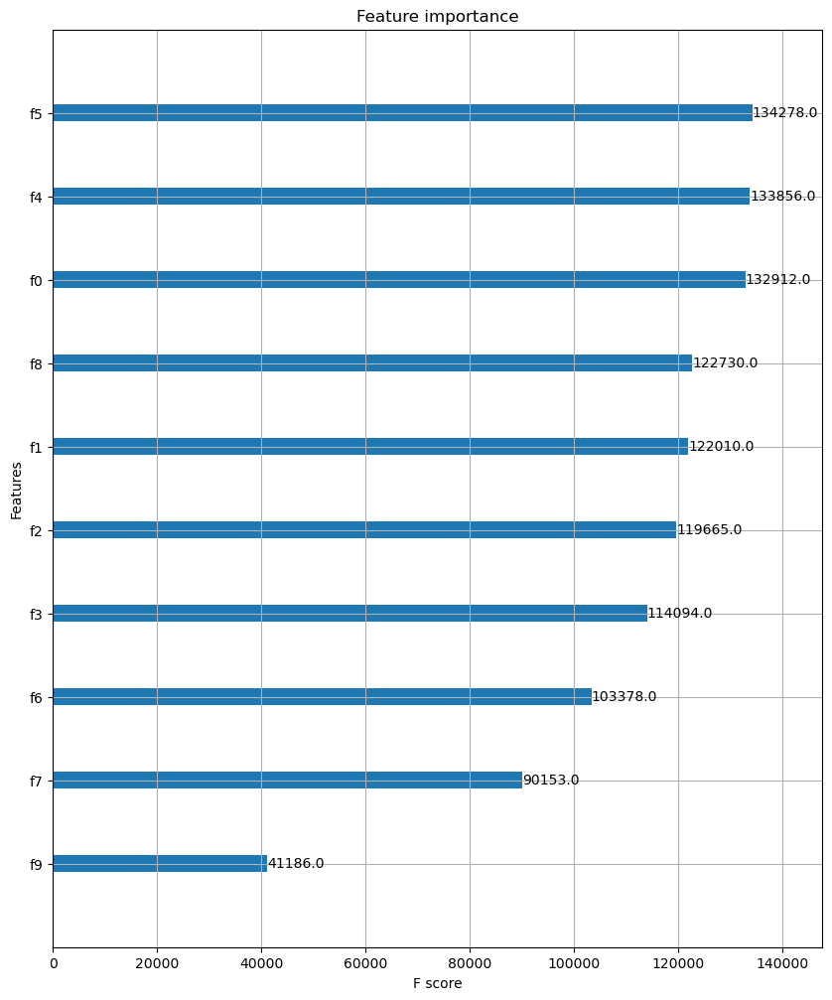

In [32]:
# 특성 중요도 시각화
inputs = ['RelativeHumidity', 'Temperature_wind', 'WindDirection', 'WindDirection:100', 'WindSpeed', 'WindSpeed:100', 'air_density', 'absolute_humidity', 'air_pressure', 'pressure']

fig, ax = plt.subplots(figsize=(10,12))
xgb.plot_importance(final_xgb_model, ax=ax)

In [415]:
# from sklearn_quantile import RandomForestQuantileRegressor

In [33]:
# seed_everything(42)

# alphas = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# qrf = RandomForestQuantileRegressor(q=alphas)
# qrf.fit(train_input, train_output.reshape(-1))

# outputs = qrf.predict(test_input)

# preds_df = pd.DataFrame(outputs).T

In [34]:
# inv_test_pred= scalerY.inverse_transform(preds_df)
# inv_test_output = scalerY.inverse_transform(test_output)

# # output_table = pd.concat([pd.DataFrame(inv_test_pred), pd.DataFrame(inv_test_output)], axis=1)
# # output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

# # pinball_score(output_table, target='Wind_MWh_credit')

### Stats Model_Quantile Reg

In [1433]:
model_list = []
pred_dict = {}

quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

input_columns = ['_'.join(variable.split(':')) if ":" in variable else variable for variable in inputs]

input_str = ''
separator = '+'

for idx, input_variable in enumerate(input_columns):
    input_str += input_variable + ('' if idx == len(inputs) -1 else separator)

for quantile in quantiles:
    df = pd.concat([pd.DataFrame(train_all_input), pd.DataFrame(train_all_output)], axis=1).reset_index(drop=True)
    
    df.columns = [input_columns + target]
    
    quantile_reg = smf.quantreg(f"Wind_MWh_credit ~ {input_str}", df).fit(q = quantile)
    
    model_list.append(quantile_reg)

In [1441]:
# lgb model save
quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for idx, (alpha, model) in enumerate(zip(quantiles, model_list)):
    model.save('models/stats/best_stats_model_'+[f"q{qu}" for qu in range(10, 100, 10)][idx]+'_train_202411.pickle')

In [1436]:
df_test = pd.DataFrame(test_input)
df_test.columns = input_columns

preds_list = [scalerY.inverse_transform(model.predict(df_test).values.reshape(-1, 1)).reshape(-1) for model in model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

96.55544533978606

In [367]:
from sklearn.ensemble import HistGradientBoostingRegressor

In [ ]:
parameters = dict(loss="quantile", max_bins=32, max_iter=50)

hist_quantiles = {
    f"quantile={quantile:.2f}": HistGradientBoostingRegressor(**parameters, quantile=quantile).fit(X, y) for quantile in quantiles
}

### Neural Prohphet

In [90]:
#!pip install neuralprophet

from neuralprophet import NeuralProphet, uncertainty_evaluate, set_log_level, set_random_seed

In [109]:
[train_all_input, train_input, val_input, test_input], scalerX = df_normalization(df_lists=[df_train_all[inputs], df_train[inputs], df_val[inputs], df_test[inputs]], methods="MaxAbsScaler")
[train_all_output, train_output, val_output, test_output], scalerY = df_normalization(df_lists=[df_train_all[target], df_train[target], df_val[target], df_test[target]], methods="QuantileTransformer")

In [163]:
# train_all_input_output = pd.DataFrame(np.append(train_all_input, train_all_output, axis=1), columns=inputs+target)
# train_input_output = pd.DataFrame(np.append(train_input, train_output, axis=1), columns=inputs+target)
# val_input_output = pd.DataFrame(np.append(val_input, val_output, axis=1), columns=inputs+target)
# test_input_output = pd.DataFrame(np.append(test_input, test_output, axis=1), columns=inputs+target)


train_all_input_output = pd.DataFrame(np.append(train_all_output, train_all_input, axis=1), columns=target+inputs)
train_input_output = pd.DataFrame(np.append(train_output, train_input, axis=1), columns=target+inputs)
val_input_output = pd.DataFrame(np.append(val_output, val_input, axis=1), columns=target+inputs)
test_input_output = pd.DataFrame(np.append(test_output, test_input, axis=1), columns=target+inputs)

In [166]:
model = NeuralProphet(
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
    n_changepoints=10,
    learning_rate=0.1,
    quantiles=quantiles
)

In [174]:
quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

m = NeuralProphet(quantiles=quantiles)
for add_variable in inputs: 
    m.add_lagged_regressor(add_variable, n_lags=0)

WARNING - (NP.forecaster.add_lagged_regressor) - Please, set n_lags to a value greater than 0 or to the options 'scalar' or 'auto'. No lags will be added to regressors when n_lags = 0 or n_lags is None
WARNING - (NP.forecaster.add_lagged_regressor) - Please, set n_lags to a value greater than 0 or to the options 'scalar' or 'auto'. No lags will be added to regressors when n_lags = 0 or n_lags is None
WARNING - (NP.forecaster.add_lagged_regressor) - Please, set n_lags to a value greater than 0 or to the options 'scalar' or 'auto'. No lags will be added to regressors when n_lags = 0 or n_lags is None
WARNING - (NP.forecaster.add_lagged_regressor) - Please, set n_lags to a value greater than 0 or to the options 'scalar' or 'auto'. No lags will be added to regressors when n_lags = 0 or n_lags is None
WARNING - (NP.forecaster.add_lagged_regressor) - Please, set n_lags to a value greater than 0 or to the options 'scalar' or 'auto'. No lags will be added to regressors when n_lags = 0 or n_lag

In [175]:
train_all_input_output['ds'] = pd.to_datetime(df_train_all['valid_datetime'].values)
train_input_output['ds'] = pd.to_datetime(df_train['valid_datetime'].values)
val_input_output['ds'] = pd.to_datetime(df_val['valid_datetime'].values)
test_input_output['ds'] = pd.to_datetime(df_test['valid_datetime'].values)

train_all_input_output.rename(columns={'Wind_MWh_credit': 'y'}, inplace=True)
train_input_output.rename(columns={'Wind_MWh_credit': 'y'}, inplace=True)
val_input_output.rename(columns={'Wind_MWh_credit': 'y'}, inplace=True)
test_input_output.rename(columns={'Wind_MWh_credit': 'y'}, inplace=True)

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency 30T corresponds to 99.793% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 30T
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 64
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 69

Finding best initial lr: 100%|██████████████████████████████████████████████████████| 267/267 [00:01<00:00, 197.63it/s]


Epoch 1:   1%|█                                                                        | 1/69 [00:00<00:00, 665.97it/s]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|                                                                  | 0/10 [00:00<?, ?it/s]
Epoch 1:   1%| | 1/69 [00:03<04:12,  3.71s/it, loss=0.705, v_num=2, MAE_val=2.460, RMSE_val=2.880, Loss_val=0.917, RegL
Epoch 2:   3%| | 2/69 [00:00<00:00, 666.50it/s, loss=0.705, v_num=2, MAE_val=2.460, RMSE_val=2.880, Loss_val=0.917, Reg
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|                                                                  | 0/10 [00:00<?, ?it/s]
Epoch 2:   3%| | 2/69 [00:03<02:04,  1.86s/it, loss=0.2, v_num=2, MAE_val=1.230, RMSE_val=1.610, Loss_val=0.195, RegLos
Epoch 3:   4%| | 3/69 [00:00<00:00, 1199.29it/s, loss=0.2, v_num=2, MAE_val=1.230, RMSE_val=1.610, Loss_val=0.195, RegL
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|                                     

Epoch 32:  46%|▍| 32/69 [00:00<00:00, 21321.32it/s, loss=0.0818, v_num=2, MAE_val=1.060, RMSE_val=1.460, Loss_val=0.108
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|                                                                  | 0/10 [00:00<?, ?it/s]
Epoch 32:  46%|▍| 32/69 [00:03<00:04,  8.90it/s, loss=0.0749, v_num=2, MAE_val=1.070, RMSE_val=1.460, Loss_val=0.104, R
Epoch 33:  48%|▍| 33/69 [00:00<00:00, 21991.11it/s, loss=0.0749, v_num=2, MAE_val=1.070, RMSE_val=1.460, Loss_val=0.104
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|                                                                  | 0/10 [00:00<?, ?it/s]
Epoch 33:  48%|▍| 33/69 [00:03<00:04,  8.87it/s, loss=0.0827, v_num=2, MAE_val=1.150, RMSE_val=1.490, Loss_val=0.105, R
Epoch 34:  49%|▍| 34/69 [00:00<00:00, 17017.46it/s, loss=0.0827, v_num=2, MAE_val=1.150, RMSE_val=1.490, Loss_val=0.105
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|                                     

Epoch 63:  91%|▉| 63/69 [00:00<00:00, 25199.42it/s, loss=0.0657, v_num=2, MAE_val=1.010, RMSE_val=1.400, Loss_val=0.084
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|                                                                  | 0/10 [00:00<?, ?it/s]
Epoch 63:  91%|▉| 63/69 [00:03<00:00, 16.79it/s, loss=0.0823, v_num=2, MAE_val=1.020, RMSE_val=1.400, Loss_val=0.0845, 
Epoch 64:  93%|▉| 64/69 [00:00<00:00, 42333.30it/s, loss=0.0823, v_num=2, MAE_val=1.020, RMSE_val=1.400, Loss_val=0.084
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|                                                                  | 0/10 [00:00<?, ?it/s]
Epoch 64:  93%|▉| 64/69 [00:03<00:00, 17.27it/s, loss=0.0708, v_num=2, MAE_val=1.020, RMSE_val=1.410, Loss_val=0.0861, 
Epoch 65:  94%|▉| 65/69 [00:00<00:00, 25999.40it/s, loss=0.0708, v_num=2, MAE_val=1.020, RMSE_val=1.410, Loss_val=0.086
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|                                     

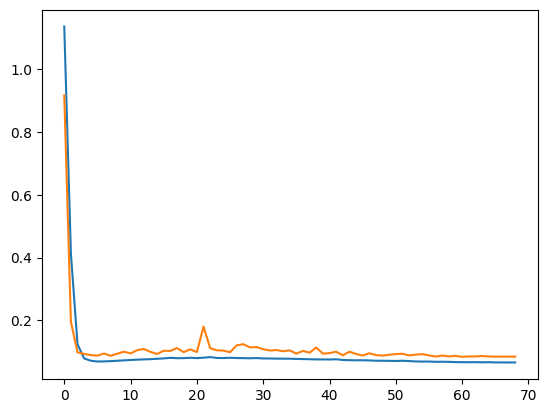

In [176]:
metrics = m.fit(train_all_input_output, freq='30T', validation_df=val_input_output, progress='plot')

In [178]:
forecast1 = m.predict(test_input_output)

INFO - (NP.df_utils._infer_frequency) - Major frequency 30T corresponds to 99.584% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 30T
INFO - (NP.df_utils._infer_frequency) - Major frequency 30T corresponds to 99.584% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - 30T


Predicting DataLoader 0: 100%|███████████████████████████████████████████████████████████| 6/6 [00:00<00:00, 96.00it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


In [179]:
forecast1

,ds,y,yhat1,yhat1 10.0%,yhat1 20.0%,yhat1 30.0%,yhat1 40.0%,yhat1 60.0%,yhat1 70.0%,yhat1 80.0%,yhat1 90.0%,trend,season_yearly,season_weekly,season_daily
0,2023-07-07 00:00:00,0.543674,-0.477362,-2.038109,-1.236398,-0.871241,-0.626227,-0.292950,-0.126073,0.060797,0.335418,-0.057298,-0.527690,0.034153,0.073472
1,2023-07-07 00:30:00,0.394377,-0.492926,-2.080590,-1.266374,-0.891973,-0.642865,-0.305096,-0.136429,0.052345,0.330306,-0.057297,-0.527905,0.028791,0.063485
2,2023-07-07 01:00:00,0.419160,-0.511150,-2.130052,-1.300509,-0.916417,-0.662532,-0.318784,-0.147700,0.043797,0.325850,-0.057296,-0.528120,0.023485,0.050781
3,2023-07-07 01:30:00,0.351987,-0.530500,-2.180288,-1.334958,-0.942567,-0.683993,-0.333657,-0.159751,0.035055,0.321338,-0.057295,-0.528336,0.018241,0.036891
4,2023-07-07 02:00:00,0.276130,-0.549112,-2.226403,-1.366505,-0.968139,-0.705474,-0.348824,-0.171990,0.026267,0.316287,-0.057295,-0.528552,0.013061,0.023674
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5280,2023-10-27 13:30:00,-0.088119,0.725673,0.014169,0.310338,0.376248,0.619937,0.854302,1.068667,1.307661,1.483127,-0.052912,0.881798,-0.081903,-0.021310
5281,2023-10-27 14:00:00,-0.203220,0.715768,-0.016798,0.292306,0.361947,0.608447,0.846048,1.061146,1.301146,1.478307,-0.052912,0.882121,-0.084883,-0.028558
5282,2023-10-27 14:30:00,-0.450545,0.707282,-0.043939,0.276978,0.349917,0.598576,0.838386,1.054227,1.295599,1.474900,-0.052911,0.882442,-0.087771,-0.034479
5283,2023-10-27 23:00:00,-1.204395,0.794776,0.162882,0.425751,0.464984,0.694627,0.914729,1.126902,1.368224,1.546358,-0.052897,0.887721,-0.124111,0.084063


In [ ]:
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in lgb_model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

pinball_score(output_table, target='Wind_MWh_credit')

### Inference

In [1547]:
from datetime import datetime, timedelta

def test_data_processing(wind_csv_lists, solar_csv_lists):
    """
    """
    temp_df = pd.DataFrame()
    
    for idx, (wind_file, solar_file) in enumerate(zip(wind_csv_lists, solar_csv_lists)):
    
        print(f"wind_file : {wind_file}, solar_file : {solar_file}")
        
        # 예보 시간 추출 : year-month-day 23:00:00 ~ year-month-(day+1) 22:30:00
        year, month, day = wind_file.split("_")[5][0:4], wind_file.split("_")[5][4:5], wind_file.split("_")[5][5:]
        # year, month, day = wind_file.split("_")[5][0:4], wind_file.split("_")[5][4:6], wind_file.split("_")[5][6:]

        temp_valid_datetime_lower = pd.to_datetime(f"{year}-{month}-{day} 23:00:00")
        temp_valid_datetime_upper = pd.to_datetime(f"{year}-{month}-{int(day)} 22:30:00") + timedelta(hours=24)

        print(f"★valid_datetime boundary : {temp_valid_datetime_lower} ~ {temp_valid_datetime_upper}★")

        # csv 파일 불러오기
        temp_latest_dwd_wind = pd.read_csv(f"data/updated_data/{wind_file}", index_col=0)
        temp_latest_dwd_solar = pd.read_csv(f"data/updated_data/{solar_file}", index_col=0)

        ### 풍력 기상 데이터 후처리
        temp_latest_dwd_wind_features = pd.DataFrame(columns=temp_latest_dwd_wind.columns, data=np.zeros((int(temp_latest_dwd_wind.shape[0]/36), temp_latest_dwd_wind.shape[1])))
        temp_latest_dwd_wind_features.drop(columns=['longitude', 'latitude'], inplace=True)

        for i in range(int(temp_latest_dwd_wind.shape[0]/36)):
            avg = temp_latest_dwd_wind.iloc[36*i:36*(i+1),4:].mean()
            time_idx = temp_latest_dwd_wind.iloc[36*i:36*(i+1),:2].values[0]
            temp_latest_dwd_wind_features.loc[i,avg.keys()] = avg.values
            temp_latest_dwd_wind_features.iloc[i,:2] = time_idx
        
        temp_latest_dwd_wind_features.rename(columns={"PressureReducedMSL" : "pressure_wind"}, inplace=True)
        
        ### 태양광 기상 데이터 후처리
        temp_latest_dwd_solar_features = pd.DataFrame(columns=temp_latest_dwd_solar.columns, data=np.zeros((int(temp_latest_dwd_solar.shape[0]/20), temp_latest_dwd_solar.shape[1])))
        temp_latest_dwd_solar_features.drop(columns=['point', 'longitude', 'latitude'], inplace=True)
        
        for i in range(int(temp_latest_dwd_solar.shape[0]/20)):
            avg = temp_latest_dwd_solar.iloc[20*i:20*(i+1),3:-2].mean()
            time_idx = temp_latest_dwd_solar.iloc[20*i:20*(i+1),:2].values[0]
            temp_latest_dwd_solar_features.loc[i,avg.keys()] = avg.values
            temp_latest_dwd_solar_features.iloc[i,:2] = time_idx
            
        temp_latest_dwd_solar_features.rename(columns={"PressureReducedMSL" : "pressure_pv"}, inplace=True)
        
        ## 위치 기준으로 평균화 및 30분 단위로 시간 변경
        temp_latest_forecast_table = temp_latest_dwd_wind_features.merge(temp_latest_dwd_solar_features, how="inner", on=["valid_datetime", "valid_datetime"])
        temp_latest_forecast_table.valid_datetime = pd.DatetimeIndex(temp_latest_forecast_table.valid_datetime)
        temp_latest_forecast_table = temp_latest_forecast_table.set_index("valid_datetime").resample("30T").interpolate("linear",limit=5).reset_index()
        temp_latest_forecast_table.rename(columns={"Temperature_x":"Temperature_wind", "Temperature_y":"Temperature_solar", 'ref_datetime_x' : 'ref_datetime'}, inplace=True)
        
        ref_datetime = temp_latest_forecast_table["ref_datetime"][0]
        temp_latest_forecast_table['ref_datetime'].fillna(ref_datetime, inplace=True)
        
        
        temp_latest_forecast_table.drop(columns=['ref_datetime_y'], inplace=True)
        test_modeling_columns = temp_latest_forecast_table.columns
        
        # 최근 발표된 기상 데이터만 활용
        temp_latest_forecast_table.set_index('valid_datetime', inplace=True)
        temp_latest_forecast_table.dropna(inplace=True)

        temp_latest_forecast_table.sort_index(inplace=True)
        temp_latest_forecast_table = temp_latest_forecast_table[str(temp_valid_datetime_lower):str(temp_valid_datetime_upper)].reset_index()
        
        temp_df = pd.concat([temp_df, temp_latest_forecast_table])
        
    temp_df.rename(columns={"pressure_wind" : "pressure"}, inplace=True)
    temp_df['pressure'] = temp_df['pressure']/100
    temp_df.drop(columns=['pressure_pv'], inplace=True)
    
    if len(temp_df)%48==0:
        print(f"Preprocess Success : {len(temp_df)}")
    else:
        print("Preprocess Failed")
    
    return temp_df

In [1550]:
#day by day
#wind_csv_lists = ['dwd_icon_eu_hornsea_1_2024117_0_raw.csv']
# wind_csv_lists = ['dwd_icon_eu_hornsea_1_2024121_0_raw.csv']
# wind_csv_lists = ['dwd_icon_eu_hornsea_1_2024122_0_raw.csv']
# wind_csv_lists = ['dwd_icon_eu_hornsea_1_2024123_0_raw.csv']
# wind_csv_lists = ['dwd_icon_eu_hornsea_1_2024126_0_raw.csv']
wind_csv_lists = ['dwd_icon_eu_hornsea_1_2024128_0_raw.csv']
wind_csv_lists = ['dwd_icon_eu_hornsea_1_2024129_0_raw.csv']

#solar_csv_lists = ['dwd_icon_pes10_2024117_0_raw.csv']
# solar_csv_lists = ['dwd_icon_pes10_2024121_0_raw.csv']
# solar_csv_lists = ['dwd_icon_pes10_2024122_0_raw.csv']
# solar_csv_lists = ['dwd_icon_pes10_2024123_0_raw.csv']
#solar_csv_lists = ['dwd_icon_pes10_2024126_0_raw.csv']
solar_csv_lists = ['dwd_icon_pes10_2024128_0_raw.csv']
solar_csv_lists = ['dwd_icon_pes10_2024129_0_raw.csv']

# # #
wind_csv_lists = [#'dwd_icon_eu_hornsea_1_202419_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024110_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024111_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024112_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024113_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024114_18_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024115_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024116_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024117_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024118_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024119_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024120_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024121_0_raw.csv',
                  'dwd_icon_eu_hornsea_1_2024122_0_raw.csv',    
                 ]

solar_csv_lists = [#'dwd_icon_pes10_202419_0_raw.csv',
                   'dwd_icon_pes10_2024110_0_raw.csv',
                   'dwd_icon_pes10_2024111_0_raw.csv',
                   'dwd_icon_pes10_2024112_0_raw.csv',
                   'dwd_icon_pes10_2024113_0_raw.csv',
                   'dwd_icon_pes10_2024114_18_raw.csv',
                   'dwd_icon_pes10_2024115_0_raw.csv',
                   'dwd_icon_pes10_2024116_0_raw.csv',
                   'dwd_icon_pes10_2024117_0_raw.csv',
                   'dwd_icon_pes10_2024118_0_raw.csv',
                   'dwd_icon_pes10_2024119_0_raw.csv',
                   'dwd_icon_pes10_2024120_0_raw.csv',
                   'dwd_icon_pes10_2024121_0_raw.csv',
                   'dwd_icon_pes10_2024122_0_raw.csv',    
                   ]


wind_csv_lists = [#'dwd_icon_eu_hornsea_1_202419_0_raw.csv',
                  'ncep_gfs_hornsea_1_2024119_6_raw.csv',
                  'ncep_gfs_hornsea_1_2024120_6_raw.csv',
                  'ncep_gfs_hornsea_1_2024121_0_raw.csv',
                  'ncep_gfs_hornsea_1_2024122_0_raw.csv',    
                 ]

solar_csv_lists = [#'dwd_icon_pes10_202419_0_raw.csv',
                   'ncep_gfs_pes10_2024119_6_raw.csv',
                   'ncep_gfs_pes10_2024120_6_raw.csv',
                   'ncep_gfs_pes10_2024121_0_raw.csv',
                   'ncep_gfs_pes10_2024122_0_raw.csv',    
                   ]

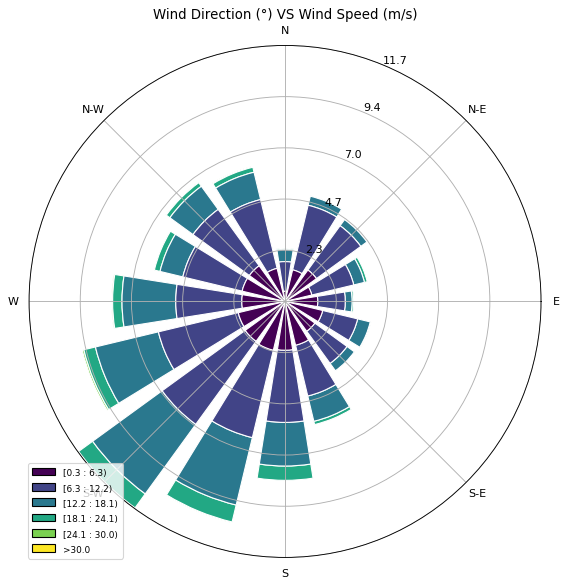

In [1555]:
from windrose import WindroseAxes

ax = WindroseAxes.from_ax()
ax.bar(df_train_all['WindDirection:100'], 
       df_train_all['WindSpeed:100'], normed=True, opening=0.8, edgecolor='white')
ax.set_legend()

plt.title("Wind Direction (°) VS Wind Speed (m/s)")
plt.show()

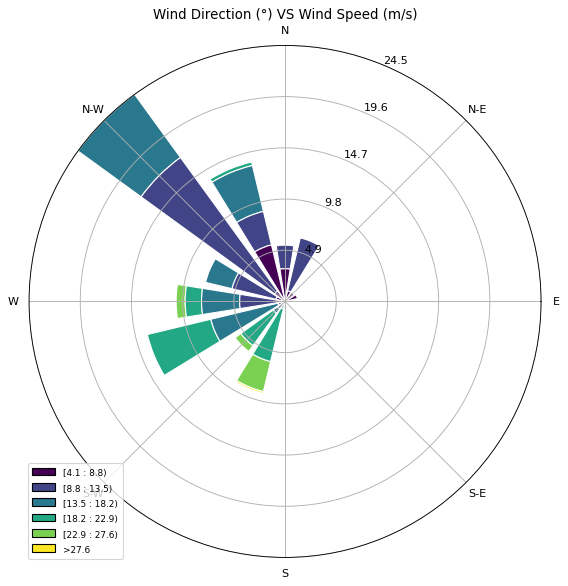

In [1554]:
from windrose import WindroseAxes

ax = WindroseAxes.from_ax()
ax.bar(test_modeling_table['WindDirection:100'], 
       test_modeling_table['WindSpeed:100'], normed=True, opening=0.8, edgecolor='white')
ax.set_legend()

plt.title("Wind Direction (°) VS Wind Speed (m/s)")
plt.show()

In [1551]:
test_modeling_table = test_data_processing(wind_csv_lists, solar_csv_lists)

wind_file : ncep_gfs_hornsea_1_2024119_6_raw.csv, solar_file : ncep_gfs_pes10_2024119_6_raw.csv


OutOfBoundsDatetime: Out of bounds nanosecond timestamp: 6-- 23:00:00, at position 0

In [1448]:
WindSpeed_100 = test_modeling_table['WindSpeed:100']
WindDirection_100 = test_modeling_table['WindDirection:100']


test_modeling_table = pd.concat([test_modeling_table,
                       WindSpeed_100.shift(1).rename("WindSpeed:100_30min"),
                       WindSpeed_100.shift(2).rename("WindSpeed:100_60min"),
                       WindSpeed_100.shift(3).rename("WindSpeed:100_90min"),
                       WindSpeed_100.shift(4).rename("WindSpeed:100_120min"),
                       WindSpeed_100.shift(5).rename("WindSpeed:100_150min"),
                       WindSpeed_100.shift(6).rename("WindSpeed:100_180min"),
                      ], axis="columns")

test_modeling_table = pd.concat([test_modeling_table,
                       WindDirection_100.shift(1).rename("WindDirection:100_30min"),
                       WindDirection_100.shift(2).rename("WindDirection:100_60min"),
                       WindDirection_100.shift(3).rename("WindDirection:100_90min"),
                       WindDirection_100.shift(4).rename("WindDirection:100_120min"),
                       WindDirection_100.shift(5).rename("WindDirection:100_150min"),
                       WindDirection_100.shift(6).rename("WindDirection:100_180min"),
                      ], axis="columns")

test_modeling_table['WindDirection:100_diff'] = (test_modeling_table['WindDirection:100'] - test_modeling_table['WindDirection:100_30min'])
test_modeling_table['WindDirection:100_diff_2'] = (test_modeling_table['WindDirection:100_30min'] - test_modeling_table['WindDirection:100_60min'])

test_modeling_table['WindDirection:100_diff'] = test_modeling_table['WindDirection:100_diff'].fillna(-1.25)
test_modeling_table['WindDirection:100_diff_2'] = test_modeling_table['WindDirection:100_diff_2'].fillna(-1.25)

In [1449]:
df_test = test_modeling_table.copy()

In [1450]:
df_train_all['air_density'] = df_train_all.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_train['air_density'] = df_train.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_val['air_density'] = df_val.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_test['air_density'] = df_test.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)

df_train_all['absolute_humidity'] = df_train_all.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_train['absolute_humidity'] = df_train.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_val['absolute_humidity'] = df_val.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_test['absolute_humidity'] = df_test.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)

df_train_all['air_pressure'] = df_train_all.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_train['air_pressure'] = df_train.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_val['air_pressure'] = df_val.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_test['air_pressure'] = df_test.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)

In [1451]:
# # 성능 향상 발생 : 0.0
# df_train_all['component_x'] = df_train_all['WindSpeed']*np.cos(df_train_all['WindSpeed']*np.pi/180)
# df_train_all['component_y'] = df_train_all['WindDirection']*np.sin(df_train_all['WindDirection']*np.pi/180)
# df_train_all['component_x:100'] = df_train_all['WindSpeed:100']*np.cos(df_train_all['WindSpeed:100']*np.pi/180)
# df_train_all['component_y:100'] = df_train_all['WindDirection:100']*np.sin(df_train_all['WindDirection:100']*np.pi/180)

# df_train['component_x'] = df_train['WindSpeed']*np.cos(df_train['WindSpeed']*np.pi/180)
# df_train['component_y'] = df_train['WindDirection']*np.sin(df_train['WindDirection']*np.pi/180)
# df_train['component_x:100'] = df_train['WindSpeed:100']*np.cos(df_train['WindSpeed:100']*np.pi/180)
# df_train['component_y:100'] = df_train['WindDirection:100']*np.sin(df_train['WindDirection:100']*np.pi/180)

# df_val['component_x'] = df_val['WindSpeed']*np.cos(df_val['WindSpeed']*np.pi/180)
# df_val['component_y'] = df_val['WindDirection']*np.sin(df_val['WindDirection']*np.pi/180)
# df_val['component_x:100'] = df_val['WindSpeed:100']*np.cos(df_val['WindSpeed:100']*np.pi/180)
# df_val['component_y:100'] = df_val['WindDirection:100']*np.sin(df_val['WindDirection:100']*np.pi/180)

# df_test['component_x'] = df_test['WindSpeed']*np.cos(df_test['WindSpeed']*np.pi/180)
# df_test['component_y'] = df_test['WindDirection']*np.sin(df_test['WindDirection']*np.pi/180)
# df_test['component_x:100'] = df_test['WindSpeed:100']*np.cos(df_test['WindSpeed:100']*np.pi/180)
# df_test['component_y:100'] = df_test['WindDirection:100']*np.sin(df_test['WindDirection:100']*np.pi/180)


# 성능 향상 발생 : 0.0
df_train_all['component_x'] = df_train_all['WindSpeed']*np.cos(df_train_all['WindDirection']*np.pi/180)
df_train_all['component_y'] = df_train_all['WindSpeed']*np.sin(df_train_all['WindDirection']*np.pi/180)
df_train_all['component_x:100'] = df_train_all['WindSpeed:100']*np.cos(df_train_all['WindDirection:100']*np.pi/180)
df_train_all['component_y:100'] = df_train_all['WindSpeed:100']*np.sin(df_train_all['WindDirection:100']*np.pi/180)

df_train['component_x'] = df_train['WindSpeed']*np.cos(df_train['WindDirection']*np.pi/180)
df_train['component_y'] = df_train['WindSpeed']*np.sin(df_train['WindDirection']*np.pi/180)
df_train['component_x:100'] = df_train['WindSpeed:100']*np.cos(df_train['WindDirection:100']*np.pi/180)
df_train['component_y:100'] = df_train['WindSpeed:100']*np.sin(df_train['WindDirection:100']*np.pi/180)

df_val['component_x'] = df_val['WindSpeed']*np.cos(df_val['WindDirection']*np.pi/180)
df_val['component_y'] = df_val['WindSpeed']*np.sin(df_val['WindDirection']*np.pi/180)
df_val['component_x:100'] = df_val['WindSpeed:100']*np.cos(df_val['WindDirection:100']*np.pi/180)
df_val['component_y:100'] = df_val['WindSpeed:100']*np.sin(df_val['WindDirection:100']*np.pi/180)

df_test['component_x'] = df_test['WindSpeed']*np.cos(df_test['WindDirection']*np.pi/180)
df_test['component_y'] = df_test['WindSpeed']*np.sin(df_test['WindDirection']*np.pi/180)
df_test['component_x:100'] = df_test['WindSpeed:100']*np.cos(df_test['WindDirection:100']*np.pi/180)
df_test['component_y:100'] = df_test['WindSpeed:100']*np.sin(df_test['WindDirection:100']*np.pi/180)

In [1452]:
scaler = MaxAbsScaler()
scalerX = scaler.fit(df_train[inputs])

test_input = scalerX.transform(df_test[inputs])

scaler = QuantileTransformer(n_quantiles=30, random_state=0, output_distribution="normal")
scalerY = scalerY.fit(df_train[target])

In [1453]:
#model_names = [f"best_1_slp_lgb_model_q{i}_with_noise_cleansing_train_202411.txt" for i in np.arange(1,10)*10]
# lgb_model_list = [lgb.Booster(model_file=f"models/LightGBM/{model_name}") for model_name in model_names]

lgb_wind_preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in lgb_model_list]
lgb_wind_preds_df = pd.DataFrame(lgb_wind_preds_list).T

lgb_wind_preds_df.columns = [f"q{qu}" for qu in range(10, 100, 10)] #  + target
len(lgb_wind_preds_df)

576

In [1457]:
target_file_lists = [
                     #'wind_mv_2024-01-10.csv',
                     'wind_mv_2024-01-11.csv',
                     'wind_mv_2024-01-12.csv',
                     'wind_mv_2024-01-13.csv',
                     'wind_mv_2024-01-14.csv',
                     'wind_mv_2024-01-15.csv',
                     'wind_mv_2024-01-16.csv',
                     'wind_mv_2024-01-17.csv',
                     'wind_mv_2024-01-18.csv',
                     'wind_mv_2024-01-19.csv',
                     'wind_mv_2024-01-20.csv',
                     'wind_mv_2024-01-21.csv',
                     'wind_mv_2024-01-22.csv',    
                      ]

test_y_normalized_inv = []

for idx, target_file in enumerate(target_file_lists):
    wind_test = pd.read_csv(f"data/updated_data/{target_file}", index_col=0)
    wind_target = (0.5*wind_test["generation_mw"] - wind_test["boa"]).values.reshape(-1,1).T
    test_y_normalized_inv.append(list(wind_target[0]))

test_y_normalized_inv = np.array(test_y_normalized_inv).reshape(-1)

output_table = pd.concat([lgb_wind_preds_df, pd.DataFrame(test_y_normalized_inv)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target
output_table.index = test_modeling_table['valid_datetime']

In [1459]:
# daily pinball score
for i in np.arange(len(output_table)//48):
    daily_pinball_score = pinball_score(output_table.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    #print(f"Day-{i+1}'s Pinball Score (Wind) : {daily_pinball_score}")
    print(f"Day-{str(output_table.index[i*48])[:16]} ~ {str(output_table.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")
print(f"Mean pinball score : {pinball_score(output_table, target='Wind_MWh_credit')}")

Day-2024-01-10 23:00 ~ 2024-01-11 22:30's Pinball Score (Wind) : 45.13368820217122
Day-2024-01-11 23:00 ~ 2024-01-12 22:30's Pinball Score (Wind) : 14.80241101592895
Day-2024-01-12 23:00 ~ 2024-01-13 22:30's Pinball Score (Wind) : 34.020164608519565
Day-2024-01-13 23:00 ~ 2024-01-14 22:30's Pinball Score (Wind) : 35.21815516622607
Day-2024-01-14 23:00 ~ 2024-01-15 22:30's Pinball Score (Wind) : 4.347013285909743
Day-2024-01-15 23:00 ~ 2024-01-16 22:30's Pinball Score (Wind) : 31.968084497644465
Day-2024-01-16 23:00 ~ 2024-01-17 22:30's Pinball Score (Wind) : 20.06962257155904
Day-2024-01-17 23:00 ~ 2024-01-18 22:30's Pinball Score (Wind) : 51.95781369522257
Day-2024-01-18 23:00 ~ 2024-01-19 22:30's Pinball Score (Wind) : 72.40051172336285
Day-2024-01-20 23:00 ~ 2024-01-21 22:30's Pinball Score (Wind) : 121.56437285201807
Day-2024-01-21 23:00 ~ 2024-01-22 22:30's Pinball Score (Wind) : 146.58265046927804
Day-2024-01-22 23:00 ~ 2024-01-23 22:30's Pinball Score (Wind) : 166.50471905072467

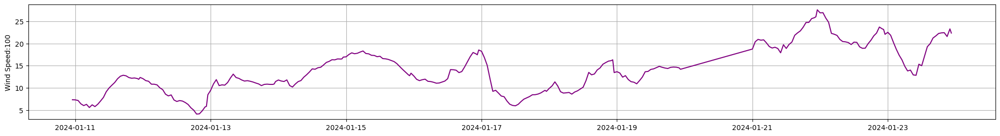

In [1472]:
df_temp_test = df_test.set_index('valid_datetime').copy()
df_temp_test_modeling_table = test_modeling_table.set_index('valid_datetime').copy()

fig, ax = plt.subplots(figsize=(25, 3))

# ax.plot(df_temp_test['WindDirection:100'], color='blue')
# plt.ylabel("Wind Direction:100")
ax.plot(df_temp_test['WindSpeed:100'], color='purple')
plt.ylabel("Wind Speed:100")
# ax.plot(df_temp_test['air_density'])
# plt.ylabel("air_density")
# ax.plot(df_temp_test['absolute_humidity'])
# plt.ylabel("absolute_humidity")

# ax.plot(df_temp_test_modeling_table['WindDirection:100_diff'])
# plt.ylabel("WindDirection:100_diff")
plt.grid()
plt.show()

In [1513]:
output_table['2024-01-19 23:00':'2024-01-20 22:30']

#output_table['2024-01-20 23:00':'2024-01-21 22:30']

,q10,q20,q30,q40,q50,q60,q70,q80,q90,Wind_MWh_credit,target
valid_datetime,,,,,,,,,,,


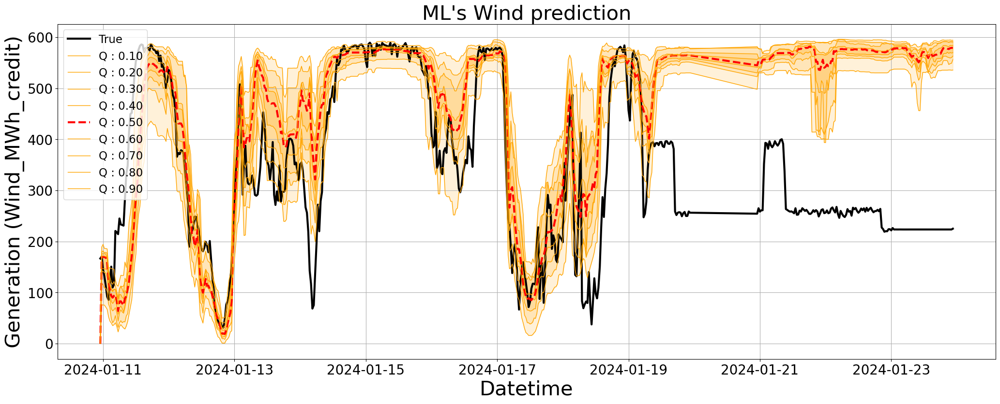

<Axes: title={'center': "ML's Wind prediction"}, xlabel='Datetime', ylabel='Generation (Wind_MWh_credit)'>

In [1519]:
visualize_wind_forecating(output_table, gt=output_table['Wind_MWh_credit'].values, model_name="ML")

In [1299]:
def visualize_wind_forecating(pred_df, gt, model_name="LightGBM"):
    fig, ax = plt.subplots(figsize=(25, 9))

    pred_df['target'] = gt
    
    quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9] # 0,1,2,3,4,5,6,7,8
    n_quantiles = len(quantiles)
    
    # test_y_normalized_inv = inv_test_output[start*48:end*48]
    inv_test_pred = pred_df.copy()
    
    ax.plot(pred_df['target'], label='True', color = 'black', linewidth = 3)
    
    # 0.1, 0.9
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 0].values.reshape(-1),
                    inv_test_pred.iloc[:, 8].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.2, 0.8
    
    ax.fill_between(inv_test_pred.index, #np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 1].values.reshape(-1),
                    inv_test_pred.iloc[:, 7].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.3, 0.7
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 2].values.reshape(-1),
                    inv_test_pred.iloc[:, 6].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.4, 0.6
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 3].values.reshape(-1),
                    inv_test_pred.iloc[:, 5].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    
    for q_idx in range(n_quantiles):
        if quantiles[q_idx] == 0.5:
            quantile_color = 'red'
            quantile_linestyle = '--'
            quantile_linewidth = 3
            alpha = 1
        else:
            quantile_color = 'orange'
            quantile_linestyle = 'solid'
            quantile_linewidth = 1
            alpha = 1
    
        # ax.plot(test_pred_[start:end,48*q_idx:48*(q_idx+1)].reshape(-1), label = ('Q : %.2f' %quantiles[q_idx]), color = quantile_color, linestyle = quantile_linestyle, linewidth = quantile_linewidth, alpha=alpha)
        ax.plot(inv_test_pred.index,
                inv_test_pred.iloc[:, q_idx].values.reshape(-1), 
                label = ('Q : %.2f' %quantiles[q_idx]), 
                color = quantile_color, 
                linestyle = quantile_linestyle, 
                linewidth = quantile_linewidth, 
                alpha=alpha)
    
    plt.grid()
    # ax.set(title="Test set : PV power forecasting", ylabel="Normalized Power", xlabel="Time")
    
    # plt.title("Test set : PV power forecasting", fontsize=20)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plt.xlabel('Datetime', fontsize=30)
    plt.ylabel('Generation (Wind_MWh_credit)', fontsize=30)
    plt.title(f"{model_name}'s Wind prediction", fontsize=30)
    legend = ax.legend(loc='upper left',fontsize=20, frameon=1, prop={'size': 16.5})
    plt.show()
    
    return ax

## EDA (Cuttail)

In [1733]:
df_train_all_temp = df_train_all.set_index("valid_datetime").copy()

total_start_range = pd.date_range(start="2020-09", end="2024-02", freq='M').strftime("%Y-%m").to_list()
total_end_range = pd.date_range(start="2020-10", end="2024-03", freq='M').strftime("%Y-%m").to_list()

In [1759]:
# df_train_all_temp['air_density'].describe()

In [1735]:
for (start_time, end_time) in zip(total_start_range, total_end_range):
    
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(25, 12))

    ax1.scatter(df_train_all_temp['air_density'].index,
                df_train_all_temp['air_density'], 
                color='red',
                s=5)
    ax1.set_ylabel("air_density")    
    ax1.set_ylim(-5, 5)
    
    ax2.scatter(df_train_all_temp['WindDirection:100'].index,
                df_train_all_temp['WindDirection:100'], 
                color='green',
                s=5)
    ax2.set_ylabel("Wind Direction:100")

    ax3.scatter(df_train_all_temp['WindSpeed:100'].index,
                df_train_all_temp['WindSpeed:100'], 
                color='blue',
                s=5)
    
    ax3.set_ylabel("Wind Speed:100")

    ax4.scatter(df_train_all_temp['Wind_MWh_credit'].index,
                df_train_all_temp['Wind_MWh_credit'], 
                color='purple',
                s=5)
    ax4.set_ylabel("Wind_MWh_credit")
    
    
    for ax in [ax1, ax2, ax3, ax4]:
        ax.set_xlim(pd.to_datetime(start_time), pd.to_datetime(end_time))
        ax.grid(True)

    plt.tight_layout()
    
    plt.savefig(f'figure/{start_time}_{end_time}.png')


KeyboardInterrupt



Error in callback <function flush_figures at 0x00000209BB142A20> (for post_execute):



KeyboardInterrupt



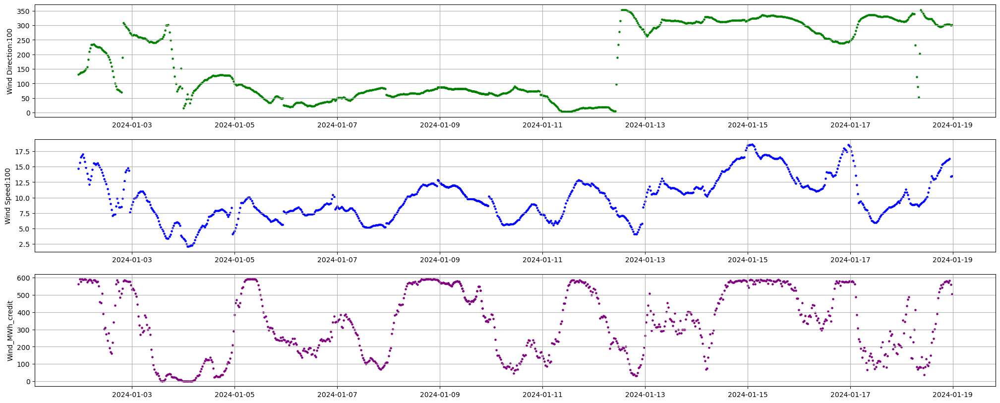

In [1298]:
df_test_temp = df_test.set_index("valid_datetime").copy()

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(25, 10))

ax1.scatter(df_test_temp['WindDirection:100'].index,
            df_test_temp['WindDirection:100'], 
            color='green',
            s=5)
ax1.set_ylabel("Wind Direction:100")

ax2.scatter(df_test_temp['WindSpeed:100'].index,
            df_test_temp['WindSpeed:100'], 
            color='blue',
            s=5)
ax2.set_ylabel("Wind Speed:100")

ax3.scatter(df_test_temp['Wind_MWh_credit'].index,
            df_test_temp['Wind_MWh_credit'], 
            color='purple',
            s=5)

ax3.set_ylabel("Wind_MWh_credit")

for ax in [ax1, ax2, ax3]:
    #ax.set_xlim(pd.to_datetime("2024-01-08"), pd.to_datetime("2024-01-09"))
    ax.grid(True)

In [74]:
def visualize_wind_forecating(pred_df, gt, model_name="LightGBM"):
    fig, ax = plt.subplots(figsize=(25, 9))

    #pred_df['target'] = gt
    
    quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9] # 0,1,2,3,4,5,6,7,8
    n_quantiles = len(quantiles)
    
    # test_y_normalized_inv = inv_test_output[start*48:end*48]
    inv_test_pred = pred_df.copy()
    
    ax.plot(pred_df['Wind_MWh_credit'], label='True', color = 'black', linewidth = 3)
    
    # 0.1, 0.9
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 0].values.reshape(-1),
                    inv_test_pred.iloc[:, 8].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.2, 0.8
    
    ax.fill_between(inv_test_pred.index, #np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 1].values.reshape(-1),
                    inv_test_pred.iloc[:, 7].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.3, 0.7
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 2].values.reshape(-1),
                    inv_test_pred.iloc[:, 6].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.4, 0.6
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 3].values.reshape(-1),
                    inv_test_pred.iloc[:, 5].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    
    for q_idx in range(n_quantiles):
        if quantiles[q_idx] == 0.5:
            quantile_color = 'red'
            quantile_linestyle = '--'
            quantile_linewidth = 3
            alpha = 1
        else:
            quantile_color = 'orange'
            quantile_linestyle = 'solid'
            quantile_linewidth = 1
            alpha = 1
    
        # ax.plot(test_pred_[start:end,48*q_idx:48*(q_idx+1)].reshape(-1), label = ('Q : %.2f' %quantiles[q_idx]), color = quantile_color, linestyle = quantile_linestyle, linewidth = quantile_linewidth, alpha=alpha)
        ax.plot(inv_test_pred.index,
                inv_test_pred.iloc[:, q_idx].values.reshape(-1), 
                label = ('Q : %.2f' %quantiles[q_idx]), 
                color = quantile_color, 
                linestyle = quantile_linestyle, 
                linewidth = quantile_linewidth, 
                alpha=alpha)
    
    plt.grid()
    # ax.set(title="Test set : PV power forecasting", ylabel="Normalized Power", xlabel="Time")
    
    # plt.title("Test set : PV power forecasting", fontsize=20)
    plt.yticks(fontsize=20)
    plt.xticks(fontsize=20)
    plt.xlabel('Datetime', fontsize=30)
    plt.ylabel('Generation (Wind_MWh_credit)', fontsize=30)
    plt.title(f"{model_name}'s Wind prediction", fontsize=30)
    legend = ax.legend(loc='upper left',fontsize=20, frameon=1, prop={'size': 16.5})
    plt.show()
    
    return ax

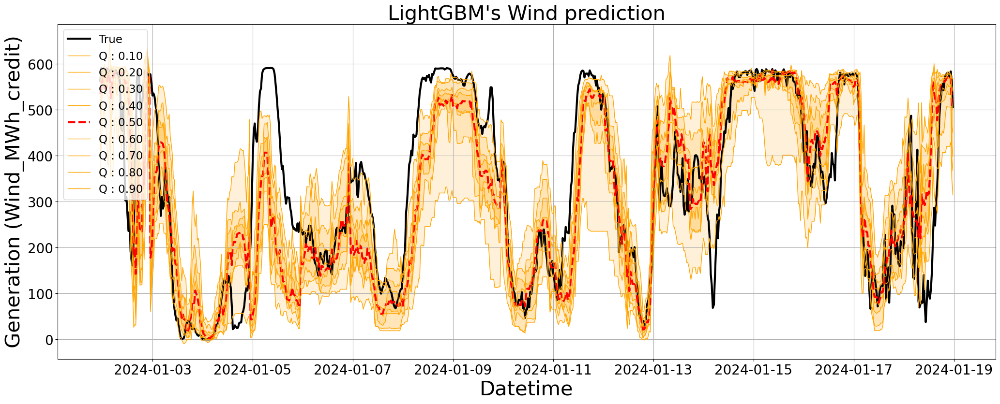

Day-2024-01-01 23:00 ~ 2024-01-02 22:30's Pinball Score (Wind) : 44.05250121184334
Day-2024-01-02 23:00 ~ 2024-01-03 22:30's Pinball Score (Wind) : 34.36925680599356
Day-2024-01-03 23:00 ~ 2024-01-04 22:30's Pinball Score (Wind) : 26.159062795783242
Day-2024-01-04 23:00 ~ 2024-01-05 22:30's Pinball Score (Wind) : 101.38169798086307
Day-2024-01-05 23:00 ~ 2024-01-06 22:30's Pinball Score (Wind) : 15.289630054174088
Day-2024-01-06 23:00 ~ 2024-01-07 22:30's Pinball Score (Wind) : 33.05099040267675
Day-2024-01-07 23:00 ~ 2024-01-08 22:30's Pinball Score (Wind) : 54.172900434947536
Day-2024-01-08 23:00 ~ 2024-01-09 22:30's Pinball Score (Wind) : 31.80834926006662
Day-2024-01-09 23:00 ~ 2024-01-10 22:30's Pinball Score (Wind) : 13.80228840791714
Day-2024-01-10 23:00 ~ 2024-01-11 22:30's Pinball Score (Wind) : 38.48609415777197
Day-2024-01-11 23:00 ~ 2024-01-12 22:30's Pinball Score (Wind) : 13.645814290759791
Day-2024-01-12 23:00 ~ 2024-01-13 22:30's Pinball Score (Wind) : 28.27634975510015

In [1755]:
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

output_table.index = df_test.valid_datetime

#output_table = output_table[48*9:].copy()

visualize_wind_forecating(output_table, output_table['Wind_MWh_credit'], model_name="LightGBM")

# daily pinball score
for i in np.arange(len(output_table)//48):
    daily_pinball_score = pinball_score(output_table.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    print(f"Day-{str(output_table.index[i*48])[:16]} ~ {str(output_table.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")

print(f"Mean pinball score : {pinball_score(output_table, target='Wind_MWh_credit')}")

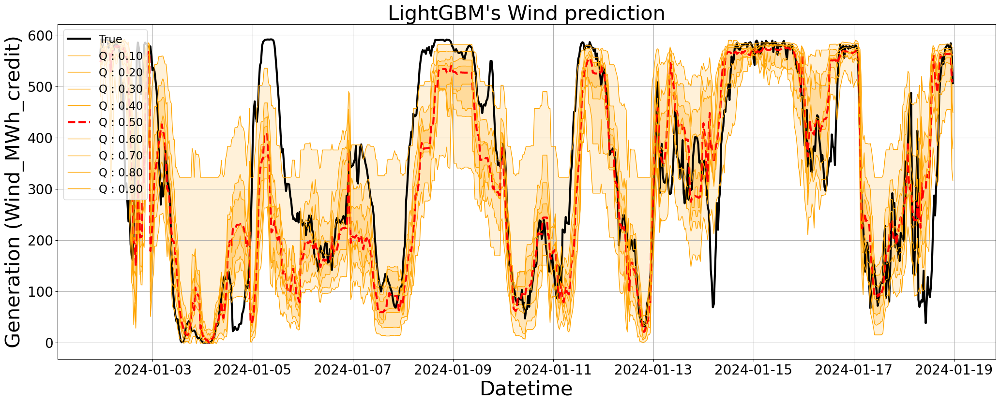

Day-2024-01-01 23:00 ~ 2024-01-02 22:30's Pinball Score (Wind) : 42.58174728611364
Day-2024-01-02 23:00 ~ 2024-01-03 22:30's Pinball Score (Wind) : 33.97421426490482
Day-2024-01-03 23:00 ~ 2024-01-04 22:30's Pinball Score (Wind) : 26.793607479462462
Day-2024-01-04 23:00 ~ 2024-01-05 22:30's Pinball Score (Wind) : 92.94754090034121
Day-2024-01-05 23:00 ~ 2024-01-06 22:30's Pinball Score (Wind) : 15.388009840430612
Day-2024-01-06 23:00 ~ 2024-01-07 22:30's Pinball Score (Wind) : 31.315318009598318
Day-2024-01-07 23:00 ~ 2024-01-08 22:30's Pinball Score (Wind) : 49.56327642556058
Day-2024-01-08 23:00 ~ 2024-01-09 22:30's Pinball Score (Wind) : 30.033630657315136
Day-2024-01-09 23:00 ~ 2024-01-10 22:30's Pinball Score (Wind) : 15.030494150572249
Day-2024-01-10 23:00 ~ 2024-01-11 22:30's Pinball Score (Wind) : 35.53884364567011
Day-2024-01-11 23:00 ~ 2024-01-12 22:30's Pinball Score (Wind) : 13.75140664477454
Day-2024-01-12 23:00 ~ 2024-01-13 22:30's Pinball Score (Wind) : 28.80543234359454

In [1857]:
preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in lgb_model_list]
preds_df = pd.DataFrame(preds_list).T

inv_test_output = scalerY.inverse_transform(test_output)

output_table = pd.concat([preds_df, pd.DataFrame(inv_test_output)], axis=1)
output_table.columns = [f"q{qu}" for qu in range(10, 100, 10)] + target

output_table.index = df_test.valid_datetime

#output_table = output_table[48*9:].copy()

visualize_wind_forecating(output_table, output_table['Wind_MWh_credit'], model_name="LightGBM")

# daily pinball score
for i in np.arange(len(output_table)//48):
    daily_pinball_score = pinball_score(output_table.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    print(f"Day-{str(output_table.index[i*48])[:16]} ~ {str(output_table.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")

print(f"Mean pinball score : {pinball_score(output_table, target='Wind_MWh_credit')}")

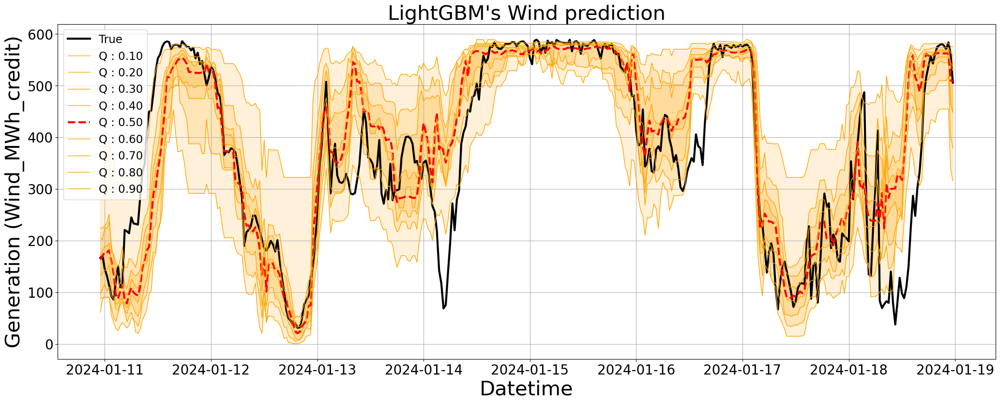

Day-2024-01-10 23:00 ~ 2024-01-11 22:30's Pinball Score (Wind) : 35.53884364567011
Day-2024-01-11 23:00 ~ 2024-01-12 22:30's Pinball Score (Wind) : 13.75140664477454
Day-2024-01-12 23:00 ~ 2024-01-13 22:30's Pinball Score (Wind) : 28.805432343594546
Day-2024-01-13 23:00 ~ 2024-01-14 22:30's Pinball Score (Wind) : 33.52871732285547
Day-2024-01-14 23:00 ~ 2024-01-15 22:30's Pinball Score (Wind) : 5.8524354342004195
Day-2024-01-15 23:00 ~ 2024-01-16 22:30's Pinball Score (Wind) : 26.900355674923627
Day-2024-01-16 23:00 ~ 2024-01-17 22:30's Pinball Score (Wind) : 16.66833583052676
Day-2024-01-17 23:00 ~ 2024-01-18 22:30's Pinball Score (Wind) : 48.76364767434906
Mean pinball score : 26.174630697010503


In [1758]:
output_table = output_table[48*9:].copy()

visualize_wind_forecating(output_table, output_table['Wind_MWh_credit'], model_name="LightGBM")

# daily pinball score
for i in np.arange(len(output_table)//48):
    daily_pinball_score = pinball_score(output_table.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    print(f"Day-{str(output_table.index[i*48])[:16]} ~ {str(output_table.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")

print(f"Mean pinball score : {pinball_score(output_table, target='Wind_MWh_credit')}")

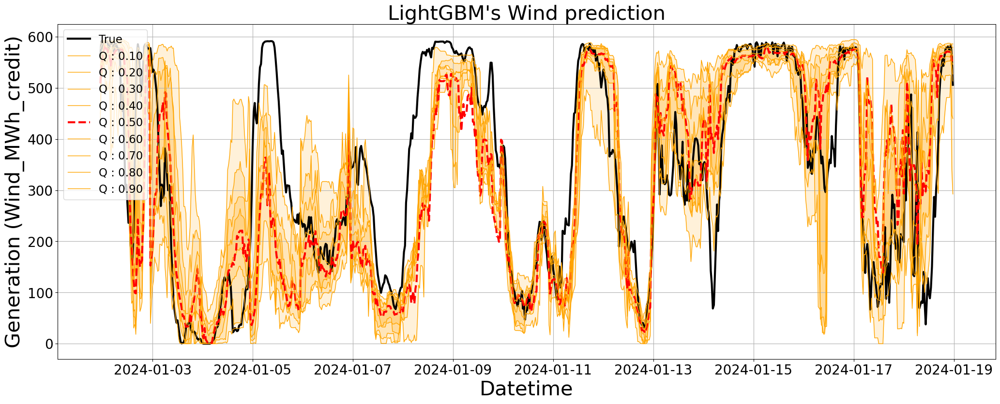

Day-2024-01-01 23:00 ~ 2024-01-02 22:30's Pinball Score (Wind) : 37.407728007865515
Day-2024-01-02 23:00 ~ 2024-01-03 22:30's Pinball Score (Wind) : 39.38096105161921
Day-2024-01-03 23:00 ~ 2024-01-04 22:30's Pinball Score (Wind) : 23.779957796666604
Day-2024-01-04 23:00 ~ 2024-01-05 22:30's Pinball Score (Wind) : 105.04319860710218
Day-2024-01-05 23:00 ~ 2024-01-06 22:30's Pinball Score (Wind) : 17.058460522953226
Day-2024-01-06 23:00 ~ 2024-01-07 22:30's Pinball Score (Wind) : 40.44579295002328
Day-2024-01-07 23:00 ~ 2024-01-08 22:30's Pinball Score (Wind) : 82.00012140208102
Day-2024-01-08 23:00 ~ 2024-01-09 10:30's Pinball Score (Wind) : 24.334554560866003
Day-2024-01-09 11:00 ~ 2024-01-09 22:30's Pinball Score (Wind) : 63.140776393577625
Day-2024-01-09 23:00 ~ 2024-01-10 22:30's Pinball Score (Wind) : 12.310648656765443
Day-2024-01-10 23:00 ~ 2024-01-11 22:30's Pinball Score (Wind) : 34.0938285811386
Day-2024-01-11 23:00 ~ 2024-01-12 22:30's Pinball Score (Wind) : 25.8806884217358

In [845]:
visualize_wind_forecating(output_table, output_table['Wind_MWh_credit'], model_name="LightGBM")

# daily pinball score
for i in np.arange(len(output_table)//48):
    daily_pinball_score = pinball_score(output_table.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    print(f"Day-{str(output_table.index[i*48])[:16]} ~ {str(output_table.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")

print(f"Mean pinball score : {pinball_score(output_table, target='Wind_MWh_credit')}")

In [608]:
# 개선 전
(40.642754087507996+14.93009763754723+37.000490514231025+39.359298077875366+31.349121479321997+5.1649035912734815+33.1292759644634+19.128644254063325+55.37130502054257)/8

34.5094863283533

In [724]:
# 개선 후
(42.44692801990693+16.39414359697789+30.766894464843087+31.349121479321997+5.493393449542345+27.86765411332866+27.943216106920985+52.968663882880435)/8

29.403751889215293

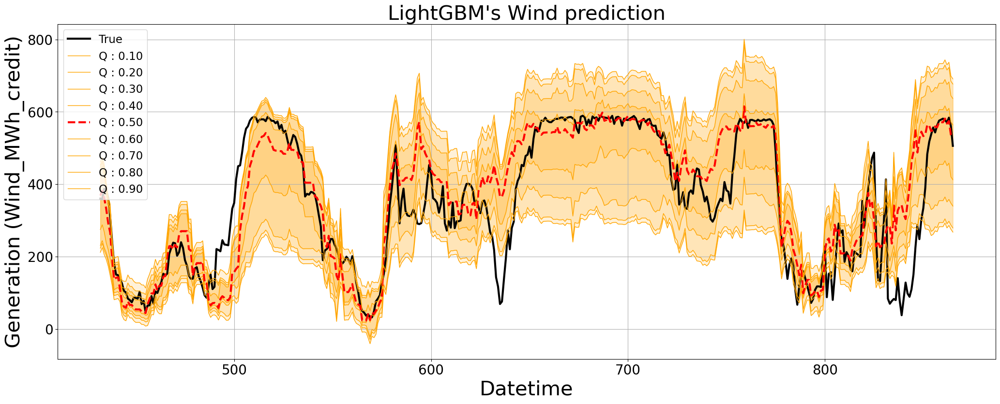

Day-432 ~ 479's Pinball Score (Wind) : 14.094156695544145
Day-480 ~ 527's Pinball Score (Wind) : 43.96220763676105
Day-528 ~ 575's Pinball Score (Wind) : 20.19961951463071
Day-576 ~ 623's Pinball Score (Wind) : 30.76346461152529
Day-624 ~ 671's Pinball Score (Wind) : 42.10256441292549
Day-672 ~ 719's Pinball Score (Wind) : 29.31604853091102
Day-720 ~ 767's Pinball Score (Wind) : 34.52271526765394
Day-768 ~ 815's Pinball Score (Wind) : 24.058356678362415
Day-816 ~ 863's Pinball Score (Wind) : 52.35162545479669
Mean pinball score : 32.3704635716066


In [1470]:
output_table = output_table[48*9:].copy()

visualize_wind_forecating(output_table, output_table['Wind_MWh_credit'], model_name="LightGBM")

# daily pinball score
for i in np.arange(len(output_table)//48):
    daily_pinball_score = pinball_score(output_table.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    print(f"Day-{str(output_table.index[i*48])[:16]} ~ {str(output_table.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")

print(f"Mean pinball score : {pinball_score(output_table, target='Wind_MWh_credit')}")

In [1201]:
# df_test['2024-01-07':'2024-01-09'][:50]

In [1202]:
pd.__version__

'2.1.1'

## Test

In [868]:
def test_data_processing(wind_csv_lists, solar_csv_lists):
    """
    """
    temp_df = pd.DataFrame()
    
    for idx, (wind_file, solar_file) in enumerate(zip(wind_csv_lists, solar_csv_lists)):
    
        print(f"wind_file : {wind_file}, solar_file : {solar_file}")
        
        # 예보 시간 추출 : year-month-day 23:00:00 ~ year-month-(day+1) 22:30:00
        year, month, day = wind_file.split("_")[5][0:4], wind_file.split("_")[5][4:5], wind_file.split("_")[5][5:]
        # year, month, day = wind_file.split("_")[5][0:4], wind_file.split("_")[5][4:6], wind_file.split("_")[5][6:]

        temp_valid_datetime_lower = pd.to_datetime(f"{year}-{month}-{day} 23:00:00")
        temp_valid_datetime_upper = pd.to_datetime(f"{year}-{month}-{int(day)} 22:30:00") + timedelta(hours=24)

        print(f"★valid_datetime boundary : {temp_valid_datetime_lower} ~ {temp_valid_datetime_upper}★")

        # csv 파일 불러오기
        temp_latest_dwd_wind = pd.read_csv(f"data/updated_data/{wind_file}", index_col=0)
        temp_latest_dwd_solar = pd.read_csv(f"data/updated_data/{solar_file}", index_col=0)

        ### 풍력 기상 데이터 후처리
        temp_latest_dwd_wind_features = pd.DataFrame(columns=temp_latest_dwd_wind.columns, data=np.zeros((int(temp_latest_dwd_wind.shape[0]/36), temp_latest_dwd_wind.shape[1])))
        temp_latest_dwd_wind_features.drop(columns=['longitude', 'latitude'], inplace=True)

        for i in range(int(temp_latest_dwd_wind.shape[0]/36)):
            avg = temp_latest_dwd_wind.iloc[36*i:36*(i+1),4:].mean()
            time_idx = temp_latest_dwd_wind.iloc[36*i:36*(i+1),:2].values[0]
            temp_latest_dwd_wind_features.loc[i,avg.keys()] = avg.values
            temp_latest_dwd_wind_features.iloc[i,:2] = time_idx
        
        temp_latest_dwd_wind_features.rename(columns={"PressureReducedMSL" : "pressure_wind"}, inplace=True)
        
        ### 태양광 기상 데이터 후처리
        temp_latest_dwd_solar_features = pd.DataFrame(columns=temp_latest_dwd_solar.columns, data=np.zeros((int(temp_latest_dwd_solar.shape[0]/20), temp_latest_dwd_solar.shape[1])))
        temp_latest_dwd_solar_features.drop(columns=['point', 'longitude', 'latitude'], inplace=True)
        
        for i in range(int(temp_latest_dwd_solar.shape[0]/20)):
            avg = temp_latest_dwd_solar.iloc[20*i:20*(i+1),3:-2].mean()
            time_idx = temp_latest_dwd_solar.iloc[20*i:20*(i+1),:2].values[0]
            temp_latest_dwd_solar_features.loc[i,avg.keys()] = avg.values
            temp_latest_dwd_solar_features.iloc[i,:2] = time_idx
            
        temp_latest_dwd_solar_features.rename(columns={"PressureReducedMSL" : "pressure_pv"}, inplace=True)
        
        ## 위치 기준으로 평균화 및 30분 단위로 시간 변경
        temp_latest_forecast_table = temp_latest_dwd_wind_features.merge(temp_latest_dwd_solar_features, how="inner", on=["valid_datetime", "valid_datetime"])
        temp_latest_forecast_table.valid_datetime = pd.DatetimeIndex(temp_latest_forecast_table.valid_datetime)
        temp_latest_forecast_table = temp_latest_forecast_table.set_index("valid_datetime").resample("30T").interpolate("linear",limit=5).reset_index()
        temp_latest_forecast_table.rename(columns={"Temperature_x":"Temperature_wind", "Temperature_y":"Temperature_solar", 'ref_datetime_x' : 'ref_datetime'}, inplace=True)
        
        ref_datetime = temp_latest_forecast_table["ref_datetime"][0]
        temp_latest_forecast_table['ref_datetime'].fillna(ref_datetime, inplace=True)
        
        
        temp_latest_forecast_table.drop(columns=['ref_datetime_y'], inplace=True)
        test_modeling_columns = temp_latest_forecast_table.columns
        
        # 최근 발표된 기상 데이터만 활용
        temp_latest_forecast_table.set_index('valid_datetime', inplace=True)
        temp_latest_forecast_table.dropna(inplace=True)

        temp_latest_forecast_table.sort_index(inplace=True)
        temp_latest_forecast_table = temp_latest_forecast_table[str(temp_valid_datetime_lower):str(temp_valid_datetime_upper)].reset_index()
        
        temp_df = pd.concat([temp_df, temp_latest_forecast_table])
        
    temp_df.rename(columns={"pressure_wind" : "pressure"}, inplace=True)
    temp_df['pressure'] = temp_df['pressure']/100
    temp_df.drop(columns=['pressure_pv'], inplace=True)
    
    if len(temp_df)%48==0:
        print(f"Preprocess Success : {len(temp_df)}")
    else:
        print("Preprocess Failed")
    
    return temp_df

In [869]:
test_modeling_table = test_data_processing(wind_csv_lists, solar_csv_lists)

wind_file : dwd_icon_eu_hornsea_1_2024213_0_raw.csv, solar_file : dwd_icon_pes10_2024213_0_raw.csv
★valid_datetime boundary : 2024-02-13 23:00:00 ~ 2024-02-14 22:30:00★
wind_file : dwd_icon_eu_hornsea_1_2024214_0_raw.csv, solar_file : dwd_icon_pes10_2024214_0_raw.csv
★valid_datetime boundary : 2024-02-14 23:00:00 ~ 2024-02-15 22:30:00★
wind_file : dwd_icon_eu_hornsea_1_2024215_0_raw.csv, solar_file : dwd_icon_pes10_2024215_0_raw.csv
★valid_datetime boundary : 2024-02-15 23:00:00 ~ 2024-02-16 22:30:00★
wind_file : dwd_icon_eu_hornsea_1_2024216_0_raw.csv, solar_file : dwd_icon_pes10_2024216_0_raw.csv
★valid_datetime boundary : 2024-02-16 23:00:00 ~ 2024-02-17 22:30:00★
wind_file : dwd_icon_eu_hornsea_1_2024217_0_raw.csv, solar_file : dwd_icon_pes10_2024217_0_raw.csv
★valid_datetime boundary : 2024-02-17 23:00:00 ~ 2024-02-18 22:30:00★
wind_file : dwd_icon_eu_hornsea_1_2024218_0_raw.csv, solar_file : dwd_icon_pes10_2024218_0_raw.csv
★valid_datetime boundary : 2024-02-18 23:00:00 ~ 2024-02

In [870]:
WindSpeed_100 = test_modeling_table['WindSpeed:100']
WindDirection_100 = test_modeling_table['WindDirection:100']

test_modeling_table = pd.concat([test_modeling_table,
                       WindSpeed_100.shift(1).rename("WindSpeed:100_30min"),
                       WindSpeed_100.shift(2).rename("WindSpeed:100_60min"),
                      ], axis="columns")

test_modeling_table = pd.concat([test_modeling_table,
                       WindDirection_100.shift(1).rename("WindDirection:100_30min"),
                       WindDirection_100.shift(2).rename("WindDirection:100_60min"),
                      ], axis="columns")

test_modeling_table['WindDirection:100_diff'] = (test_modeling_table['WindDirection:100'] - test_modeling_table['WindDirection:100_30min'])

In [871]:
# target date 설정
now = datetime.now().strftime("%Y-%m-%d")
year, month, day = now.split('-')
target_date = f'{year}-{month}-{day} 00:00:00+00:00'

# test_modeling_table = test_modeling_table[test_modeling_table['ref_datetime'] == target_date].copy()
test_modeling_table = test_modeling_table[test_modeling_table['ref_datetime'] == f'{2024}-0{str(2)}-{13} 00:00:00+00:00'].copy()

In [785]:
df_train_all = re_modelling_table.set_index('ref_datetime')[:'2023-12-31']
df_test = test_modeling_table.copy()

cut = int(len(df_train_all)*0.8)

df_train = df_train_all[:cut]
df_val = df_train_all[cut:]

In [786]:
df_train_all['air_density'] = df_train_all.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_train['air_density'] = df_train.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_val['air_density'] = df_val.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_test['air_density'] = df_test.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)

df_train_all['absolute_humidity'] = df_train_all.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_train['absolute_humidity'] = df_train.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_val['absolute_humidity'] = df_val.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_test['absolute_humidity'] = df_test.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)

df_train_all['air_pressure'] = df_train_all.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_train['air_pressure'] = df_train.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_val['air_pressure'] = df_val.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_test['air_pressure'] = df_test.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)

In [787]:
# 성능 향상 발생 : 0.0
df_train_all['component_x'] = df_train_all['WindSpeed']*np.cos(df_train_all['WindDirection']*np.pi/180)
df_train_all['component_y'] = df_train_all['WindSpeed']*np.sin(df_train_all['WindDirection']*np.pi/180)
df_train_all['component_x:100'] = df_train_all['WindSpeed:100']*np.cos(df_train_all['WindDirection:100']*np.pi/180)
df_train_all['component_y:100'] = df_train_all['WindSpeed:100']*np.sin(df_train_all['WindDirection:100']*np.pi/180)

df_train['component_x'] = df_train['WindSpeed']*np.cos(df_train['WindDirection']*np.pi/180)
df_train['component_y'] = df_train['WindSpeed']*np.sin(df_train['WindDirection']*np.pi/180)
df_train['component_x:100'] = df_train['WindSpeed:100']*np.cos(df_train['WindDirection:100']*np.pi/180)
df_train['component_y:100'] = df_train['WindSpeed:100']*np.sin(df_train['WindDirection:100']*np.pi/180)

df_val['component_x'] = df_val['WindSpeed']*np.cos(df_val['WindDirection']*np.pi/180)
df_val['component_y'] = df_val['WindSpeed']*np.sin(df_val['WindDirection']*np.pi/180)
df_val['component_x:100'] = df_val['WindSpeed:100']*np.cos(df_val['WindDirection:100']*np.pi/180)
df_val['component_y:100'] = df_val['WindSpeed:100']*np.sin(df_val['WindDirection:100']*np.pi/180)

df_test['component_x'] = df_test['WindSpeed']*np.cos(df_test['WindDirection']*np.pi/180)
df_test['component_y'] = df_test['WindSpeed']*np.sin(df_test['WindDirection']*np.pi/180)
df_test['component_x:100'] = df_test['WindSpeed:100']*np.cos(df_test['WindDirection:100']*np.pi/180)
df_test['component_y:100'] = df_test['WindSpeed:100']*np.sin(df_test['WindDirection:100']*np.pi/180)

In [788]:
inputs = [
          #'WindDirection:100', 'WindSpeed:100', 
          #'pressure', 
          'air_density', 
          #'absolute_humidity', 
          #'air_pressure', 
          'component_x', 'component_y',
          'component_x:100', 'component_y:100',
          'WindDirection:100_diff',
          #'WindSpeed:100_30min'
         ]

# 2024-02-16 (튜닝 적용 전)
# inputs = [
#           'air_density', 
#           'absolute_humidity',
#           'component_x',  # 32.78181351741565
#           'component_y', # 33.259726569999835
#           #'component_x:100', # 32.374746740356755
#           'component_y:100', # 32.48754847664273
#           #'WindDirection:100_diff', 
#          ]

# 2024-03-04 ("NCEP" + "DWD" 데이터셋 새롭게 구성함)
inputs = [
          'air_density', 
          'absolute_humidity', 
#           'WindSpeed:100',
#           'WindDirection:100',
          #'component_x',  # 27.689621196731515
          'component_y', # 28.163929415856746
          'component_x:100', # 32.374746740356755
          'component_y:100', # 28.30
          'WindDirection:100_diff',
         ]

target = ['Wind_MWh_credit']

In [789]:
scaler = StandardScaler()
scalerX = scaler.fit(df_train_all[inputs])

test_input = scalerX.transform(df_test[inputs])

scaler = MaxAbsScaler()
scalerY = scalerY.fit(df_train_all[target])

In [790]:
# target date 설정
now = datetime.now().strftime("%Y-%m-%d")

target_date_1 = pd.to_datetime(now) + timedelta(1)
target_date_1 = target_date_1.strftime("%Y-%m-%d")
year, month_1, day_1 = target_date_1.split('-')

In [792]:
# best performance models
#model_names = [f"wind_best_1_slp_lgb_model_q{i}_train_202411.txt" for i in np.arange(1,10)*10]
#model_names = [f"best_1_slp_lgb_model_q{i}_with_noise_cleansing_train_202411.txt" for i in np.arange(1,10)*10]
#model_names = [f"best_1_slp_lgb_model_q{i}_with_noise_cleansing_20240213_train_202412.txt" for i in np.arange(1,10)*10]
# model_names = [f"best_1_slp_lgb_model_q{i}_with_noise_cleansing_20240216_train_202412.txt" for i in np.arange(1,10)*10]
model_names = [f"best_1_slp_lgb_model_q{i}_with_noise_cleansing_20240216_train_202412.txt" for i in np.arange(1,10)*10]

lgb_model_list = [lgb.Booster(model_file=f"models/LightGBM/{model_name}") for model_name in model_names]

lgb_wind_preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in lgb_model_list]
#lgb_wind_preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in model_list]

lgb_wind_preds_df = pd.DataFrame(lgb_wind_preds_list).T

lgb_wind_preds_df.columns = [f"q{qu}" for qu in range(10, 100, 10)] #  + target
# len(lgb_wind_preds_df)

# 출력해서 근주에게 전달
lgb_wind_preds_df.to_csv(f"wind_best_2_slp_lgb_model_q_train_202412_test_2024_{month+day}_{month_1+day_1}.csv")
#lgb_wind_preds_df.to_csv("DL_ML_mean_ensemble_20240126_20240127.csv")

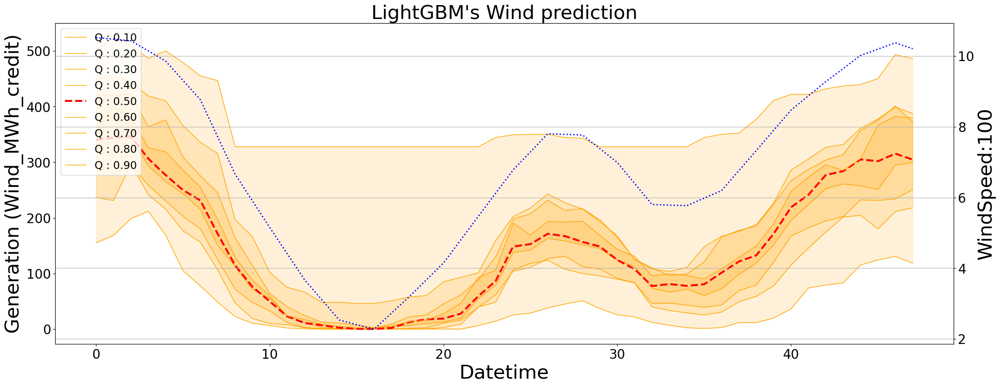

<Axes: xlabel='Datetime', ylabel='Generation (Wind_MWh_credit)'>

In [793]:
def visualize_wind_forecating(pred_df, df_wind ,model_name="LightGBM"):
    fig, ax = plt.subplots(figsize=(25, 9))

    #pred_df['target'] = gt
    
    quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9] # 0,1,2,3,4,5,6,7,8
    n_quantiles = len(quantiles)
    
    # test_y_normalized_inv = inv_test_output[start*48:end*48]
    inv_test_pred = pred_df.copy()
    
    #ax.plot(pred_df['Wind_MWh_credit'], label='True', color = 'black', linewidth = 3)
    
    # 0.1, 0.9
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 0].values.reshape(-1),
                    inv_test_pred.iloc[:, 8].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.2, 0.8
    
    ax.fill_between(inv_test_pred.index, #np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 1].values.reshape(-1),
                    inv_test_pred.iloc[:, 7].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.3, 0.7
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 2].values.reshape(-1),
                    inv_test_pred.iloc[:, 6].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.4, 0.6
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 3].values.reshape(-1),
                    inv_test_pred.iloc[:, 5].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    
    for q_idx in range(n_quantiles):
        if quantiles[q_idx] == 0.5:
            quantile_color = 'red'
            quantile_linestyle = '--'
            quantile_linewidth = 3
            alpha = 1
        else:
            quantile_color = 'orange'
            quantile_linestyle = 'solid'
            quantile_linewidth = 1
            alpha = 1
    
        # ax.plot(test_pred_[start:end,48*q_idx:48*(q_idx+1)].reshape(-1), label = ('Q : %.2f' %quantiles[q_idx]), color = quantile_color, linestyle = quantile_linestyle, linewidth = quantile_linewidth, alpha=alpha)
        ax.plot(inv_test_pred.index,
                inv_test_pred.iloc[:, q_idx].values.reshape(-1), 
                label = ('Q : %.2f' %quantiles[q_idx]), 
                color = quantile_color, 
                linestyle = quantile_linestyle, 
                linewidth = quantile_linewidth, 
                alpha=alpha)
        
    ax2 = ax.twinx()
    ax2.plot(df_wind.index,
             df_wind.values,
             label = f"WindSpeed:100", 
             color = 'blue', 
             linestyle = ':', 
             linewidth = 2, 
             alpha=alpha)    
    
    plt.grid()
    # ax.set(title="Test set : PV power forecasting", ylabel="Normalized Power", xlabel="Time")
    
    
    # plt.title("Test set : PV power forecasting", fontsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(axis='x', labelsize=20)  
    ax.set_xlabel('Datetime', fontsize=30)
    ax.set_ylabel('Generation (Wind_MWh_credit)', fontsize=30)
    
    ax2.tick_params(axis='y', labelsize=20)  
    ax2.set_ylabel('WindSpeed:100', fontsize=30)
    
    plt.title(f"{model_name}'s Wind prediction", fontsize=30)
    legend = ax.legend(loc='upper left',fontsize=20, frameon=1, prop={'size': 16.5})
    plt.show()
    
    return ax

visualize_wind_forecating(lgb_wind_preds_df, test_modeling_table[['WindSpeed:100']])

### Test

In [1103]:
start_time = pd.to_datetime('2024-02-19') 
#today_time = pd.to_datetime(datetime.now())

# start_time = pd.to_datetime('2024-02-13') 
today_time = pd.to_datetime('2024-02-27')

test_date_list = pd.date_range(start_time, today_time, freq='1D')

dwd_wind_csv_lists = ['dwd_icon_eu_hornsea_1_'+str(date.year)+str(date.month)+str(date.day)+'_0_raw.csv' for date in test_date_list]
dwd_solar_csv_lists = ['dwd_icon_pes10_'+str(date.year)+str(date.month)+str(date.day)+'_0_raw.csv' for date in test_date_list]

ncep_wind_csv_lists = ['ncep_gfs_hornsea_1_'+str(date.year)+str(date.month)+str(date.day)+'_0_raw.csv' for date in test_date_list]
ncpe_solar_csv_lists = ['ncep_gfs_pes10_'+str(date.year)+str(date.month)+str(date.day)+'_0_raw.csv' for date in test_date_list]

In [1104]:
def test_data_processing(wind_csv_lists, solar_csv_lists, forecast_model):
    """
    """
    temp_df = pd.DataFrame()
    
    for idx, (wind_file, solar_file) in enumerate(zip(wind_csv_lists, solar_csv_lists)):
    
        print(f"wind_file : {wind_file}, solar_file : {solar_file}")
        
        # 예보 시간 추출 : year-month-day 23:00:00 ~ year-month-(day+1) 22:30:00
        # csv 파일 불러오기
        # DWD
        if forecast_model == 'dwd':            
            year, month, day = wind_file.split("_")[5][0:4], wind_file.split("_")[5][4:5], wind_file.split("_")[5][5:]
            temp_latest_dwd_wind = pd.read_csv(f"data/updated_data/{wind_file}", index_col=0)
            temp_latest_dwd_solar = pd.read_csv(f"data/updated_data/{solar_file}", index_col=0)
            winb_site = 36 # 6x6
        # NCEP
        if forecast_model == 'ncep':
            year, month, day = wind_file.split("_")[4][0:4], wind_file.split("_")[4][4:5], wind_file.split("_")[4][5:]
            temp_latest_dwd_wind = pd.read_csv(f"data/NCEP/{wind_file}", index_col=0)
            temp_latest_dwd_solar = pd.read_csv(f"data/NCEP/{solar_file}", index_col=0)
            winb_site = 9 # 3x3
        
        temp_valid_datetime_lower = pd.to_datetime(f"{year}-{month}-{day} 23:00:00")
        temp_valid_datetime_upper = pd.to_datetime(f"{year}-{month}-{int(day)} 22:30:00") + timedelta(hours=24)

        print(f"★valid_datetime boundary : {temp_valid_datetime_lower} ~ {temp_valid_datetime_upper}★")

        ### 풍력 기상 데이터 후처리
        temp_latest_dwd_wind_features = pd.DataFrame(columns=temp_latest_dwd_wind.columns, data=np.zeros((int(temp_latest_dwd_wind.shape[0]/36), temp_latest_dwd_wind.shape[1])))
        temp_latest_dwd_wind_features.drop(columns=['longitude', 'latitude'], inplace=True)

        for i in range(int(temp_latest_dwd_wind.shape[0]/winb_site)):
            avg = temp_latest_dwd_wind.iloc[winb_site*i:winb_site*(i+1),4:].mean()
            time_idx = temp_latest_dwd_wind.iloc[winb_site*i:winb_site*(i+1),:2].values[0]
            temp_latest_dwd_wind_features.loc[i,avg.keys()] = avg.values
            temp_latest_dwd_wind_features.iloc[i,:2] = time_idx
        
        temp_latest_dwd_wind_features.rename(columns={"PressureReducedMSL" : "pressure_wind"}, inplace=True)
        
        ### 태양광 기상 데이터 후처리
        temp_latest_dwd_solar_features = pd.DataFrame(columns=temp_latest_dwd_solar.columns, data=np.zeros((int(temp_latest_dwd_solar.shape[0]/20), temp_latest_dwd_solar.shape[1])))
        temp_latest_dwd_solar_features.drop(columns=['point', 'longitude', 'latitude'], inplace=True)
        
        for i in range(int(temp_latest_dwd_solar.shape[0]/20)):
            avg = temp_latest_dwd_solar.iloc[20*i:20*(i+1),3:-2].mean()
            time_idx = temp_latest_dwd_solar.iloc[20*i:20*(i+1),:2].values[0]
            temp_latest_dwd_solar_features.loc[i,avg.keys()] = avg.values
            temp_latest_dwd_solar_features.iloc[i,:2] = time_idx
            
        temp_latest_dwd_solar_features.rename(columns={"PressureReducedMSL" : "pressure_pv"}, inplace=True)
        
        ## 위치 기준으로 평균화 및 30분 단위로 시간 변경
        temp_latest_forecast_table = temp_latest_dwd_wind_features.merge(temp_latest_dwd_solar_features, how="inner", on=["valid_datetime", "valid_datetime"])
        temp_latest_forecast_table.valid_datetime = pd.DatetimeIndex(temp_latest_forecast_table.valid_datetime)
        temp_latest_forecast_table = temp_latest_forecast_table.set_index("valid_datetime").resample("30T").interpolate("linear",limit=5).reset_index()
        temp_latest_forecast_table.rename(columns={"Temperature_x":"Temperature_wind", "Temperature_y":"Temperature_solar", 'ref_datetime_x' : 'ref_datetime'}, inplace=True)
        
        ref_datetime = temp_latest_forecast_table["ref_datetime"][0]
        temp_latest_forecast_table['ref_datetime'].fillna(ref_datetime, inplace=True)
        
        
        temp_latest_forecast_table.drop(columns=['ref_datetime_y'], inplace=True)
        test_modeling_columns = temp_latest_forecast_table.columns
        
        # 최근 발표된 기상 데이터만 활용
        temp_latest_forecast_table.set_index('valid_datetime', inplace=True)
        temp_latest_forecast_table.dropna(inplace=True)
        
        temp_latest_forecast_table.sort_index(inplace=True)
        temp_latest_forecast_table = temp_latest_forecast_table[str(temp_valid_datetime_lower):str(temp_valid_datetime_upper)].reset_index()
        
        print(f"temp_latest_forecast_table : {len(temp_latest_forecast_table)}")
        
        temp_df = pd.concat([temp_df, temp_latest_forecast_table])
        
    temp_df.rename(columns={"pressure_wind" : "pressure"}, inplace=True)
    temp_df['pressure'] = temp_df['pressure']/100
    temp_df.drop(columns=['pressure_pv'], inplace=True)
    
    if len(temp_df)%48==0:
        print(f"Preprocess Success : {len(temp_df)}")
    else:
        print(f"Preprocess Failed")
    
    return temp_df

In [1186]:
dwd_test_modeling_table = test_data_processing(dwd_wind_csv_lists, dwd_solar_csv_lists, forecast_model='dwd')

wind_file : dwd_icon_eu_hornsea_1_2024219_0_raw.csv, solar_file : dwd_icon_pes10_2024219_0_raw.csv
★valid_datetime boundary : 2024-02-19 23:00:00 ~ 2024-02-20 22:30:00★
temp_latest_forecast_table : 48
wind_file : dwd_icon_eu_hornsea_1_2024220_0_raw.csv, solar_file : dwd_icon_pes10_2024220_0_raw.csv
★valid_datetime boundary : 2024-02-20 23:00:00 ~ 2024-02-21 22:30:00★
temp_latest_forecast_table : 48
wind_file : dwd_icon_eu_hornsea_1_2024221_0_raw.csv, solar_file : dwd_icon_pes10_2024221_0_raw.csv
★valid_datetime boundary : 2024-02-21 23:00:00 ~ 2024-02-22 22:30:00★
temp_latest_forecast_table : 48
wind_file : dwd_icon_eu_hornsea_1_2024222_0_raw.csv, solar_file : dwd_icon_pes10_2024222_0_raw.csv
★valid_datetime boundary : 2024-02-22 23:00:00 ~ 2024-02-23 22:30:00★
temp_latest_forecast_table : 48
wind_file : dwd_icon_eu_hornsea_1_2024223_0_raw.csv, solar_file : dwd_icon_pes10_2024223_0_raw.csv
★valid_datetime boundary : 2024-02-23 23:00:00 ~ 2024-02-24 22:30:00★
temp_latest_forecast_table 

In [1187]:
ncep_test_modeling_table = test_data_processing(ncep_wind_csv_lists, ncpe_solar_csv_lists, forecast_model='ncep')

wind_file : ncep_gfs_hornsea_1_2024219_0_raw.csv, solar_file : ncep_gfs_pes10_2024219_0_raw.csv
★valid_datetime boundary : 2024-02-19 23:00:00 ~ 2024-02-20 22:30:00★
temp_latest_forecast_table : 48
wind_file : ncep_gfs_hornsea_1_2024220_0_raw.csv, solar_file : ncep_gfs_pes10_2024220_0_raw.csv
★valid_datetime boundary : 2024-02-20 23:00:00 ~ 2024-02-21 22:30:00★
temp_latest_forecast_table : 48
wind_file : ncep_gfs_hornsea_1_2024221_0_raw.csv, solar_file : ncep_gfs_pes10_2024221_0_raw.csv
★valid_datetime boundary : 2024-02-21 23:00:00 ~ 2024-02-22 22:30:00★
temp_latest_forecast_table : 48
wind_file : ncep_gfs_hornsea_1_2024222_0_raw.csv, solar_file : ncep_gfs_pes10_2024222_0_raw.csv
★valid_datetime boundary : 2024-02-22 23:00:00 ~ 2024-02-23 22:30:00★
temp_latest_forecast_table : 48
wind_file : ncep_gfs_hornsea_1_2024223_0_raw.csv, solar_file : ncep_gfs_pes10_2024223_0_raw.csv
★valid_datetime boundary : 2024-02-23 23:00:00 ~ 2024-02-24 22:30:00★
temp_latest_forecast_table : 48
wind_file 

In [1188]:
merged_df_modeling_table = pd.concat([dwd_test_modeling_table, ncep_test_modeling_table], axis=0)
test_modeling_table = merged_df_modeling_table.groupby(['ref_datetime', 'valid_datetime']).mean().reset_index()

In [1189]:
WindSpeed_100 = test_modeling_table['WindSpeed:100']
WindDirection_100 = test_modeling_table['WindDirection:100']

test_modeling_table = pd.concat([test_modeling_table,
                       WindSpeed_100.shift(1).rename("WindSpeed:100_30min"),
                       WindSpeed_100.shift(2).rename("WindSpeed:100_60min"),
                      ], axis="columns")

test_modeling_table = pd.concat([test_modeling_table,
                       WindDirection_100.shift(1).rename("WindDirection:100_30min"),
                       WindDirection_100.shift(2).rename("WindDirection:100_60min"),
                      ], axis="columns")

test_modeling_table['WindDirection:100_diff'] = (test_modeling_table['WindDirection:100'] - test_modeling_table['WindDirection:100_30min'])

In [1190]:
# target date 설정
now = datetime.now().strftime("%Y-%m-%d")
year, month, day = now.split('-')
target_date = f'{year}-{month}-{day} 00:00:00+00:00'

# 특정 날 
#test_modeling_table = test_modeling_table[test_modeling_table['ref_datetime'] == target_date].copy()
test_modeling_table = test_modeling_table[test_modeling_table['ref_datetime'] == f'{2024}-0{str(2)}-{21} 00:00:00+00:00'].copy()

In [1191]:
df_train_all = re_modelling_table.set_index('ref_datetime')[:'2023-12-31']
df_test = test_modeling_table.copy()

cut = int(len(df_train_all)*0.8)

df_train = df_train_all[:cut]
df_val = df_train_all[cut:]

In [1192]:
df_train_all['air_density'] = df_train_all.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_train['air_density'] = df_train.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_val['air_density'] = df_val.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_test['air_density'] = df_test.apply(lambda x : air_density(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)

df_train_all['absolute_humidity'] = df_train_all.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_train['absolute_humidity'] = df_train.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_val['absolute_humidity'] = df_val.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)
df_test['absolute_humidity'] = df_test.apply(lambda x : calculate_absolute_humidity(x['WindSpeed:100'], x['WindDirection:100'], x['Temperature_wind'], x['pressure'], x['RelativeHumidity']), axis=1)

df_train_all['air_pressure'] = df_train_all.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_train['air_pressure'] = df_train.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_val['air_pressure'] = df_val.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)
df_test['air_pressure'] = df_test.apply(lambda x : calculate_air_pressure(x['pressure'], x['Temperature_wind'], x['RelativeHumidity']), axis=1)

In [1193]:
# 성능 향상 발생 : 0.0
df_train_all['component_x'] = df_train_all['WindSpeed']*np.cos(df_train_all['WindDirection']*np.pi/180)
df_train_all['component_y'] = df_train_all['WindSpeed']*np.sin(df_train_all['WindDirection']*np.pi/180)
df_train_all['component_x:100'] = df_train_all['WindSpeed:100']*np.cos(df_train_all['WindDirection:100']*np.pi/180)
df_train_all['component_y:100'] = df_train_all['WindSpeed:100']*np.sin(df_train_all['WindDirection:100']*np.pi/180)

df_train['component_x'] = df_train['WindSpeed']*np.cos(df_train['WindDirection']*np.pi/180)
df_train['component_y'] = df_train['WindSpeed']*np.sin(df_train['WindDirection']*np.pi/180)
df_train['component_x:100'] = df_train['WindSpeed:100']*np.cos(df_train['WindDirection:100']*np.pi/180)
df_train['component_y:100'] = df_train['WindSpeed:100']*np.sin(df_train['WindDirection:100']*np.pi/180)

df_val['component_x'] = df_val['WindSpeed']*np.cos(df_val['WindDirection']*np.pi/180)
df_val['component_y'] = df_val['WindSpeed']*np.sin(df_val['WindDirection']*np.pi/180)
df_val['component_x:100'] = df_val['WindSpeed:100']*np.cos(df_val['WindDirection:100']*np.pi/180)
df_val['component_y:100'] = df_val['WindSpeed:100']*np.sin(df_val['WindDirection:100']*np.pi/180)

df_test['component_x'] = df_test['WindSpeed']*np.cos(df_test['WindDirection']*np.pi/180)
df_test['component_y'] = df_test['WindSpeed']*np.sin(df_test['WindDirection']*np.pi/180)
df_test['component_x:100'] = df_test['WindSpeed:100']*np.cos(df_test['WindDirection:100']*np.pi/180)
df_test['component_y:100'] = df_test['WindSpeed:100']*np.sin(df_test['WindDirection:100']*np.pi/180)

In [1194]:
# 27.6996
inputs = [
          'air_density', 
          'absolute_humidity', 
          #'WindSpeed:100',
          #'WindDirection:100',
          #'component_x',  # 27.689621196731515
          'component_y', # 28.163929415856746
          'component_x:100', # 32.374746740356755
          'component_y:100', # 28.30
          'WindDirection:100_diff',
         ]

target = ['Wind_MWh_credit']

In [1195]:
scaler = StandardScaler()
scalerX = scaler.fit(df_train_all[inputs])

test_input = scalerX.transform(df_test[inputs])

scaler = MaxAbsScaler()
scalerY = scalerY.fit(df_train_all[target])

In [1196]:
# target date 설정
now = datetime.now().strftime("%Y-%m-%d")

target_date_1 = pd.to_datetime(now) + timedelta(1)
target_date_1 = target_date_1.strftime("%Y-%m-%d")
year, month_1, day_1 = target_date_1.split('-')

In [1198]:
# best performance models
#model_names = [f"wind_best_1_slp_lgb_model_q{i}_train_202411.txt" for i in np.arange(1,10)*10]
#model_names = [f"best_1_slp_lgb_model_q{i}_with_noise_cleansing_train_202411.txt" for i in np.arange(1,10)*10]
#model_names = [f"best_1_slp_lgb_model_q{i}_with_noise_cleansing_20240213_train_202412.txt" for i in np.arange(1,10)*10]
model_names = [f"best_1_dwd00_ncep00_slp_lgb_model_q{i}_with_noise_cleansing_20240303_train_202412.txt" for i in np.arange(1,10)*10]

#best_1_dwd00_ncep00_slp_lgb_model_10_with_noise_cleansing_20240303_train_202412.txt
lgb_model_list = [lgb.Booster(model_file=f"models/LightGBM/{model_name}") for model_name in model_names]

lgb_wind_preds_list = [scalerY.inverse_transform(model.predict(test_input).reshape(-1, 1)).reshape(-1) for model in lgb_model_list]

lgb_wind_preds_df = pd.DataFrame(lgb_wind_preds_list).T

lgb_wind_preds_df.columns = [f"q{qu}" for qu in range(10, 100, 10)] #  + target

#lgb_wind_preds_df.to_csv(f"wind_best_2_slp_lgb_model_q_train_202412_test_2024_{month+day}_{month_1+day_1}.csv")
lgb_wind_preds_df.to_csv(f"ML_wind_forecast_dwd_ncep_slp_using_lgb_model_q_train_202412_test_2024_02_22.csv")

In [1199]:
def visualize_wind_forecating(pred_df, df_wind ,model_name="LightGBM"):
    fig, ax = plt.subplots(figsize=(25, 9))

    #pred_df['target'] = gt
    
    quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9] # 0,1,2,3,4,5,6,7,8
    n_quantiles = len(quantiles)
    
    # test_y_normalized_inv = inv_test_output[start*48:end*48]
    inv_test_pred = pred_df.copy()
    inv_test_pred.index = df_wind['valid_datetime']
    #ax.plot(pred_df['Wind_MWh_credit'], label='True', color = 'black', linewidth = 3)
    
    # 0.1, 0.9
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 0].values.reshape(-1),
                    inv_test_pred.iloc[:, 8].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.2, 0.8
    
    ax.fill_between(inv_test_pred.index, #np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 1].values.reshape(-1),
                    inv_test_pred.iloc[:, 7].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.3, 0.7
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 2].values.reshape(-1),
                    inv_test_pred.iloc[:, 6].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.4, 0.6
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 3].values.reshape(-1),
                    inv_test_pred.iloc[:, 5].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    
    for q_idx in range(n_quantiles):
        if quantiles[q_idx] == 0.5:
            quantile_color = 'red'
            quantile_linestyle = '--'
            quantile_linewidth = 3
            alpha = 1
        else:
            quantile_color = 'orange'
            quantile_linestyle = 'solid'
            quantile_linewidth = 1
            alpha = 1
    
        # ax.plot(test_pred_[start:end,48*q_idx:48*(q_idx+1)].reshape(-1), label = ('Q : %.2f' %quantiles[q_idx]), color = quantile_color, linestyle = quantile_linestyle, linewidth = quantile_linewidth, alpha=alpha)
        ax.plot(inv_test_pred.index,
                inv_test_pred.iloc[:, q_idx].values.reshape(-1), 
                label = ('Q : %.2f' %quantiles[q_idx]), 
                color = quantile_color, 
                linestyle = quantile_linestyle, 
                linewidth = quantile_linewidth, 
                alpha=alpha)
        
    ax2 = ax.twinx()
    ax2.plot(df_wind['valid_datetime'],
             df_wind['WindSpeed:100'],
             label = f"WindSpeed:100", 
             color = 'blue', 
             linestyle = ':', 
             linewidth = 2, 
             alpha=alpha)    
    
    # ax.set(title="Test set : PV power forecasting", ylabel="Normalized Power", xlabel="Time")
    
    
    # plt.title("Test set : PV power forecasting", fontsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(axis='x', labelsize=20)  
    ax.set_xlabel('Datetime', fontsize=30)
    ax.set_ylabel('Generation (Wind_MWh_credit)', fontsize=30)
    ax.set_ylim(0, 700)

    ax2.tick_params(axis='y', labelsize=20)  
    ax2.set_ylabel('WindSpeed:100', fontsize=30)
    ax2.set_ylim(0, 30)
    plt.title(f"{model_name}'s Wind prediction", fontsize=30)
    legend = ax.legend(loc='upper left',fontsize=20, frameon=1, prop={'size': 16.5})
    
    ax.grid(linestyle = '--', color='0.6')
    #ax2.grid(None)
    
    plt.show()
    
    return ax

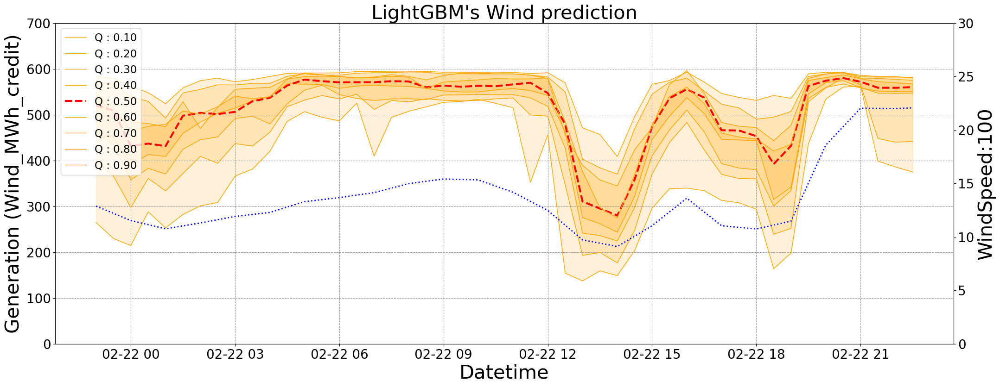

<Axes: xlabel='Datetime', ylabel='Generation (Wind_MWh_credit)'>

In [1200]:
visualize_wind_forecating(lgb_wind_preds_df, df_test[['valid_datetime', 'WindSpeed:100']],model_name="LightGBM")

In [145]:
import comp_utils

rebase_api_client = comp_utils.RebaseAPI(api_key = open("team_key.txt").read()[:-1])

date_range = pd.date_range(start='2024-02-14', end='2024-02-24', freq='D')

df_test_output_wind = pd.DataFrame()
for inx, temp_date in enumerate(date_range):
    temp_date = temp_date.strftime("%Y-%m-%d")
    temp_df_test_output = rebase_api_client.get_variable(day=temp_date, variable="wind_total_production").rename(columns={'timestamp_utc' : 'valid_datetime', 'generation_mw' : 'Wind_MWh_credit'})[['valid_datetime', 'Wind_MWh_credit']]
    df_test_output_wind = pd.concat([df_test_output_wind, temp_df_test_output], axis=0)
    
df_test_output_wind['valid_datetime'] = pd.to_datetime(df_test_output_wind['valid_datetime'])
df_test_output_wind = df_test_output_wind.set_index('valid_datetime')
    
df_test_output_solar = pd.DataFrame()
for inx, temp_date in enumerate(date_range):
    temp_date = temp_date.strftime("%Y-%m-%d")
    temp_df_test_output = rebase_api_client.get_variable(day=temp_date, variable="solar_total_production").rename(columns={'timestamp_utc' : 'valid_datetime', 'generation_mw' : 'Wind_MWh_credit'})[['valid_datetime', 'Wind_MWh_credit']]
    df_test_output_solar = pd.concat([df_test_output_solar, temp_df_test_output], axis=0)

In [207]:
temp_energy_data = pd.read_csv("data/Energy_Data_20200920_20240118.csv")
temp_energy_data["dtm"] = pd.to_datetime(temp_energy_data["dtm"])

In [212]:
def visualize_wind_forecating_with_target(pred_df, df_wind ,model_name="LightGBM", datetime=['2024-02-19 23:00:00', '2024-02-21 22:30:00']):
    fig, ax = plt.subplots(figsize=(25, 9))

    #pred_df['target'] = gt
    
    quantiles = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9] # 0,1,2,3,4,5,6,7,8
    n_quantiles = len(quantiles)
    
    # test_y_normalized_inv = inv_test_output[start*48:end*48]
    inv_test_pred = pred_df.copy()
    inv_test_pred.index = df_wind['valid_datetime']
    
    ax.plot(inv_test_pred.index,
            inv_test_pred['Wind_MWh_credit'], label='True', color = 'black', linewidth = 3)
    
    # 0.1, 0.9
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 0].values.reshape(-1),
                    inv_test_pred.iloc[:, 8].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.2, 0.8
    
    ax.fill_between(inv_test_pred.index, #np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 1].values.reshape(-1),
                    inv_test_pred.iloc[:, 7].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.3, 0.7
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 2].values.reshape(-1),
                    inv_test_pred.iloc[:, 6].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    # 0.4, 0.6
    ax.fill_between(inv_test_pred.index, # np.arange((end - start)*48), 
                    inv_test_pred.iloc[:, 3].values.reshape(-1),
                    inv_test_pred.iloc[:, 5].values.reshape(-1),
                    color = 'orange', alpha = 0.15)
    
    for q_idx in range(n_quantiles):
        if quantiles[q_idx] == 0.5:
            quantile_color = 'red'
            quantile_linestyle = '--'
            quantile_linewidth = 3
            alpha = 1
        else:
            quantile_color = 'orange'
            quantile_linestyle = 'solid'
            quantile_linewidth = 1
            alpha = 1
    
        # ax.plot(test_pred_[start:end,48*q_idx:48*(q_idx+1)].reshape(-1), label = ('Q : %.2f' %quantiles[q_idx]), color = quantile_color, linestyle = quantile_linestyle, linewidth = quantile_linewidth, alpha=alpha)
        ax.plot(inv_test_pred.index,
                inv_test_pred.iloc[:, q_idx].values.reshape(-1), 
                label = ('Q : %.2f' %quantiles[q_idx]), 
                color = quantile_color, 
                linestyle = quantile_linestyle, 
                linewidth = quantile_linewidth, 
                alpha=alpha)
    
    ax.vlines(pd.to_datetime('2024-02-19 23:00:00'), 
              ymin=0, ymax=700, 
              colors='purple', 
              linestyle='--',
              linewidth=5)
    
    ax2 = ax.twinx()
    ax2.plot(df_wind['valid_datetime'],
             df_wind.iloc[:,1],
             label = f"{df_wind.columns[-1]}", 
             color = 'blue', 
             linestyle = ':', 
             linewidth = 2, 
             alpha=alpha)    
    
    # ax.set(title="Test set : PV power forecasting", ylabel="Normalized Power", xlabel="Time")
    
    
    # plt.title("Test set : PV power forecasting", fontsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(axis='x', labelsize=20)  
    ax.set_xlabel('Datetime', fontsize=30)
    ax.set_ylabel('Generation (Wind_MWh_credit)', fontsize=30)
    ax.set_ylim(0, 700)

    ax2.tick_params(axis='y', labelsize=20)  
    ax2.set_ylabel(f'{df_wind.columns[-1]}', fontsize=30)
    ax2.set_ylim(0, 30)
    plt.title(f"{model_name}'s Wind prediction", fontsize=30)
    legend = ax.legend(loc='upper left',fontsize=20, frameon=1, prop={'size': 16.5})
    
    ax.grid(linestyle = '--', color='0.6')
    #ax2.grid(None)
    ax.set_xlim(pd.to_datetime(datetime[0]), pd.to_datetime(datetime[1]))
    plt.show()
    
    return ax

In [544]:
lgb_wind_preds_df.index = df_test['valid_datetime']

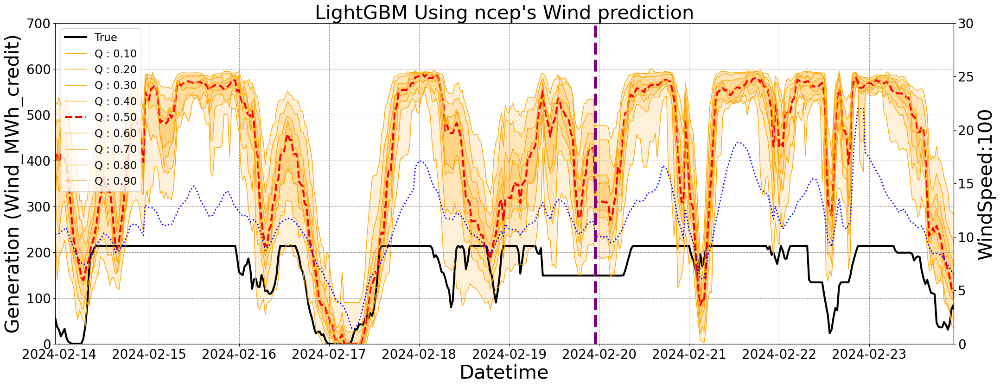

<Axes: xlabel='Datetime', ylabel='Generation (Wind_MWh_credit)'>

In [545]:
lgb_wind_preds_df['Wind_MWh_credit'] = df_test_output_wind['Wind_MWh_credit'].values/2

visualize_wind_forecating_with_target(lgb_wind_preds_df,
                                      df_test[['valid_datetime', 'WindSpeed:100']] ,
                                      model_name="LightGBM Using ncep",
                                      datetime=['2024-02-13 23:00:00', '2024-02-23 22:30:00'])

In [546]:
# daily pinball score

for i in np.arange(len(lgb_wind_preds_df)//48):
    daily_pinball_score = pinball_score(lgb_wind_preds_df.iloc[i*48:(i+1)*48,:], target='Wind_MWh_credit')
    print(f"Day-{str(lgb_wind_preds_df.index[i*48])[:16]} ~ {str(lgb_wind_preds_df.index[(i+1)*48-1])[:16]}'s Pinball Score (Wind) : {daily_pinball_score}")
print(f"Mean pinball score : {pinball_score(lgb_wind_preds_df, target='Wind_MWh_credit')}")

Day-2024-02-13 23:00 ~ 2024-02-14 22:30's Pinball Score (Wind) : 72.50007902680485
Day-2024-02-14 23:00 ~ 2024-02-15 22:30's Pinball Score (Wind) : 147.87417650191406
Day-2024-02-15 23:00 ~ 2024-02-16 22:30's Pinball Score (Wind) : 81.93230306341172
Day-2024-02-16 23:00 ~ 2024-02-17 22:30's Pinball Score (Wind) : 47.60042226523417
Day-2024-02-17 23:00 ~ 2024-02-18 22:30's Pinball Score (Wind) : 91.47386076934642
Day-2024-02-18 23:00 ~ 2024-02-19 22:30's Pinball Score (Wind) : 92.54210021295931
Day-2024-02-19 23:00 ~ 2024-02-20 22:30's Pinball Score (Wind) : 117.22636551445255
Day-2024-02-20 23:00 ~ 2024-02-21 22:30's Pinball Score (Wind) : 116.99374785797438
Day-2024-02-21 23:00 ~ 2024-02-22 22:30's Pinball Score (Wind) : 152.65477542894803
Day-2024-02-22 23:00 ~ 2024-02-23 22:30's Pinball Score (Wind) : 123.00372521813081
Day-2024-02-23 23:00 ~ 2024-02-24 22:30's Pinball Score (Wind) : 10.9732187569816
Mean pinball score : 95.88861587419619
